## TOAR database station classifications
### Import libraries

In [1]:
#!pip install fancyimpute
#!pip install -U optuna

In [2]:
import pandas as pd
import numpy as np
import random
import requests
import seaborn as sns
from itertools import product
from pathlib import Path
from sklearn import model_selection
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier, VotingClassifier, RandomForestRegressor
from catboost import CatBoostClassifier, CatBoostRegressor
from lightgbm import LGBMClassifier, LGBMRegressor
from xgboost import XGBClassifier,  plot_importance
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn import manifold
from sklearn.cluster import KMeans, DBSCAN, Birch, HDBSCAN, MeanShift, SpectralClustering

from imblearn.combine import SMOTETomek, SMOTEENN
from imblearn.over_sampling import SMOTE

from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import *
from scipy import stats
from matplotlib.colors import ListedColormap
from scipy.special import inv_boxcox
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from IPython.display import display, Markdown
from collections import Counter
import gc
import cartopy.crs as ccrs
import cartopy
from sklearn.utils import shuffle
import plotly.express as px
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
import warnings
from sklearn.utils import shuffle
from fancyimpute import IterativeImputer
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)
sns.set_style("whitegrid")
font_title = {"family": "serif",
              "color":  "#0b5394", 
              "weight": "bold", 
              "size": 14}
# Graphing…
plt.style.use('fivethirtyeight')
plt.rcParams.update(
    {
     'xtick.labelsize':12,
     'ytick.labelsize':12,
     'axes.labelsize': 12, 
     'legend.fontsize': 12, 
     'axes.titlesize': 12, 
     'axes.titleweight':'bold',
     'axes.titleweight':'bold'
    })

### Some labelled stations for testing

In [3]:
test_cord_urban = ['GB0682A', 'GB1072A', 'GB1095A', 'GB0960A', 'GB1035A', 'DEBE092', 'DEHH026', 'DENW376',  'DEBW118', 'FR04118', 'ES1422A',
                   'IT1016A', '36-081-0124', '13-121-0001', '06-037-4002','openaq_225445', 'jp23105510']

test_cord_suburban = ['GB1092A', 'GB0885A', 'FR21031', '06-037-0019', 'jp20421030']

test_cord_rural = ['GB1055R', 'GB0013R', 'GB0006R', 'IE0031R', 'NO0015R', 'FI00363', 'DENI051', 'DENW192', 'DERP015', 'FR23068','FR19020', 
                   'ES1616A', 'IT1942A', 'MT0001R', '37-105-0002', '08-123-0013','06-111-0005', 'openaq_230819', 'openaq_226125', 
                   'jp21601010']

test_cord = {'urban': test_cord_urban, 'suburban': test_cord_suburban, 'rural': test_cord_rural}
categories = ['urban', 'suburban', 'rural']

### Some useful functions for data preparation and preprocessing

In [4]:
def read_spice_data():
    pass
    
def get_station_codes(n:int = 1000):
    "return the first n station codes in the TOAR databse"
    stations_codes = requests.get(f'https://toar-data.fz-juelich.de/api/v2/search/?limit={n}&fields=codes').json()
    return [station_code['codes'][0] for station_code in stations_codes]

def get_station_cord(station_code):
    data_point = requests.get(f'https://toar-data.fz-juelich.de/api/v2/stationmeta/{station_code}').json()
    cord = {}
    cord['lat'] = data_point['coordinates']['lat']
    cord['lon'] = data_point['coordinates']['lng']
    cord['type_of_area'] = data_point['type_of_area']
    cord['alt'] = data_point['coordinates']['alt']
    return cord

def get_test_data_from_station_code(station_codes):
    type_of_area_truth = []
    type_of_area_given = []
    area_code = []
    lat = []
    lon = []
    alt = []
    for area_type, st_code in station_codes.items():
        for code in st_code:
            data_point_cord = get_station_cord(code)
            lat.append(data_point_cord['lat'])
            lon.append(data_point_cord['lon'])
            alt.append(data_point_cord['alt'])
            type_of_area_truth.append(data_point_cord['type_of_area'])
            type_of_area_given.append(area_type)
            area_code.append(code)
    df = pd.DataFrame({'lat':lat, 'lon':lon, 
                       'area_code': area_code,
                       'type_of_are_toar': type_of_area_truth, 
                       'type_of_area_gmap': type_of_area_given})
    df = df[~(df['type_of_are_toar']=='unknown')]
    return df

In [5]:
# #download and save the hand-labeeled(label using google map) as csv. 
# test_data = get_test_data_from_station_code(test_cord)
# test_data.to_csv('hand_labeled_test_data.csv', index=False)

In [6]:
# This function downloads the dataset from the TAOR-II database. 
# It can be used to refresh the dataset and update the model whenever TAOR-II is updated.
# Note: The dataset has already been downloaded and saved as a CSV file.
def get_N_first_station_data(data_points=None, N:int=1000, n_sample:int=24):
    type_of_area = []
    area_code = []
    lat = []
    lon = []
    alt = []
    mean_topography_srtm_alt_90m_year1994 = []
    mean_topography_srtm_alt_1km_year1994 = []
    max_topography_srtm_relative_alt_5km_year1994 = []
    min_topography_srtm_relative_alt_5km_year1994 = []
    stddev_topography_srtm_relative_alt_5km_year1994 =[]
    climatic_zone_year2016 = []
    
    distance_to_major_road_year2020 = []
    mean_stable_nightlights_1km_year2013 = []
    mean_stable_nightlights_5km_year2013 = []
    max_stable_nightlights_25km_year2013 = []
    
    max_stable_nightlights_25km_year1992 = []
    mean_population_density_250m_year2015 = []
    mean_population_density_5km_year2015 = []
    max_population_density_25km_year2015 = []
    mean_population_density_250m_year1990 = []
    mean_population_density_5km_year1990 = []
    max_population_density_25km_year1990 = []
    mean_nox_emissions_10km_year2015 = []
    mean_nox_emissions_10km_year2000 = []
    
    if data_points is None:
        data_points= [requests.get(f'https://toar-data.fz-juelich.de/api/v2/stationmeta/?limit={N}&offset={i*N}').json() for i in range(n_sample)]
        data_points = [datapoint for datapoints_sublist in data_points for datapoint in datapoints_sublist]              
    for data_point in data_points:
        type_of_area.append(data_point['type_of_area'])
        area_code.append(data_point['codes'][0])
        lat.append(data_point['coordinates']['lat'])
        lon.append(data_point['coordinates']['lng'])
        alt.append(data_point['coordinates']['alt'])
        distance_to_major_road_year2020.append(data_point['globalmeta']['distance_to_major_road_year2020'])
        mean_stable_nightlights_1km_year2013.append(data_point['globalmeta']['mean_stable_nightlights_1km_year2013'])
        mean_stable_nightlights_5km_year2013.append(data_point['globalmeta']['mean_stable_nightlights_5km_year2013'])
        max_stable_nightlights_25km_year2013.append(data_point['globalmeta']['max_stable_nightlights_25km_year2013'])
        max_stable_nightlights_25km_year1992.append(data_point['globalmeta']['max_stable_nightlights_25km_year1992'])
        mean_population_density_250m_year2015.append(data_point['globalmeta']['mean_population_density_250m_year2015'])
        mean_population_density_5km_year2015.append(data_point['globalmeta']['mean_population_density_5km_year2015'])
        max_population_density_25km_year2015.append(data_point['globalmeta']['max_population_density_25km_year2015'])
        mean_population_density_250m_year1990.append(data_point['globalmeta']['mean_population_density_250m_year1990'])
        mean_population_density_5km_year1990.append(data_point['globalmeta']['mean_population_density_5km_year1990'])
        max_population_density_25km_year1990.append(data_point['globalmeta']['max_population_density_25km_year1990'])
        mean_nox_emissions_10km_year2015.append(data_point['globalmeta']['mean_nox_emissions_10km_year2015'])
        mean_nox_emissions_10km_year2000.append(data_point['globalmeta']['mean_nox_emissions_10km_year2000'])
        mean_topography_srtm_alt_90m_year1994.append(data_point['globalmeta']['mean_topography_srtm_alt_90m_year1994'])
        mean_topography_srtm_alt_1km_year1994.append(data_point['globalmeta']['mean_topography_srtm_alt_1km_year1994'])
        max_topography_srtm_relative_alt_5km_year1994.append(data_point['globalmeta']['max_topography_srtm_relative_alt_5km_year1994'])
        min_topography_srtm_relative_alt_5km_year1994.append(data_point['globalmeta']['min_topography_srtm_relative_alt_5km_year1994'])
        stddev_topography_srtm_relative_alt_5km_year1994.append(data_point['globalmeta']['stddev_topography_srtm_relative_alt_5km_year1994'])
        climatic_zone_year2016.append(data_point['globalmeta']['climatic_zone_year2016'])
        
    dataset = pd.DataFrame({'lat': lat,
                            'lon': lon,
                            'altitude': alt,
                            'mean_topography_srtm_alt_90m_year1994': mean_topography_srtm_alt_90m_year1994,
                            'mean_topography_srtm_alt_1km_year1994': mean_topography_srtm_alt_1km_year1994,
                            'max_topography_srtm_relative_alt_5km_year1994': max_topography_srtm_relative_alt_5km_year1994,
                            'min_topography_srtm_relative_alt_5km_year1994': min_topography_srtm_relative_alt_5km_year1994,
                            'stddev_topography_srtm_relative_alt_5km_year1994': stddev_topography_srtm_relative_alt_5km_year1994,
                            'climatic_zone_year2016': climatic_zone_year2016,
                            'distance_to_major_road_year2020': distance_to_major_road_year2020,
                            'mean_stable_nightlights_1km_year2013': mean_stable_nightlights_1km_year2013,
                            'mean_stable_nightlights_5km_year2013': mean_stable_nightlights_5km_year2013,
                            'max_stable_nightlights_25km_year2013': max_stable_nightlights_25km_year2013,
                            'max_stable_nightlights_25km_year1992': max_stable_nightlights_25km_year1992,
                            'mean_population_density_250m_year2015': mean_population_density_250m_year2015,
                            'mean_population_density_5km_year2015': mean_population_density_5km_year2015,
                            'max_population_density_25km_year2015': max_population_density_25km_year2015,
                            'mean_population_density_250m_year1990': mean_population_density_250m_year1990,
                            'mean_population_density_5km_year1990': mean_population_density_5km_year1990,
                            'max_population_density_25km_year1990': max_population_density_25km_year1990,
                            'mean_nox_emissions_10km_year2015': mean_nox_emissions_10km_year2015,
                            'mean_nox_emissions_10km_year2000': mean_nox_emissions_10km_year2000,
                            'mean_nox_emissions_10km_year2015': mean_nox_emissions_10km_year2015,
                            'area_code': area_code,
                            'type_of_area': type_of_area
                        })
    return dataset
# # Download the dataset and save as csv
# df = get_N_first_station_data()
# df.to_csv('stationglobalmetadata_update.csv', index=False)

In [7]:
# read data and drop statistics and duplicated row
def read_data(path:str='stationglobalmeta_extend.csv', data:str='n'):
    df = pd.read_csv(path)
    if data=='old':
        Var_Stats = ['pm2p5_p95', 'pm2p5_p90', 'pm2p5_p75',	'pm2p5_median',	'no2_p95',	'no2_p90',	'no2_p75',	'no2_median']
        df.drop(columns=Var_Stats, inplace=True)
    df.drop_duplicates(inplace=True)
    if 'lat' in list(df.columns) and 'lon' in list(df.columns):
        df.set_index(['lat', 'lon'], inplace=True)
    return df

def parse_code(series):
    parsed_code = series.str.partition(" ")[0] 
    return pd.to_numeric(parsed_code)

def groupe_landcover_cat(df):
    landcover = df['dominant_landcover_year2012'].unique()
    dominant_landcover = {}
    for key in landcover:
        dominant_landcover[key] = (key//10)*10
    df['dominant_landcover_year2012'] = df['dominant_landcover_year2012'].replace(dominant_landcover)
    return df

def encode_categorical_variables(df):
    df = groupe_landcover_cat(df)
    df['climatic_zone_year2016'] = df['climatic_zone_year2016'].astype('category')
    df['dominant_landcover_year2012'] = df['dominant_landcover_year2012'].astype('category')
    df = pd.get_dummies(df, columns=['climatic_zone_year2016', 'dominant_landcover_year2012'], dtype=float)
    return df

def data_preprocessing(data_frame=None, path_to_data=None, display_duplicate:bool=False, display_inconsistent_example:bool=False):
    if data_frame is not None:
        dataset = data_frame.copy()
    if data_frame is None:
        if path_to_data is not None:
            dataset = read_data('stationglobalmetadata_update.csv', data='new')
        else:
            raise NotImplementedError("Unknown dataset")
    dataset.replace(-999.0, np.nan, inplace=True)
    dataset.replace(-9999.0, np.nan, inplace=True)
    dataset.replace(-1.0, np.nan, inplace=True)
    dataset['altitude'].replace(9999.0, np.nan, inplace=True)
    init_shape = dataset.shape
    print("initial data size: ", init_shape)
    dataset['climatic_zone_year2016'] = parse_code(dataset['climatic_zone_year2016'])
    #drop row if all these variables are missing (NaN)
    dataset = dataset[~dataset.index.duplicated(keep='first')]
    
    nan_subset=[
        'mean_topography_srtm_alt_90m_year1994', 
        'mean_topography_srtm_alt_1km_year1994', 
        'max_topography_srtm_relative_alt_5km_year1994',  
        'min_topography_srtm_relative_alt_5km_year1994', 
        'stddev_topography_srtm_relative_alt_5km_year1994', 
        'mean_nox_emissions_10km_year2000',  
        'distance_to_major_road_year2020', 
        'climatic_zone_year2016', 
        'mean_stable_nightlights_1km_year2013'
    ]
    
    if display_inconsistent_example:
        display(dataset[dataset['mean_population_density_5km_year2015']<0])
    dataset.dropna(subset=nan_subset, how='any', inplace=True)  
    dataset = dataset[dataset['mean_nox_emissions_10km_year2000']>=0]
    dataset = dataset[dataset['max_population_density_25km_year2015']>=0]
    dataset = dataset[dataset['mean_population_density_5km_year2015']>=0]
    
    duplicate = [
        'altitude', 
        'mean_topography_srtm_alt_90m_year1994', 
        'mean_topography_srtm_alt_1km_year1994',  
        'max_topography_srtm_relative_alt_5km_year1994', 
        'min_topography_srtm_relative_alt_5km_year1994',
        'stddev_topography_srtm_relative_alt_5km_year1994', 
        'climatic_zone_year2016', 
        'distance_to_major_road_year2020', 
        'mean_stable_nightlights_1km_year2013', 
        'mean_stable_nightlights_5km_year2013', 
        'max_stable_nightlights_25km_year2013', 
        'max_stable_nightlights_25km_year1992', 
        'mean_population_density_250m_year2015', 
        'mean_population_density_5km_year2015', 
        'max_population_density_25km_year2015',
        'mean_population_density_250m_year1990', 
        'mean_population_density_5km_year1990', 
        'max_population_density_25km_year1990', 
        'mean_nox_emissions_10km_year2015',
        'mean_nox_emissions_10km_year2000'
    ]
    dataset_duplicate = dataset[dataset.duplicated(keep=False, subset=duplicate)]
    
    if display_duplicate:
        print('Duplicate data points')
        display(dataset_duplicate)
        
    dataset.drop_duplicates(keep=False, subset=duplicate, inplace=True)
    # Fill the missing data
    dataset['altitude'] = dataset['altitude'].fillna(dataset['mean_topography_srtm_alt_90m_year1994'])
    dataset = iterative_imputer(dataset, subset_to_impute=list(dataset.columns)[:-2])
    final_shape = dataset.shape
    print('New shape: ', final_shape)
    print('Total points drop: ', init_shape[0] - final_shape[0])
    eps_nox = sorted(dataset['mean_nox_emissions_10km_year2000'].values)[1]
    eps_nox/=100
    dataset['mean_nox_emissions_10km_year2000'].replace(0.0, eps_nox, inplace=True)
    return dataset

def iterative_imputer(df_, subset_to_impute, estimator=None):
    df=df_.copy()
    df_to_impute = df[subset_to_impute]
    if estimator is None:
        imputer = IterativeImputer()
    elif estimator=='rf':
        imputer = IterativeImputer(estimator=RandomForestRegressor(n_estimators=100))
    elif estimator=='lgbm':
        imputer = IterativeImputer(estimator=LGBMRegressor(verbose=0))
    elif estimator=='cboost':
        imputer = IterativeImputer(CatBoostRegressor(verbose=0))
    else:
        raise NotImplementedError("Unknow estimator")
    df_impute = pd.DataFrame(imputer.fit_transform(df_to_impute), columns=subset_to_impute, index=df.index)
    df[subset_to_impute] = df_impute
    return df

def feature_engineering_selection(data, selected_columns:list=None, 
                                  scaling:str=None, encode_cat:bool=False, 
                                  handle_outliers:bool=False, 
                                  columns_maxvalues:dict=None):
    df = data.copy()
    if handle_outliers:
        if columns_maxvalues is None:
            columns_maxvalues = {'altitude':4000, 'mean_nox_emissions_10km_year2015':3.4038e-9, 'distance_to_major_road_year2020': 15000, 
                                 'mean_population_density_5km_year2015': 46000, 'max_topography_srtm_relative_alt_5km_year1994': 2000}
        for col, value in columns_maxvalues.items():
            df[col]  = df[col].where(df[col]<=value, value)
    if selected_columns is None:
        selected_colunms = [
            'altitude', 
            'min_topography_srtm_relative_alt_5km_year1994', 
            'mean_topography_srtm_alt_1km_year1994', 
            'distance_to_major_road_year2020', 
            'mean_stable_nightlights_1km_year2013', 
            'mean_stable_nightlights_5km_year2013',
            'max_stable_nightlights_25km_year2013', 
            'mean_population_density_250m_year2015', 
            'mean_population_density_5km_year2015',
            'max_population_density_25km_year2015', 
            'mean_nox_emissions_10km_year2015'
        ]
    df_selected = df[selected_columns]
    if encode_cat:
        if 'climatic_zone_year2016' in list(df_selected.columns):
            df_selected['climatic_zone_year2016'] = df_selected['climatic_zone_year2016'].astype('category')
            df_selected = pd.get_dummies(df_selected, columns=['climatic_zone_year2016'], dtype=float)
        if 'dominant_landcover_year2012' in list(df_selected.columns):
            df_selected['dominant_landcover_year2012'] = df_selected['dominant_landcover_year2012'].astype('category')
            df_selected = pd.get_dummies(df_selected, columns=['dominant_landcover_year2012'], dtype=float)
    if scaling is not None:
        scaling = scaling.lower()
        if scaling=='minmax':
            scaler = MinMaxScaler()
        elif scaling=='standard':
            scaler = StandardScaler()
        elif scaling=='robust':
            scaler = RobustScaler()
        else:
            raise(ValueError('Invalide scaler'))
        numerical_cols = df_selected.select_dtypes(include=['int', 'float']).columns
        df_selected[numerical_cols] = scaler.fit_transform(df_selected[numerical_cols])
    if 'type_of_area' in list(df_selected.columns):
        df_selected = df_selected[[col for col in df_selected.columns if col != 'type_of_area'] + ['type_of_area']]
    return df_selected

In [8]:
def plot_correlation(data, fig_name=' '):
    df = data.select_dtypes(include=['int64', 'float64'])
    corr = df.corr()
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask)] = True
    fig, ax = plt.subplots(figsize=(22,14))
    ax = sns.heatmap(corr, annot=True, fmt=".3f", annot_kws={'size':9}, mask=mask, center=0, cmap="coolwarm")
    plt.title("Linear correlation heatmap")
    plt.show()
    plt.savefig(fig_name + 'correlation.jpg', dpi=400, bbox_inches='tight')
    return

def boxplot(df):
    for col in list(df.columns):
        fig = px.box(df, y=col, width=400, height=400)
        fig.show()
    return

def elbow(df, save:bool=False):
    'Determine the number of clusters for kmeans using elbow method'
    cluster_iniertia = []
    for i in range(1, 14):
        kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 500, n_init = 50, random_state = 42)
        kmeans.fit(df)
        cluster_iniertia.append(kmeans.inertia_)
    plt.plot(range(1, 13), cluster_iniertia)
    plt.title('The Elbow Method')
    plt.xlabel('Number of clusters')
    plt.ylabel('cluster_iniertia')
    if save:
        plt.savefig('elbow_num_clusters.jpg', dpi=400, bbox_inches='tight')
    plt.show()
    return

def cf_matrix_roc_auc(y_true, y_pred, clf=None, X_test=None, X_train=None, y_train=None, fig_name='_'):
    '''This function will make a pretty plot of 
  an sklearn Confusion Matrix using a Seaborn heatmap visualization + ROC Curve.'''
    print("Accuracy: {:.2f}%".format(accuracy_score(y_true, y_pred)*100))
    cf_matrix = confusion_matrix(y_true, y_pred)
    class_labels = np.array(['rural', 'suburban', 'urban'])
    fig = plt.figure(figsize=(11, 9))
    #plt.subplot(221) 
    sns.set(font_scale=1.4)  # Adjust font scale if necessary
    sns.heatmap(cf_matrix, annot=True, cmap='Blues', fmt='g', xticklabels=class_labels, yticklabels=class_labels)
    plt.xlabel('Predicted classes')
    plt.ylabel('True classes')
    plt.title('Confusion Matrix')
    plt.savefig(fig_name + '.jpg', dpi=400, bbox_inches='tight')
    plt.show()
    if clf is not None and X_test is not None:
        y_test_bin = label_binarize(y_pred, classes=class_labels)
        classifier = OneVsRestClassifier(clf)
        y_score = classifier.fit(X_train, y_train).predict_proba(X_test)
        fpr = dict()
        tpr = dict()
        roc_auc = dict()
        for i in range(3):
            fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])
            # Plot ROC curve for each class
        fig = plt.figure(figsize=(12, 9))
        colors = ['blue', 'green', 'red']
        for i, color in zip(range(len(class_labels)), colors):
            plt.plot(fpr[i], tpr[i], color=color, lw=3, label='ROC curve of {0} (AUC = {1:0.2f})'.format(class_labels[i], roc_auc[i]))
        ax = plt.plot([0, 1], [0, 1], color='b', linestyle='--', lw=4)
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic (ROC) Curve for multi-class')
        plt.legend(loc='lower right')
        plt.show()
    return 

### Extract data and save as csv file
*The code below should be run once to extract and save date in csv file*

## ============== Unsupervized approach: Kmeans clustering =========================
**Use only metadata in unservized learning algorithm to find clusters corresponding to different station**

In [29]:
# y_boxcox_nox_2015, lmb_func_nox_2015  = stats.boxcox(dataset['mean_nox_emissions_10km_year2015'].values)
# y_boxcox_nox_2000, lmb_func_nox_2000  = stats.boxcox(dataset['mean_nox_emissions_10km_year2000'].values)
# #stats.boxcox(Y_train)
# dataset['mean_nox_emissions_10km_year2015'] = y_boxcox_nox_2015
# dataset['mean_nox_emissions_10km_year2000'] = y_boxcox_nox_2000

**Prepare training data**

In [90]:
dataset = data_preprocessing(path_to_data='stationglobalmetadata_update.csv')
#dataset = dataset.sample(frac=1)

initial data size:  (23974, 22)
New shape:  (22378, 22)
Total points drop:  1596


In [91]:
dataset.T

lat,-34.350000,46.547500,36.280000,-40.683119,-14.247000,35.692200,-54.848400,-26.230594,-25.722592,19.325150,...,47.766666,49.964994,32.750000,59.317200,35.233400,35.310600,40.768800,31.684200,38.609769,41.614685
lon,18.480000,7.985000,100.900000,144.689939,-170.564000,139.768900,-68.310700,28.020442,28.420414,-99.204100,...,16.766666,8.565859,128.680000,18.048900,129.010200,128.987200,114.903200,120.288000,-86.082006,-87.124560
altitude,230.0,3578.0,3810.0,94.0,42.0,2.0,18.0,1773.0,1754.0,2326.0,...,117.0,99.0,500.0,24.0,12.0,4.0,728.0,7.0,226.1,192.0
mean_topography_srtm_alt_90m_year1994,112.0,3466.0,3730.0,53.0,61.0,21.0,3.0,1696.0,1333.0,2349.0,...,113.0,110.0,73.0,43.0,12.0,4.0,734.0,7.0,225.0,196.0
mean_topography_srtm_alt_1km_year1994,84.784127,3354.26945,3697.235165,54.430556,31.087379,20.059341,20.369295,1699.634568,1332.74938,2345.320413,...,113.502773,104.123894,65.820513,25.151899,21.232662,34.868009,734.194969,5.645688,238.473233,195.474012
max_topography_srtm_relative_alt_5km_year1994,140.0,603.0,84.0,57.0,253.0,53.0,270.0,102.0,225.0,350.0,...,10.0,28.0,315.0,36.0,611.0,497.0,398.0,33.0,73.0,28.0
min_topography_srtm_relative_alt_5km_year1994,-112.0,-2341.0,-752.0,0.0,0.0,0.0,0.0,-62.0,-65.0,-101.0,...,-8.0,-23.0,0.0,0.0,0.0,0.0,-59.0,0.0,-23.0,-26.0
stddev_topography_srtm_relative_alt_5km_year1994,-68.713116,-2873.715416,-3560.781547,-25.259737,7.074067,-9.352232,31.423392,-1668.003299,-1281.138149,-2262.805486,...,-110.112831,-102.475289,-0.688234,-28.694404,149.07072,106.34765,-654.514377,-4.160356,-211.419405,-187.203666
climatic_zone_year2016,6.0,7.0,8.0,5.0,2.0,5.0,8.0,6.0,6.0,6.0,...,6.0,6.0,5.0,8.0,5.0,5.0,8.0,5.0,5.0,6.0
distance_to_major_road_year2020,24.235018,6197.879799,3595.14835,5230.684142,511.406318,34.213688,1043.890433,96.586932,85.449787,238.581076,...,197.163512,338.208048,505.19027,0.008772,37.155775,23.089269,34.57441,95.008468,634.926265,106.808314
mean_stable_nightlights_1km_year2013,0.0,0.0,0.0,0.0,8.0,63.0,14.0,63.0,56.0,63.0,...,8.0,31.0,6.0,63.0,63.0,61.0,63.0,62.0,43.0,59.0


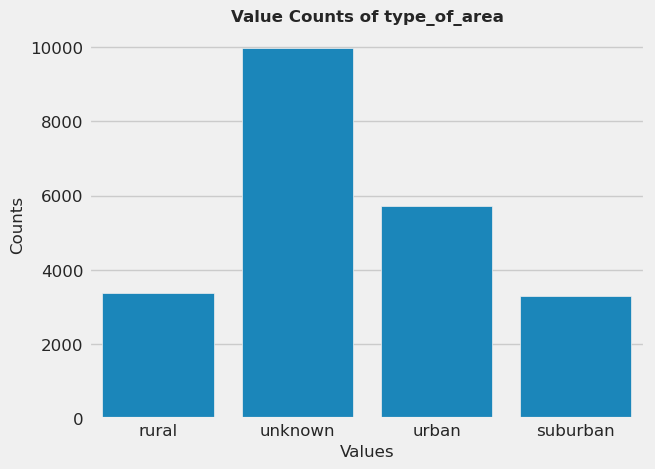

In [75]:
# Create a count plot using Seaborn
sns.countplot(data=dataset, x='type_of_area')
plt.title('Value Counts of type_of_area')
plt.xlabel('Values')
plt.ylabel('Counts')
plt.savefig('value_counts_type_of_area.jpg', dpi=400, bbox_inches='tight')
plt.show()

### functions for training, testing, evaluate clustering algorithm and visualized clusters

In [77]:
def train_clustering_model(df, num_clusters:int=3, use_pca:bool=False, model='kmeans'):
    train_model={'pca':None}
    if use_pca:
        pca_ = PCA(n_components=0.99, random_state=42)
        #print('Applying PCA...')
        print(f"Original shape: {df.shape}")
        pca = pca_.fit(df)
        df_pca = pca.transform(df)
        print(f"Shape after PCA: {df_pca.shape}")
        df=df_pca
        train_model['pca']=pca
    model=model.lower()
    if model=='kmeans':
        clustering_model= KMeans(n_clusters=num_clusters, n_init=300, random_state=42)
    elif model=='dbscan':
        clustering_model = DBSCAN(eps=0.25, min_samples=9)
    elif model=='gaussianmixture':
        clustering_model = GaussianMixture(n_components=num_clusters)
    elif model=='birch':
        clustering_model = Birch(threshold=0.3, n_clusters=num_clusters)
    elif model == 'meanshift':
        clustering_model = MeanShift()
    elif model=='spectralclustering':
        clustering_model = SpectralClustering(n_clusters=num_clusters)
    else:
        raise ValueError('invalid model')
        
    clustering_model.fit(df)
    train_model['model']=clustering_model
    return train_model

def kmeans_predict(df, kmeans):
    kmean=kmeans['kmean']
    pca = kmeans['pca']
    if pca is not None:
        df = pca.transform(df)
    y_pred = kmean.predict(df)
    return y_pred

def visualized(df, labels_pred, labels_truth=None, centroid=None, num_clusters=3):
    print("Visualization...")
    cluster_labels = ['cluster_' + str(i) for i in  range(num_clusters)]
    tsne = TSNE(n_components=2,perplexity=50,n_iter=2000, init='pca', learning_rate=200, random_state=42)
    df_tsne = tsne.fit_transform(df)
    fig = plt.figure(figsize=(15,6))
    ax1 = fig.add_subplot(121)
    scatter = ax1.scatter(df_tsne[:,0], df_tsne[:,1], c=labels_pred, cmap='Set1')
    ax1.legend(handles=scatter.legend_elements()[0], labels=cluster_labels, loc="best", title="Clusters")
    ax1.set_title(f'2D visualization of different Kmeans clusters: {num_clusters} clusters.')
    if labels_truth is not None:
        ax2 = fig.add_subplot(122)
        scatter = ax2.scatter(df_tsne[:,0],df_tsne[:,1], c=labels_truth, cmap='Set1')
        ax2.legend(handles=scatter.legend_elements()[0], labels=cluster_labels, loc="best", title="Clusters")
        ax2.set_title(f'2D visualization of truth clusters')
        plt.subplots_adjust(wspace=0.3)
    plt.show()
    return

def ari_nmi_clustering(y_pred, y_truth):
    ari = adjusted_mutual_info_score(y_pred, y_truth)
    nmi = normalized_mutual_info_score(y_pred, y_truth)
    return ari, nmi

In [78]:
labelled_data = dataset[~(dataset['type_of_area']=='unknown')]
unlabelled_data = dataset[(dataset['type_of_area']=='unknown')]
df_train, df_test = train_test_split(labelled_data, test_size=1000, shuffle=False, random_state=42)
df_test_idx = list(df_test.index)
df_train_idx = list(df_train.index)
un_labeled_idx = list(unlabelled_data.index)
print('number of data point: ', dataset.shape)
print("number of known station: ", labelled_data.shape)
print("number of unknown station: ", unlabelled_data.shape)
print('test shape: ', df_test.shape)

number of data point:  (22378, 22)
number of known station:  (12408, 22)
number of unknown station:  (9970, 22)
test shape:  (1000, 22)


In [13]:
# test_data = get_test_data_from_station_code(test_cord)
# test_data.to_csv('hand_labeled_test_data.csv', index=False)

In [79]:
test_data = pd.read_csv('hand_labeled_test_data.csv')
test_data.set_index(['lat', 'lon'], inplace=True)
test_data = test_data[~(test_data['type_of_are_toar']=='unknown')]
test_indeces = list(test_data.index)
test_indeces = [idx for idx in test_indeces if idx in list(dataset.index)]
test_data = test_data.loc[test_indeces]

**Train clustering algorithm**

**Prepare train and test data**

In [81]:
# we first selecte the most recent infos and analyse the correlation between variable
selected_colunms_0 = [
    'altitude', 
    'mean_topography_srtm_alt_90m_year1994', 
    'mean_topography_srtm_alt_1km_year1994', 
    'max_topography_srtm_relative_alt_5km_year1994', 
    'min_topography_srtm_relative_alt_5km_year1994',
    'stddev_topography_srtm_relative_alt_5km_year1994', 
    'climatic_zone_year2016', 
    'distance_to_major_road_year2020', 
    'mean_stable_nightlights_1km_year2013', 
    'mean_stable_nightlights_5km_year2013', 
    'max_stable_nightlights_25km_year2013', 
    'max_stable_nightlights_25km_year1992', 
    'mean_population_density_250m_year2015', 
    'mean_population_density_5km_year2015', 
    'max_population_density_25km_year2015',
    'mean_population_density_250m_year1990', 
    'mean_population_density_5km_year1990', 
    'max_population_density_25km_year1990', 
    'mean_nox_emissions_10km_year2015', 
    'mean_nox_emissions_10km_year2000',
]
dataset_0 = feature_engineering_selection(dataset, selected_columns=selected_colunms_0, scaling='minmax')
df_train_0 = dataset_0[~(dataset_0.index.isin(df_test_idx))]
df_test_0 = dataset_0[(dataset_0.index.isin(df_test_idx))]
test_data_0 = dataset_0.loc[test_indeces]
#display(dataset_0.head())
#plot_correlation(df_train_0)

In [82]:
df_train_0

,,altitude,mean_topography_srtm_alt_90m_year1994,mean_topography_srtm_alt_1km_year1994,max_topography_srtm_relative_alt_5km_year1994,min_topography_srtm_relative_alt_5km_year1994,stddev_topography_srtm_relative_alt_5km_year1994,climatic_zone_year2016,distance_to_major_road_year2020,mean_stable_nightlights_1km_year2013,mean_stable_nightlights_5km_year2013,max_stable_nightlights_25km_year2013,max_stable_nightlights_25km_year1992,mean_population_density_250m_year2015,mean_population_density_5km_year2015,max_population_density_25km_year2015,mean_population_density_250m_year1990,mean_population_density_5km_year1990,max_population_density_25km_year1990,mean_nox_emissions_10km_year2015,mean_nox_emissions_10km_year2000
lat,lon,,,,,,,,,,,,,,,,,,,,
-34.350000,18.480000,0.081592,0.096158,0.087507,0.052006,0.952157,0.799935,0.500000,9.811367e-04,0.000000,0.000000,0.793651,0.634921,0.000005,0.000012,0.018819,0.001143,0.000000,0.011706,7.704299e-05,9.664181e-05
46.547500,7.985000,0.521482,0.737335,0.721275,0.223997,0.000000,0.323021,0.583333,2.509335e-01,0.000000,0.033059,0.825397,0.666667,0.000000,0.000030,0.013509,0.000000,0.000071,0.013209,3.766361e-05,1.090713e-04
36.280000,100.900000,0.551964,0.787803,0.787757,0.031204,0.678770,0.206204,0.666667,1.455567e-01,0.000000,0.000000,0.857143,0.365079,0.000000,0.000000,0.017428,0.000000,0.000033,0.023024,9.970488e-05,1.027398e-04
-40.683119,144.689939,0.063724,0.084879,0.081624,0.021174,1.000000,0.807323,0.416667,2.117746e-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000007,0.000809,0.000000,0.000040,0.001127,4.366696e-08,1.307782e-07
-14.247000,-170.564000,0.056891,0.086408,0.077099,0.093982,1.000000,0.812821,0.166667,2.070524e-02,0.126984,0.064147,0.746032,0.507937,0.000000,0.004726,0.009303,0.000000,0.002356,0.018277,1.765233e-05,2.685567e-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
-34.353480,18.489680,0.081592,0.091761,0.085071,0.060550,0.961982,0.804237,0.500000,2.604173e-02,0.000000,0.000000,0.777778,0.634921,0.000005,0.000012,0.015572,0.000002,0.000039,0.009673,7.704299e-05,9.664181e-05
47.766666,16.766666,0.066745,0.096349,0.093074,0.003715,0.996583,0.792897,0.500000,7.982492e-03,0.126984,0.085760,0.904762,0.650794,0.000310,0.000568,0.020957,0.000014,0.000734,0.021335,8.205936e-05,1.836968e-04
59.317200,18.048900,0.054526,0.082967,0.075948,0.013373,1.000000,0.806740,0.666667,2.887682e-07,1.000000,1.000000,1.000000,1.000000,0.331339,0.121900,0.083285,0.232198,0.084799,0.070756,1.412528e-02,3.856583e-02


In [16]:
clustering_model_kmeans = train_clustering_model(df_train_0, model='kmeans')['model']

## Testing 1:

In [17]:
y_pred_0 = clustering_model_kmeans.predict(test_data_0)
display(y_pred_0)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 1, 1, 1, 1,
       1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32)

In [18]:
test_data['category_toar']=test_data['type_of_area_given'].map({'urban':0, 'suburban':2, 'rural':1})
test_data['category_pred']=y_pred_0
test_data['type_of_area_pred'] = test_data['category_pred'].map({0:'urban', 2:'suburban', 1:'rural'})
test_data = test_data[['area_code',	'type_of_are_toar', 'type_of_area_given', 'type_of_area_pred', 'category_toar', 'category_pred']]
accuracy_0 = accuracy_score(test_data['category_pred'].values, test_data['category_toar'].values)
accuracy_1 = accuracy_score(test_data['type_of_are_toar'].values, test_data['type_of_area_given'].values)
ari_0, nmi_0 = ari_nmi_clustering(test_data['category_pred'].values, test_data['category_toar'].values)
ari_1, nmi_1 = ari_nmi_clustering(test_data['type_of_are_toar'].values, test_data['type_of_area_given'].values)
test_data = test_data[['area_code', 'type_of_are_toar', 'type_of_area_given', 'type_of_area_pred', 'category_pred']]
print("Accuracy: {:.2f}%".format(accuracy_0*100))
print("ARI Score: {:.2f}".format(ari_0))
print("NMI Score: {:.2f}".format(nmi_0))
print()
print("Accuracy w.r.t given labels: {:.2f}%".format(accuracy_1*100))
print("ARI Score w.r.t given labels: {:.2f}".format(ari_1))
print("NMI Score w.r.t given labels: {:.2f}".format(nmi_1))
#test_data['type_of_area_pred'].value_counts()

Accuracy: 90.91%
ARI Score: 0.71
NMI Score: 0.73

Accuracy w.r.t given labels: 87.88%
ARI Score w.r.t given labels: 0.66
NMI Score w.r.t given labels: 0.69


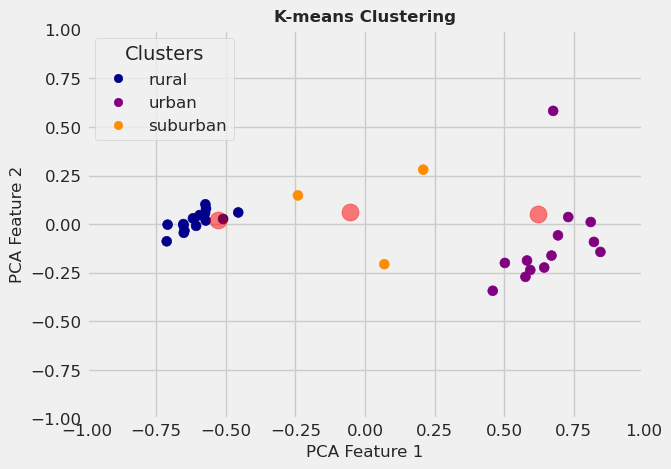

In [19]:
pca = PCA(n_components=2)
test_data_0_pca = pca.fit_transform(test_data_0)
# Plot the clusters
scatter = plt.scatter(test_data_0_pca[:, 0], test_data_0_pca[:, 1], c=y_pred_0, s=50, cmap=ListedColormap(['darkblue', 'purple', 'darkorange']))
# Plot centroids
centers = clustering_model_kmeans.cluster_centers_
centers_pca = pca.transform(centers)
plt.scatter(centers_pca[:, 0], centers_pca[:, 1], c='red', s=150, alpha=0.5)
plt.xlabel('PCA Feature 1')
plt.ylabel('PCA Feature 2')
plt.title('K-means Clustering')
plt.legend(handles=scatter.legend_elements()[0], labels=['rural', 'urban', 'suburban'], loc="best", title="Clusters")
plt.ylim((-1, 1))
plt.xlim((-1, 1))
plt.savefig('kmeans_clusters_0.jpg', dpi=400, pad_inches=0.2, bbox_inches='tight')
plt.show()

Accuracy: 65.80%


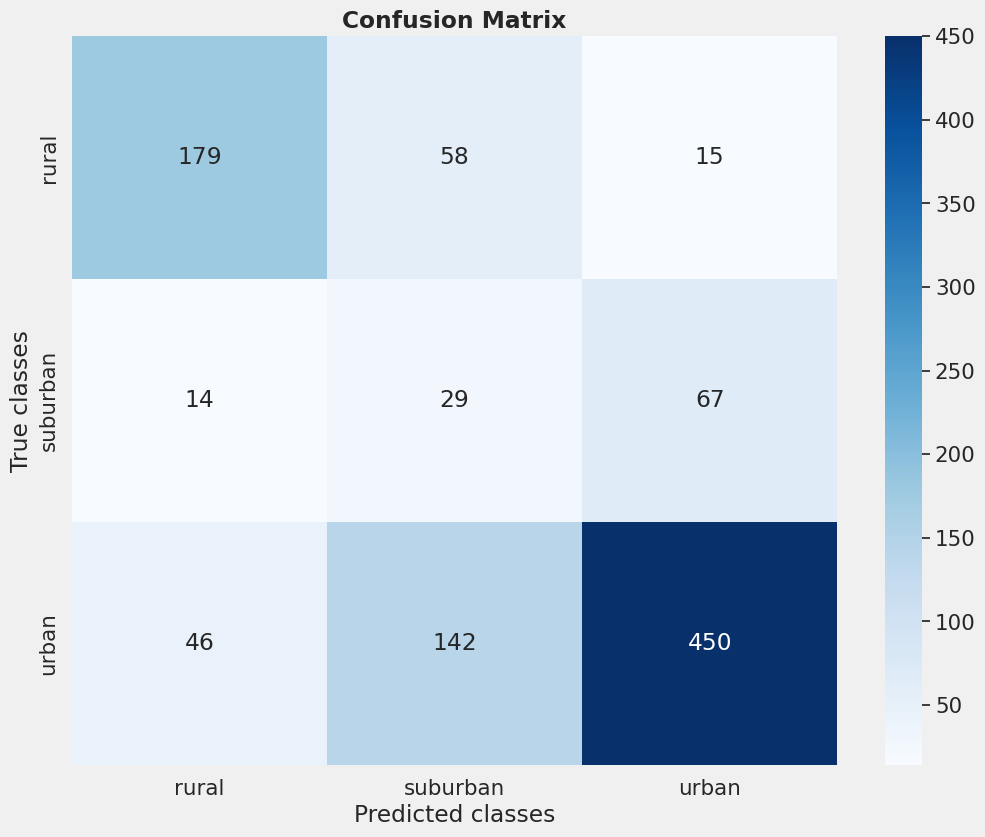

Accuracy: 65.80%
ARI Score : 0.25
NMI Score: 0.25


In [20]:
df_test_result = df_test[['area_code', 'type_of_area']]
df_test_result['category_toar']=df_test_result['type_of_area'].map({'urban':0, 'suburban':2, 'rural':1})
y_pred_0 = clustering_model_kmeans.predict(df_test_0)
df_test_result['category_pred'] = y_pred_0
df_test_result['type_of_area_pred'] = df_test_result['category_pred'].map({0:'urban', 2:'suburban', 1:'rural'})
accuracy_0 = accuracy_score(df_test_result['type_of_area'].values, df_test_result['type_of_area_pred'].values)
ari, nmi = ari_nmi_clustering(df_test_result['type_of_area'].values, df_test_result['type_of_area_pred'].values)
df_test_result = df_test_result[['area_code', 'type_of_area', 'type_of_area_pred']]
cf_matrix_roc_auc(df_test_result['type_of_area'].values, df_test_result['type_of_area_pred'].values,  fig_name='confision_matrix_kmeans_v2')
print("Accuracy: {:.2f}%".format(accuracy_0*100))
print("ARI Score : {:.2f}".format(ari))
print("NMI Score: {:.2f}".format(nmi))
#display(df_test_result)

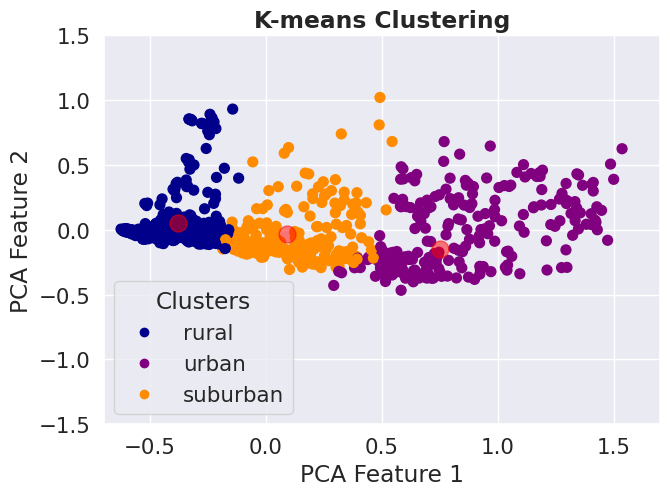

In [21]:
pca = PCA(n_components=2)
df_test_0_pca = pca.fit_transform(df_test_0)
# Plot the clusters
y_pred_0=clustering_model_kmeans.predict(df_test_0)
scatter = plt.scatter(df_test_0_pca[:, 0], df_test_0_pca[:, 1], c=y_pred_0, s=50, cmap=ListedColormap(['darkblue', 'purple', 'darkorange']))
# Plot centroids
centers = clustering_model_kmeans.cluster_centers_
centers_pca = pca.transform(centers)
plt.scatter(centers_pca[:, 0], centers_pca[:, 1], c='red', s=150, alpha=0.5)
plt.xlabel('PCA Feature 1')
plt.ylabel('PCA Feature 2')
plt.title('K-means Clustering')
plt.legend(handles=scatter.legend_elements()[0], labels=['rural', 'urban', 'suburban'], loc="best", title="Clusters")
plt.ylim((-1.5, 1.5))
plt.xlim((-.7, 1.7))
plt.savefig('kmeans_clusters_1.jpg', dpi=400, pad_inches=0.2, bbox_inches='tight')
plt.show()

In [22]:
urban_pred = df_test_result[df_test_result['type_of_area']=='urban']
suburban_pred = df_test_result[df_test_result['type_of_area']=='suburban']
rural_pred = df_test_result[df_test_result['type_of_area']=='rural']
print()
print("accuraccy for separate test, random forest")
print('accuracy of predicting urban', round(100*accuracy_score(urban_pred['type_of_area'].values, urban_pred['type_of_area_pred'].values),2))
print('accuracy of predicting rural', round(100*accuracy_score(rural_pred['type_of_area'].values, rural_pred['type_of_area_pred'].values), 2))
print('accuracy of predicting suburan', round(100*accuracy_score(suburban_pred['type_of_area'].values, suburban_pred['type_of_area_pred'].values), 2))


accuraccy for separate test, random forest
accuracy of predicting urban 70.53
accuracy of predicting rural 71.03
accuracy of predicting suburan 26.36


In [192]:
# idx_map = {df_index[i]:i for i in range(len(df_index))}
# int_idx = list(map(lambda key: idx_map[key], df_index))
# def lat_lon_idx_map(value:int):
#     "return (lon, lat), from integer index"
#     return list(idx_map.keys())[list(idx_map.values()).index(value)]

# def lat_lon_idx(int_idx):
#     if not isinstance(int_idx, list):
#         int_idx = [int_idx]
#     return [lat_lon_idx_map(idx) for idx in int_idx]

# def prepare_test_data(df_test, cols, scaler=None):
#     df = df_test[cols]
#     if scaler is not None:
#         df_scaled= scaler_global.transform(df)
#         df_scaled = pd.DataFrame(df_scaled, columns=cols, index=df_test.index)
#         df=df_scaled
#     return df

In [23]:
# we selecte less cooreleted variables and analyse the correlation between variable
selected_colunms_1 = [
    'altitude',  
    'mean_population_density_5km_year2015', 
    'mean_stable_nightlights_5km_year2013', 
    'distance_to_major_road_year2020', 
    'max_topography_srtm_relative_alt_5km_year1994', 
    'min_topography_srtm_relative_alt_5km_year1994',  
    'mean_nox_emissions_10km_year2015'
]
selected_colunms_2 = [
    'altitude', 
    'mean_population_density_5km_year2015', 
    'mean_stable_nightlights_5km_year2013', 
    'distance_to_major_road_year2020',  
    'max_topography_srtm_relative_alt_5km_year1994'
]

selected_colunms_3 = [
    'altitude',  
    'mean_nox_emissions_10km_year2015',  
    'mean_population_density_5km_year2015', 
    'mean_stable_nightlights_5km_year2013', 
    'distance_to_major_road_year2020', 
    'max_topography_srtm_relative_alt_5km_year1994'
]

dataset_1 = feature_engineering_selection(dataset, selected_columns=selected_colunms_1, scaling='minmax')
df_train_1 = dataset_1[~(dataset_1.index.isin(df_test_idx))]
df_test_1 = dataset_1[(dataset_1.index.isin(df_test_idx))]
test_data_1 = dataset_1.loc[test_indeces]
display(df_train_1.head(2))
#plot_correlation(df_train_1)
dataset_2 = feature_engineering_selection(dataset, selected_columns=selected_colunms_2, scaling='minmax')
df_train_2 = dataset_2[~(dataset_2.index.isin(df_test_idx))]
df_test_2 = dataset_2[(dataset_2.index.isin(df_test_idx))]
test_data_2 = dataset_2.loc[test_indeces]
display(df_train_2.head(2))
#plot_correlation(df_train_2)
dataset_3 = feature_engineering_selection(dataset, selected_columns=selected_colunms_3, scaling='minmax')
df_train_3 = dataset_3[~(dataset_3.index.isin(df_test_idx))]
df_test_3 = dataset_3[(dataset_3.index.isin(df_test_idx))]
test_data_3 = dataset_3.loc[test_indeces]
display(df_train_3.head(2))
#plot_correlation(df_train_3)

,,altitude,mean_population_density_5km_year2015,mean_stable_nightlights_5km_year2013,distance_to_major_road_year2020,max_topography_srtm_relative_alt_5km_year1994,min_topography_srtm_relative_alt_5km_year1994,mean_nox_emissions_10km_year2015
lat,lon,,,,,,,
-34.3500,18.480,0.081391,0.000012,0.000000,0.000981,0.052006,0.952014,0.435973
46.5475,7.985,0.521377,0.000030,0.033059,0.250933,0.226597,0.000000,0.514282


,,altitude,mean_population_density_5km_year2015,mean_stable_nightlights_5km_year2013,distance_to_major_road_year2020,max_topography_srtm_relative_alt_5km_year1994
lat,lon,,,,,
-34.3500,18.480,0.081391,0.000012,0.000000,0.000981,0.052006
46.5475,7.985,0.521377,0.000030,0.033059,0.250933,0.226597


,,altitude,mean_nox_emissions_10km_year2015,mean_population_density_5km_year2015,mean_stable_nightlights_5km_year2013,distance_to_major_road_year2020,max_topography_srtm_relative_alt_5km_year1994
lat,lon,,,,,,
-34.3500,18.480,0.081391,0.435973,0.000012,0.000000,0.000981,0.052006
46.5475,7.985,0.521377,0.514282,0.000030,0.033059,0.250933,0.226597


In [8]:
def TSNE_Kmean(df, perplexity=50, num_clusters=3, test_indeces=None):
    tsne = TSNE(n_components=2,perplexity=50,n_iter=2000, init='pca', learning_rate=200, random_state=42)
    pca = PCA(n_components=0.99, random_state=42)
    tsne_pca = TSNE(n_components=2, perplexity=perplexity,n_iter=2000, init='pca', learning_rate=200, random_state=42)
    df_origine = df
    #print('Applying PCA...')
    print(f"Original shape: {df.shape}")
    df_pca = pca.fit_transform(df)
    print(f"Shape after PCA: {df_pca.shape}")
    df_tsne = tsne.fit_transform(df)
    df_pca_tsne = tsne_pca.fit_transform(df_pca)
    print(f"KL divergence before PCA:  {tsne.kl_divergence_}")
    print(f"KL diversgence after PCA:  {tsne_pca.kl_divergence_}")
    #print("Applying K-means clustering....")
    #print("Kmean with TSNE...")
    kmean_tsne = KMeans(n_clusters=num_clusters, n_init=500, random_state=42)
    kmean_tsne.fit(df_tsne)
    labels_tsne = kmean_tsne.labels_
    #print("Kmean with PCA and TSNE...")
    kmean_pca_tsne = KMeans(n_clusters=num_clusters, n_init=500, random_state=42)
    kmean_pca_tsne.fit(df_pca_tsne)
    labels_pca_tsne = kmean_pca_tsne.labels_
    
    kmean = KMeans(n_clusters=num_clusters, n_init=500, random_state=42)
    kmean.fit(df_origine)
    labels = kmean.labels_
    
    #print("Done!!!")
    print("Visualization...")
    fig = plt.figure(figsize=(15,6))
    ax1 = fig.add_subplot(121)
    scatter = ax1.scatter(df_tsne[:,0], df_tsne[:,1], c=labels_tsne, cmap='Set1')
    ax1.legend(handles=scatter.legend_elements()[0], labels=['cluster_0', 'cluster_1', 'cluster_3'], loc="best", title="Clusters")
    ax1.set_title(f'2D visualization of different Kmeans clusters:\n Kmeans with {num_clusters} clusters is apply after TSNE')
    ax2 = fig.add_subplot(122)
    scatter = ax2.scatter(df_pca_tsne[:,0],df_pca_tsne[:,1], c=labels_pca_tsne, cmap='Set1')
    ax2.legend(handles=scatter.legend_elements()[0], labels=set(labels_pca_tsne), loc="best", title="Clusters")
    ax2.set_title(f'2D visualization of different Kmeans clusters:\n We first apply PCA then TSNE and Kmeans with {num_clusters} clusters')
    plt.subplots_adjust(wspace=0.3)
    plt.show()
    
    print('Testing...')
    df_index = list(df.index)
    test_indeces = [idx for idx in indeces if idx in df_index]
    df_test = df_origine.loc[test_indeces]
    y_truth = test_data.loc[test_indeces]['category'].values
    
    idx_map = {df_index[i]:i for i in range(len(df_index))}
    int_idx = list(map(lambda key: idx_map[key], test_indeces))
    
    df_test_tsne = df_tsne[int_idx]
    df_test_pca_tsne = df_pca_tsne[int_idx]
    
    label_test_tsne = kmean_tsne.predict(df_test_tsne)
    label_test_tsne_pca = kmean_pca_tsne.predict(df_test_pca_tsne)
    label_test = kmean.predict(df_test)
    #evaluation
    #ARI
    ari = adjusted_mutual_info_score(y_truth, label_test)
    ari_tsne = adjusted_rand_score(y_truth, label_test_tsne)
    ari_tsne_pac = adjusted_rand_score(y_truth, label_test_tsne_pca)
    #NMI
    nmi = normalized_mutual_info_score(y_truth, label_test)
    nmi_tsne = normalized_mutual_info_score(y_truth, label_test_tsne)
    nmi_tsne_pca = normalized_mutual_info_score(y_truth, label_test_tsne_pca)
    
    print(f"ARI:  {ari}")
    print(f"ARI TSNE without PCA:  {ari_tsne}")
    print(f"ARI TSNE with PCA:  {ari_tsne_pac}")
    
    print()
    print(f"NMI:  {nmi}")
    print(f"NMI TSNE without PCA:  {nmi_tsne}")
    print(f"NMI TSNE with PCA:  {nmi_tsne_pca}")
   
    print()
    print(f'True clusters: {y_truth}')
    print(f'predict clusters: {label_test}')
    print(f'predict clusters tsne: {label_test_tsne}')
    print(f'predict clusters pca_tsne: {label_test_tsne_pca}')
    
    fig = plt.figure(figsize=(15,6))
    ax1 = fig.add_subplot(121)
    scatter = ax1.scatter(df_test_tsne[:,0], df_test_tsne[:,1], c=label_test_tsne, cmap='Set1', s=70, alpha=0.95)
    ax1.legend(handles=scatter.legend_elements()[0], labels=set(label_test_tsne), loc="best", title="Clusters")
    ax1.set_title(f'Kmeans clusters predict, without PCA')
    ax2 = fig.add_subplot(122)
    scatter = ax2.scatter(df_test_tsne[:,0],df_test_tsne[:,1], c=y_truth, cmap='Set1', s=70, alpha=0.95)
    ax2.legend(handles=scatter.legend_elements()[0], labels=categories, loc="best", title="Clusters")
    ax2.set_title(f'Truth clusters')
    plt.subplots_adjust(wspace=0.3)
    plt.show()
    print()
    fig = plt.figure(figsize=(15,6))
    ax1 = fig.add_subplot(121)
    scatter = ax1.scatter(df_test_pca_tsne[:,0], df_test_pca_tsne[:,1], c=label_test_tsne_pca, cmap='Set1', s=70, alpha=0.95)
    ax1.legend(handles=scatter.legend_elements()[0], labels=set(label_test_tsne_pca), loc="best", title="Clusters")
    ax1.set_title(f'Kmeans clusters predict, with PCA')
    ax2 = fig.add_subplot(122)
    scatter = ax2.scatter(df_test_pca_tsne[:,0],df_test_pca_tsne[:,1], c=y_truth, cmap='Set1', s=70, alpha=0.95)
    ax2.legend(handles=scatter.legend_elements()[0], labels=categories, loc="best", title="Clusters")
    ax2.set_title(f'True clusters')
    plt.subplots_adjust(wspace=0.3)
    plt.show()
    
    fig = plt.figure(figsize=(15,6))
    ax1 = fig.add_subplot(121)
    scatter = ax1.scatter(df_test_tsne[:,0], df_test_tsne[:,1], c=label_test, cmap='Set1', s=70, alpha=0.95)
    ax1.legend(handles=scatter.legend_elements()[0], labels=set(label_test), loc="best", title="Clusters")
    ax1.set_title(f'Kmeans clusters predict, with PCA')
    ax2 = fig.add_subplot(122)
    scatter = ax2.scatter(df_test_tsne[:,0],df_test_tsne[:,1], c=y_truth, cmap='Set1', s=70, alpha=0.95)
    ax2.legend(handles=scatter.legend_elements()[0], labels=categories, loc="best", title="Clusters")
    ax2.set_title(f'True clusters')
    plt.subplots_adjust(wspace=0.3)
    plt.show()
    return test_indeces, df_tsne, df_pca_tsne, df_test_tsne, df_test_pca_tsne, kmean_tsne, kmean_pca_tsne

#### Evaluation
**Adjusted Rand Index(ARI)**: Measures the similarity between the true clusters of the samples and the predicted one. It range from -1.0 to 1.0
where a score close to 1 indicates strong agreement between the true labels and the clustering algorithm's labels, a score around 0 indicates random labeling, and a negative score indicates disagreement

**Normalized Mutual Information (NMI)**: Measures the mutual information between the true clusters of the samples and the clusters assigned by Kmeans, normalized by the average entropy of the two label sets. It range from 0 to 1, where a score close to 1 indicates strong agreement between the true clusters and the Kmeans clusters. A score of 0 indicates no mutual information between the two cluters set

## ============== Supervized learning approach ============================= #

In [9]:
df_no2 = pd.read_csv('no2/p75.csv', comment="#")
df_no2.set_index(['lat', 'lon'], inplace=True)
df_no2 = df_no2.loc[~df_no2.index.duplicated(keep=False)]
df_no2 = df_no2.rename(columns={'value': 'no2'})

df_nox = pd.read_csv('nox/p75.csv', comment="#")
df_nox.set_index(['lat', 'lon'], inplace=True)
df_nox = df_nox.loc[~df_nox.index.duplicated(keep=False)]
df_nox = df_nox.rename(columns={'value': 'nox'})
df_nox = df_nox.dropna()

df_pm = pd.read_csv('pm2p5/p75.csv', comment="#")
df_pm.set_index(['lat', 'lon'], inplace=True)
df_pm = df_pm.loc[~df_pm.index.duplicated(keep=False)]
df_pm = df_pm.rename(columns={'value': 'pm2p5'})

In [10]:
def evolution_rate(data):
    df = data.copy()
    df['mean_nox_emissions_rate_10km_year2000_2015'] = (df['mean_nox_emissions_10km_year2015']-df['mean_nox_emissions_10km_year2000'])/(2015-2000)
    df['mean_population_density_rate_250m_year1990_2015'] = (df['mean_population_density_250m_year2015']-df['mean_population_density_250m_year1990'])/(2015-1990)
    df['mean_population_density_rate_5km_year1990_2015'] = (df['mean_population_density_5km_year2015']-df['mean_population_density_5km_year1990'])/(2015-1990)
    df['max_population_density_rate_25km_year1990_2015'] = (df['max_population_density_25km_year2015']-df['max_population_density_25km_year1990'])/(2015-1990)
    df['max_stable_nightlights_rate_25km_year2013_1992'] = (df['max_stable_nightlights_25km_year2013']-df['max_stable_nightlights_25km_year1992'])/(2013-1992)
    df = df.drop(columns=[
        'mean_nox_emissions_10km_year2015', 'mean_nox_emissions_10km_year2000', 'mean_population_density_250m_year2015', 'mean_population_density_250m_year1990', 
        'mean_population_density_5km_year2015', 'mean_population_density_5km_year1990', 'max_population_density_25km_year2015', 'max_population_density_25km_year1990', 
        'max_stable_nightlights_25km_year2013','max_stable_nightlights_25km_year1992'
    ])
    return df

colunms_0 = [
    'mean_topography_srtm_alt_90m_year1994', 
    'mean_topography_srtm_alt_1km_year1994', 
    'max_topography_srtm_relative_alt_5km_year1994', 
    'min_topography_srtm_relative_alt_5km_year1994',
    'stddev_topography_srtm_relative_alt_5km_year1994', 
    'distance_to_major_road_year2020', 
    'climatic_zone_year2016', 
    'mean_stable_nightlights_1km_year2013', 
    'mean_stable_nightlights_5km_year2013',
    'max_stable_nightlights_rate_25km_year2013_1992', 
    'mean_population_density_rate_250m_year1990_2015', 
    'mean_population_density_rate_5km_year1990_2015', 
    'max_population_density_rate_25km_year1990_2015', 
    'mean_nox_emissions_rate_10km_year2000_2015', 
    'type_of_area'
]
# dataset_rate = evolution_rate(data)
# dataset_rate = dataset_rate[colunms_0]

In [11]:
def voting_clf(clfs:dict, X_test):
    y_pred_voting = []
    y_pred_rf = clfs['rf_clf'].predict(X_test)
    y_pred_cboost = clfs['cboost'].predict(X_test)
    y_pred_lgbm = clfs['lgbm'].predict(X_test)
    for pred in zip(y_pred_rf, y_pred_cboost, y_pred_lgbm):
        my_pred = (pred[0], pred[1][0], pred[2])
        counter = Counter(my_pred)
        y_pred_voting.append(counter.most_common(1)[0][0])
    return np.asarray(y_pred_voting, dtype=object)


def threshold_prob_clf(y_proba:np.ndarray):
    y_argmax = np.argmax(y_proba,axis=1)
    y_max = np.max(y_prob,axis=1)
    y_max = y_max >= 0.5
    y_argmax[~y_max] = 1
    classes_ = np.array(['rural', 'suburban', 'urban'], dtype=object)
    y_pred =  classes_[y_argmax]
    return y_pred

def threshold_clf(y_proba:np.ndarray):
    y_pred = []
    for proba in list(y_proba):
        p_max = max(proba)
        if p_max == proba[1]:
            y_pred.append('suburban')
        elif p_max == proba[0] and p_max >= 0.5:
            y_pred.append('rural')
        elif p_max == proba[2] and p_max >= 0.5:
            y_pred.append('urban')
        else:
            y_pred.append('suburban')
    return np.asarray(y_pred, dtype=object)

def prepare_data_for_stat_eval(df_clean, df_spice, know_station_only:bool=False, n_sample:int=1000):
    df = pd.merge(df_clean, df_spice, left_index=True, right_index=True)
    print(df['type_of_area'].value_counts())
    print('total data points: ', df.shape)
    if know_station_only:
        df = df[~((df['type_of_area']=='unknown'))]
        if n_sample is not None:
            n_indiv_sample = int(n_sample/3)
            n_rural = min(len(df[df['type_of_area']=='rural']), n_indiv_sample) 
            n_suburban = min(len(df[df['type_of_area']=='suburban']), n_indiv_sample)       
            n_urban = n_sample - n_rural - n_suburban
            print(n_urban, n_suburban, n_rural)
            df = pd.concat([
                df[df['type_of_area'] == 'urban'].sample(n=n_urban, random_state=42),
                df[df['type_of_area'] == 'suburban'].sample(n=n_suburban, random_state=42),
                df[df['type_of_area'] == 'rural'].sample(n = n_rural, random_state=42)
            ])
    return df

def stat_evaluation(df_spice, clf, spice:str):
    y_pred = clf.predict(df_spice[list(df_spice.columns)[:-2]])
    df_spice['type_of_area_pred']=y_pred
    print('accuracy: ', accuracy_score(df_spice['type_of_area'].values, df_spice['type_of_area_pred'].values))
    df_urban = df_spice[df_spice['type_of_area_pred']=='urban']
    df_suburban = df_spice[df_spice['type_of_area_pred']=='suburban']
    df_rural = df_spice[df_spice['type_of_area_pred']=='rural']
    data_clf = [df_urban[spice].values, df_suburban[spice].values, df_rural[spice].values]
    # Creating the box plot
    plt.figure(figsize=(9, 8))
    plt.boxplot(data_clf, patch_artist=True, notch=False, vert=True, showmeans=False, widths=0.15, positions=[0.25, 0.75, 1.25])
    # Adding titles and labels
    plt.title(f'Statistic evaluion {spice}')
    plt.xlabel('Station location')
    plt.ylabel(f'p75 of {spice}')
    plt.xticks([0.25, 0.75, 1.25], ['urban', 'suburban', 'rural'])
    plt.savefig('box_' + spice + '.jpg',  dpi=400, bbox_inches='tight')
    # Display the plot
    plt.show()
    return

def print_prediction_accuracies(df_test_result, model_pred):
    urban_pred = df_test_result[df_test_result['type_of_area']=='urban']
    suburban_pred = df_test_result[df_test_result['type_of_area']=='suburban']
    rural_pred = df_test_result[df_test_result['type_of_area']=='rural']
    for model_name, pred in model_pred.items():
        acc = accuracy_score(df_test_result['type_of_area'].values, df_test_result[pred].values)
        acc_urban = accuracy_score(urban_pred['type_of_area'].values, urban_pred[pred].values)
        acc_suburban = accuracy_score(suburban_pred['type_of_area'].values, suburban_pred[pred].values)
        acc_rural = accuracy_score(rural_pred['type_of_area'].values, rural_pred[pred].values)
        print(f'{model_name}')
        print('global accuracy: ', acc*100)
        print('accuracy for predicting urban: ', round(acc_urban*100, 2))
        print('accuracy for predicting suburban: ', round(acc_suburban*100, 2))
        print('accuracy for predicting rural: ', round(acc_rural*100, 2))
        print()
    return

def get_feature_importance(trained_clf, model_name:str):
    if model_name=='cboost':
        importance = trained_clf.get_feature_importance()
    elif model_name in ['rf', 'lgbm']:
        importance = trained_clf.feature_importances_
    else:
        raise ValueError('unknown classifier')
    return importance

In [12]:
def train_with_important_feature(clf:dict, X_train, Y_train, X_test=None, Y_test=None, init_num_feature=10):
    # first train
    model = clf['model']
    model_name = clf['model_name']
    model.fit(X_train, Y_train)
    importance = get_feature_importance(model, model_name)
    feature_rank = pd.DataFrame({'feature': list(X_train.columns), 'importance': importance})
    feature_rank = feature_rank.sort_values('importance', ascending=False)
    features = feature_rank['feature'].to_list()
    num_feature=len(features)
    Y_pred = model.predict(X_test)
    accuracy = accuracy_score(Y_test, Y_pred)
    imp_feature = {'trained_model': model, 'features': features, 'accuracy': accuracy}
    print(accuracy)
    for k in range(num_feature-init_num_feature):
        select_features = features[:init_num_feature+k]
        X_train_selected = X_train[select_features]
        X_test_selected = X_test[select_features]
        model.fit(X_train_selected, Y_train)
        Y_pred = model.predict(X_test_selected)
        acc = accuracy_score(Y_test, Y_pred)
        if acc > imp_feature['accuracy']:
            imp_feature['features']= select_features
            imp_feature['accuracy']=acc
            imp_feature['model'] = model
    print(imp_feature['accuracy'])
    return imp_feature

def objective_cboost(trial):
    params = {
        "iterations": 1000,
        "learning_rate": trial.suggest_loguniform("learning_rate", 1e-3, 0.1),
        "depth": trial.suggest_int("depth", 1, 10),
        "l2_leaf_reg": trial.suggest_int("l2_leaf_reg", 2, 10),
        "random_strength": trial.suggest_uniform("random_strength", 0, 10),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 1, 100),
        "loss_function": "MultiClass",
        "bootstrap_type": trial.suggest_categorical("bootstrap_type", ["Bernoulli", "MVS"]),
    }
    if params["bootstrap_type"] == "Bernoulli":
        params["subsample"] = trial.suggest_uniform("subsample", 0.1, 1.0)
        
    model = CatBoostClassifier(**params, silent=True)
    model.fit(X_train_0, Y_train_0)
    # Predict probabilities
    preds = model.predict_proba(X_test_0)
    # Calculate log loss
    loss = log_loss(Y_test_0, preds)
    return loss

#### Prepare data

In [31]:
dataset = data_preprocessing(path_to_data='stationglobalmetadata_update.csv')
dataset_origin = dataset.copy()
data = dataset_origin.sample(frac=1)

initial data size:  (23974, 22)
New shape:  (22378, 22)
Total points drop:  1596


In [84]:
y_boxcox_nox_2015, lmb_func_nox_2015  = stats.boxcox(data['mean_nox_emissions_10km_year2015'].values)
y_boxcox_nox_2000, lmb_func_nox_2000  = stats.boxcox(data['mean_nox_emissions_10km_year2000'].values)
#stats.boxcox(Y_train)
data['mean_nox_emissions_10km_year2015'] = y_boxcox_nox_2015
data['mean_nox_emissions_10km_year2000'] = y_boxcox_nox_2000

In [85]:
# df_train = labelled_data[~(labelled_data.index.isin(df_pm_test_idx))]
# df_test = labelled_data[(labelled_data.index.isin(df_pm_test_idx))]

In [32]:
labelled_data = data[~(data['type_of_area']=='unknown')]
unlabelled_data = data[(data['type_of_area']=='unknown')]
print('number of data point: ', data.shape)
print("number of known station: ", labelled_data.shape)
print('number of unlabelled station: ', unlabelled_data.shape)
df_train, df_test = train_test_split(labelled_data, test_size=1000, shuffle=False, random_state=42)
print('training shape: ', df_train.shape)
print('test shape: ', df_test.shape)
df_test_idx = list(df_test.index)
df_train_idx = list(df_train.index)
labeled_idx = list(labelled_data.index)
unlabeled_idx = list(unlabelled_data.index)

number of data point:  (22378, 22)
number of known station:  (12408, 22)
number of unlabelled station:  (9970, 22)
training shape:  (11408, 22)
test shape:  (1000, 22)


In [33]:
test_data = pd.read_csv('hand_labeled_test_data.csv')
test_data.set_index(['lat', 'lon'], inplace=True)
test_indeces = list(test_data.index)
test_indeces = [idx for idx in test_indeces if idx in list(labelled_data.index)]
test_data = test_data.loc[test_indeces]

In [34]:
# we first selecte the most recent infos and analyse the correlation between variable
selected_colunms_0 = [
    'altitude',
    'mean_topography_srtm_alt_90m_year1994', 
    'mean_topography_srtm_alt_1km_year1994', 
    'max_topography_srtm_relative_alt_5km_year1994', 
    'min_topography_srtm_relative_alt_5km_year1994',
    'stddev_topography_srtm_relative_alt_5km_year1994', 
    'distance_to_major_road_year2020', 
    'climatic_zone_year2016', 
    'mean_stable_nightlights_5km_year2013',
    'max_stable_nightlights_25km_year1992', 
    'mean_population_density_250m_year2015', 
    'mean_population_density_5km_year2015', 
    'max_population_density_25km_year2015', 
    'mean_population_density_250m_year1990', 
    'mean_population_density_5km_year1990', 
    'max_population_density_25km_year1990', 
    'mean_nox_emissions_10km_year2015', 
    'mean_nox_emissions_10km_year2000', 
    'type_of_area'
]
dataset_0 = feature_engineering_selection(data, selected_columns=selected_colunms_0, scaling='robust', encode_cat=True)
#plot_correlation(dataset_0[list(dataset_0.columns)[:-1]])
print(len(df_train_idx))
print(len(df_test_idx))
print(len(unlabeled_idx))
df_train_0 = dataset_0.loc[df_train_idx]#[(dataset_0.index.isin(df_train_idx))]
df_test_0 = dataset_0.loc[df_test_idx]#[(dataset_0.index.isin(df_test_idx))]
print('training shape', df_train_0.shape)
print('test shape: ', df_test_0.shape)
df_unlabeled_0 = dataset_0.loc[unlabeled_idx]#[(dataset_0.index.isin(unlabeled_idx))]
test_data_0 = dataset_0.loc[test_indeces]
#display(df_train_0.head(2))
X_train_0 = df_train_0.drop(columns=['type_of_area'])
Y_train_0 = df_train_0[['type_of_area']]
X_test_0 = df_test_0.drop(columns=['type_of_area'])
Y_test_0 = df_test_0[['type_of_area']]

11408
1000
9970
training shape (11408, 31)
test shape:  (1000, 31)


In [35]:
cl_weights = {'urban': 0.275, 'suburban':0.45, 'rural':0.275}

param_grid = {
    'n_estimators': [100, 200, 250, 300, 400, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}

In [36]:
rf_clf = RandomForestClassifier(n_estimators=500, criterion = 'entropy', random_state = 42, class_weight=cl_weights)

cboost_clf = CatBoostClassifier(n_estimators=500, learning_rate= 0.03986794927756705, depth= 9, l2_leaf_reg= 6, random_strength= 3.4439060846939396, min_data_in_leaf= 49, bootstrap_type = 'MVS', verbose=False)

lgbm_clf =  LGBMClassifier(n_estimators=500, verbose=0)

In [37]:
techniques = [
    (SMOTE(random_state=42), "SMOTE"),
    (SMOTETomek(random_state=42), "SMOTE+Tomek"),
    (SMOTEENN(random_state=42), "SMOTE+ENN")
]

In [38]:
resampler_smot = SMOTETomek(random_state=42)              # "SMOTE"
resampler_smotetomek = SMOTETomek(random_state=42)        # "SMOTE+Tomek"
resampler_smoteenn = SMOTEENN(random_state=42)            # "SMOTE+ENN"

In [39]:
X_train_0_smot, Y_train_0_smot = resampler_smot.fit_resample(X_train_0, Y_train_0)
X_train_0_smotetomek, Y_train_0_smotetomek = resampler_smotetomek.fit_resample(X_train_0, Y_train_0)
X_train_0_smoteenn, Y_train_0_smoteenn = resampler_smoteenn.fit_resample(X_train_0, Y_train_0)

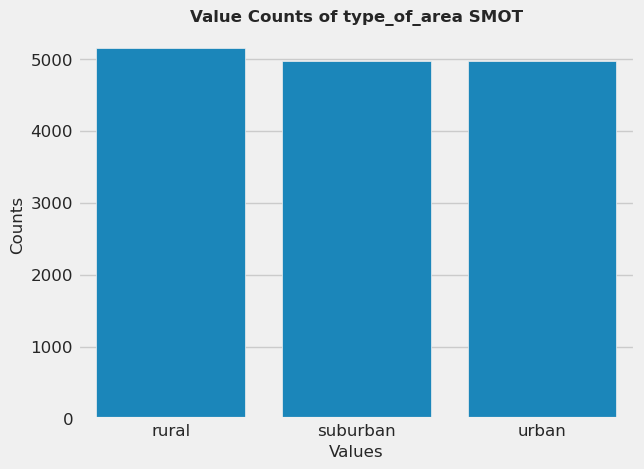

In [22]:
# Create a count plot using Seaborn
sns.countplot(data=Y_train_0_smot, x='type_of_area')
plt.title('Value Counts of type_of_area SMOT')
plt.xlabel('Values')
plt.ylabel('Counts')
plt.savefig('value_counts_smot_type_of_area.jpg', dpi=400, bbox_inches='tight')
plt.show()

In [23]:
rf_clf.fit(X_train_0, Y_train_0)
cboost_clf.fit(X_train_0, Y_train_0)
lgbm_clf.fit(X_train_0, Y_train_0)

LGBMClassifier(n_estimators=500, verbose=0)

In [172]:
rf_clf.fit(X_train_0_smot, Y_train_0_smot)
cboost_clf.fit(X_train_0_smot, Y_train_0_smot)
lgbm_clf.fit(X_train_0_smot, Y_train_0_smot)

LGBMClassifier(n_estimators=500, verbose=0)

In [40]:
rf_clf.fit(X_train_0_smotetomek, Y_train_0_smotetomek)
cboost_clf.fit(X_train_0_smotetomek, Y_train_0_smotetomek)
lgbm_clf.fit(X_train_0_smotetomek, Y_train_0_smotetomek)

LGBMClassifier(n_estimators=500, verbose=0)

In [148]:
rf_clf.fit(X_train_0_smoteenn, Y_train_0_smoteenn)
cboost_clf.fit(X_train_0_smoteenn, Y_train_0_smoteenn)
lgbm_clf.fit(X_train_0_smoteenn, Y_train_0_smoteenn)

LGBMClassifier(n_estimators=500, verbose=0)

In [72]:
#print('training lgbm')
#selected_feature_lgbm = train_with_important_feature({'model_name': 'lgbm', 'model': lgbm_clf}, X_train_0, Y_train_0, X_test_0, Y_test_0, init_num_feature=15)
#print('training rf')
#selected_feature_rf = train_with_important_feature({'model_name': 'rf', 'model': rf_clf}, X_train_0, Y_train_0, X_test_0, Y_test_0, init_num_feature=15)
#print('training cboost')
#selected_feature_cboost = train_with_important_feature({'model_name': 'cboost', 'model': cboost_clf}, X_train_0, Y_train_0, X_test_0, Y_test_0, init_num_feature=15)

In [73]:
# lgbm_features = selected_feature_lgbm['features']
# lgbm_clf = selected_feature_lgbm['model']

# rf_features = selected_feature_rf['features']
# rf_clf = selected_feature_rf['model']

# cboost_features = selected_feature_cboost['features']
# cboost_clf = selected_feature_cboost['model']

In [41]:
y_pred_prob_rf=rf_clf.predict_proba(test_data_0.drop(columns=['type_of_area']))
y_pred_prob_cboost=cboost_clf.predict_proba(test_data_0.drop(columns=['type_of_area']))
y_pred_prob_lgbm=lgbm_clf.predict_proba(test_data_0.drop(columns=['type_of_area']))
y_pred_prob_voting = (y_pred_prob_rf + y_pred_prob_cboost + y_pred_prob_lgbm)/3
rf_clf.classes_

array(['rural', 'suburban', 'urban'], dtype=object)

In [42]:
y_pred_0 = rf_clf.predict(test_data_0.drop(columns=['type_of_area']))
test_data['type_of_area_pred_rf'] = y_pred_0
test_data['type_of_area_pred_thr_voting'] = threshold_clf(y_pred_prob_voting)
test_data['type_of_area_voting'] = test_data[['type_of_area_gmap', 'type_of_area_pred_rf', 'type_of_area_pred_thr_voting']].apply(lambda row: Counter(row).most_common(1)[0][0], axis=1)
Acc_0 = accuracy_score(test_data['type_of_are_toar'].values, test_data['type_of_area_pred_rf'].values)
Acc_1 = accuracy_score(test_data['type_of_area_gmap'].values, test_data['type_of_area_pred_rf'].values)
Acc_2 = accuracy_score(test_data['type_of_are_toar'].values, test_data['type_of_area_pred_thr_voting'].values)
print("Accuracy w.r.t truth labels : {:.2f}%".format(Acc_0*100))
print("Accuracy w.r.t given labels: {:.2f}%".format(Acc_1*100))
print("Accuracy w.r.t voting labels: {:.2f}%".format(Acc_2*100))

Accuracy w.r.t truth labels : 100.00%
Accuracy w.r.t given labels: 87.88%
Accuracy w.r.t voting labels: 100.00%


In [43]:
y_pred_prob_rf=rf_clf.predict_proba(X_test_0)
y_pred_prob_cboost=cboost_clf.predict_proba(X_test_0)
y_pred_prob_lgbm=lgbm_clf.predict_proba(X_test_0)
y_pred_prob_voting = (y_pred_prob_rf + y_pred_prob_cboost + y_pred_prob_lgbm)/3

In [44]:
y_pred_0_rf = rf_clf.predict(X_test_0)
y_pred_0_cboost = cboost_clf.predict(X_test_0)
y_pred_0_lgbm = lgbm_clf.predict(X_test_0)
df_test_result = df_test[['area_code', 'type_of_area']]
df_test_result['type_of_area_pred_rf'] = y_pred_0_rf
df_test_result['type_of_area_pred_cboost'] = y_pred_0_cboost.reshape(len(y_pred_0_rf), )
df_test_result['type_of_area_pred_lgbm'] = y_pred_0_lgbm
df_test_result['type_of_area_pred_voting'] = df_test_result[['type_of_area_pred_rf', 'type_of_area_pred_cboost', 'type_of_area_pred_lgbm']].apply(lambda row: Counter(row).most_common(1)[0][0], axis=1)

In [45]:
model_pred = {'Random Forest':'type_of_area_pred_rf', 'Lgbm': 'type_of_area_pred_lgbm', 'CatBoost': 'type_of_area_pred_cboost',  'Voting': 'type_of_area_pred_voting'}
print_prediction_accuracies(df_test_result, model_pred)

Random Forest
global accuracy:  74.4
accuracy for predicting urban:  76.85
accuracy for predicting suburban:  59.66
accuracy for predicting rural:  83.14

Lgbm
global accuracy:  74.2
accuracy for predicting urban:  78.24
accuracy for predicting suburban:  60.08
accuracy for predicting rural:  79.31

CatBoost
global accuracy:  73.3
accuracy for predicting urban:  75.85
accuracy for predicting suburban:  58.82
accuracy for predicting rural:  81.61

Voting
global accuracy:  74.8
accuracy for predicting urban:  78.24
accuracy for predicting suburban:  60.5
accuracy for predicting rural:  81.23



In [46]:
y_pred_0_rf = threshold_clf(rf_clf.predict_proba(X_test_0))
y_pred_0_cboost = threshold_clf(cboost_clf.predict_proba(X_test_0))
y_pred_0_lgbm = threshold_clf(lgbm_clf.predict_proba(X_test_0))
df_test_result = df_test[['area_code', 'type_of_area']]
df_test_result['type_of_area_pred_rf'] = y_pred_0_rf
df_test_result['type_of_area_pred_cboost'] = y_pred_0_cboost.reshape(len(y_pred_0_rf), )
df_test_result['type_of_area_pred_lgbm'] = y_pred_0_lgbm
df_test_result['type_of_area_pred_voting'] = threshold_clf(y_pred_prob_voting)

In [47]:
model_pred = {'Random Forest':'type_of_area_pred_rf', 'Lgbm': 'type_of_area_pred_lgbm', 'CatBoost': 'type_of_area_pred_cboost',  'Voting': 'type_of_area_pred_voting'}
print_prediction_accuracies(df_test_result, model_pred)

Random Forest
global accuracy:  73.4
accuracy for predicting urban:  75.05
accuracy for predicting suburban:  62.18
accuracy for predicting rural:  80.46

Lgbm
global accuracy:  74.4
accuracy for predicting urban:  78.04
accuracy for predicting suburban:  61.34
accuracy for predicting rural:  79.31

CatBoost
global accuracy:  72.7
accuracy for predicting urban:  73.65
accuracy for predicting suburban:  62.18
accuracy for predicting rural:  80.46

Voting
global accuracy:  73.8
accuracy for predicting urban:  76.05
accuracy for predicting suburban:  61.76
accuracy for predicting rural:  80.46



Accuracy: 74.20%


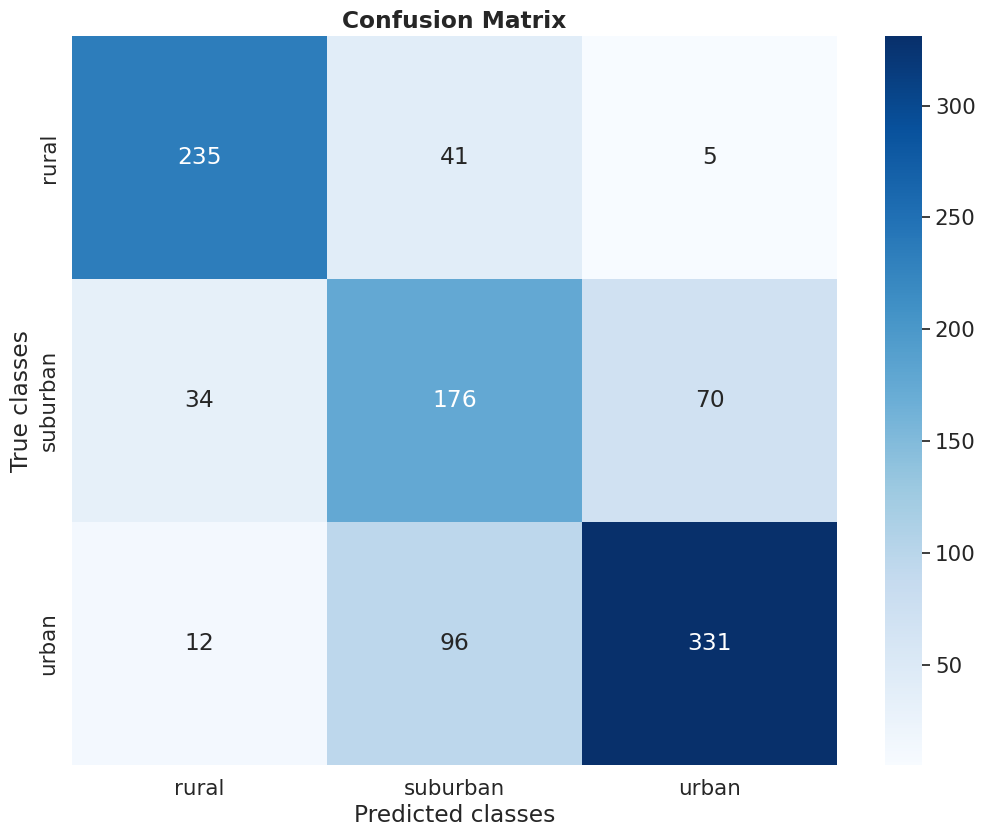

type_of_area
urban       439
rural       281
suburban    280
Name: count, dtype: int64

In [180]:
cf_matrix_roc_auc(
    df_test_result['type_of_area'].values,
    df_test_result['type_of_area_pred_rf'].values,
    fig_name='confusion_matrix_rf')
df_test_result['type_of_area'].value_counts()

Accuracy: 75.30%


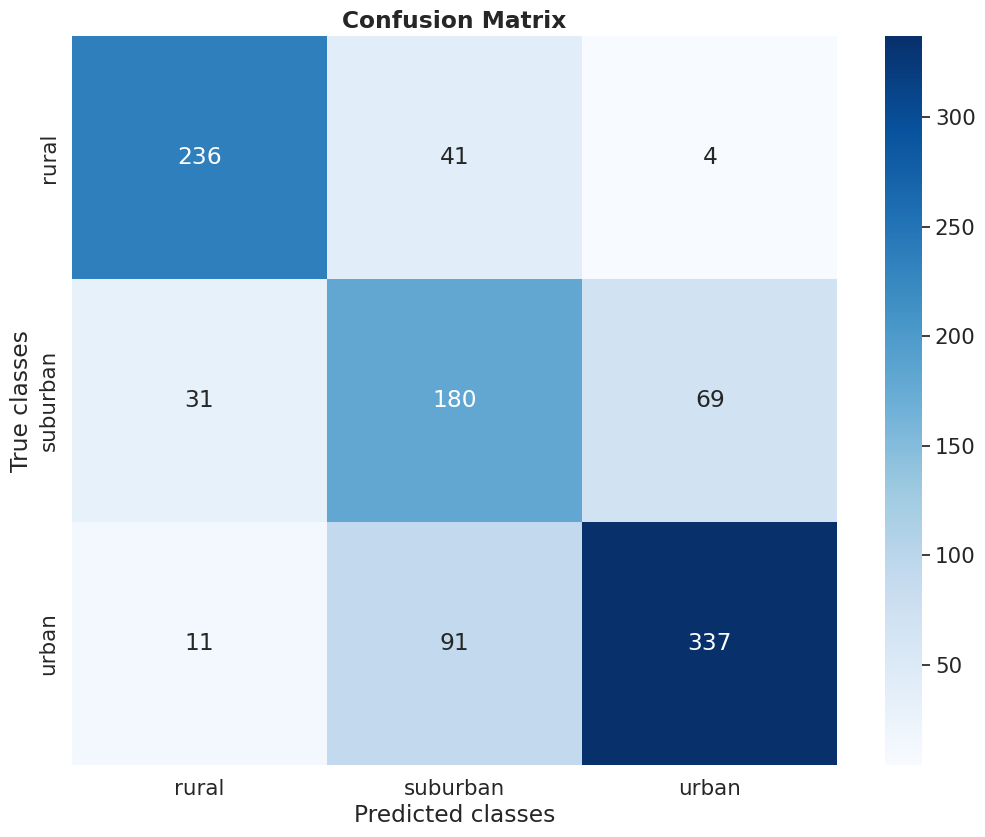

type_of_area
urban       439
rural       281
suburban    280
Name: count, dtype: int64

In [147]:
cf_matrix_roc_auc(
    df_test_result['type_of_area'].values,
    df_test_result['type_of_area_pred_voting'].values,
    fig_name='confusion_matrix_voting')
df_test_result['type_of_area'].value_counts()

type_of_area
urban       772
suburban    368
rural       301
unknown     207
Name: count, dtype: int64
total data points:  (1648, 31)
366 333 301
accuracy:  0.983756345177665


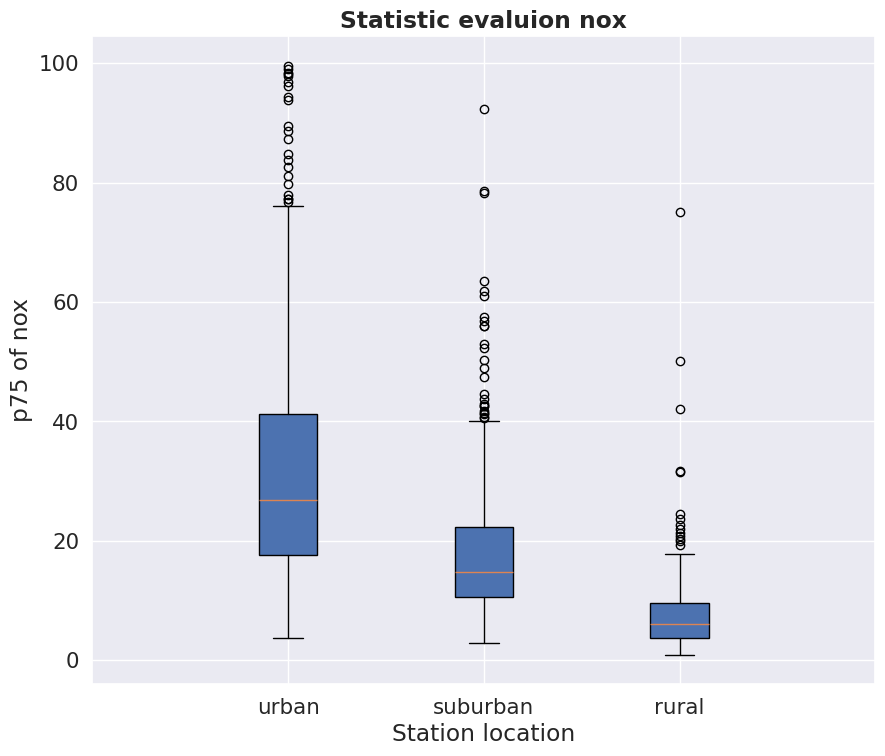

In [99]:
df_test_nox = prepare_data_for_stat_eval(dataset_0, df_nox, know_station_only=True)
stat_evaluation(df_test_nox[df_test_nox['nox']<=100], rf_clf, 'nox')

type_of_area
urban       768
unknown     378
suburban    294
rural       240
Name: count, dtype: int64
total data points:  (1680, 31)
466 294 240
accuracy:  0.9838383838383838


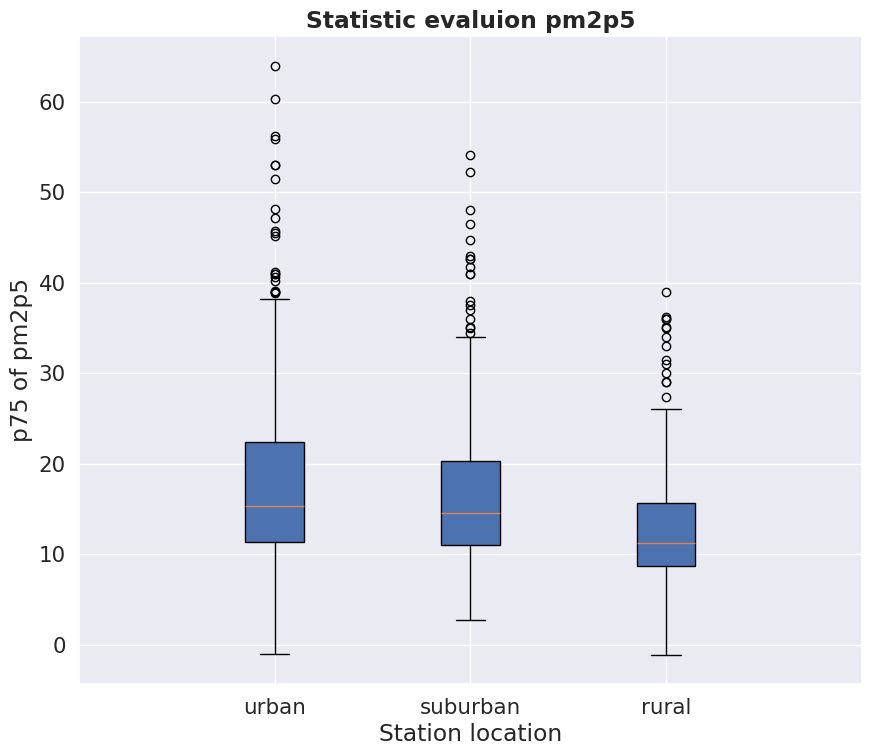

In [92]:
df_test_pm = prepare_data_for_stat_eval(dataset_0, df_pm, know_station_only=True)
stat_evaluation(df_test_pm[df_test_pm['pm2p5']<=70], rf_clf, 'pm2p5')

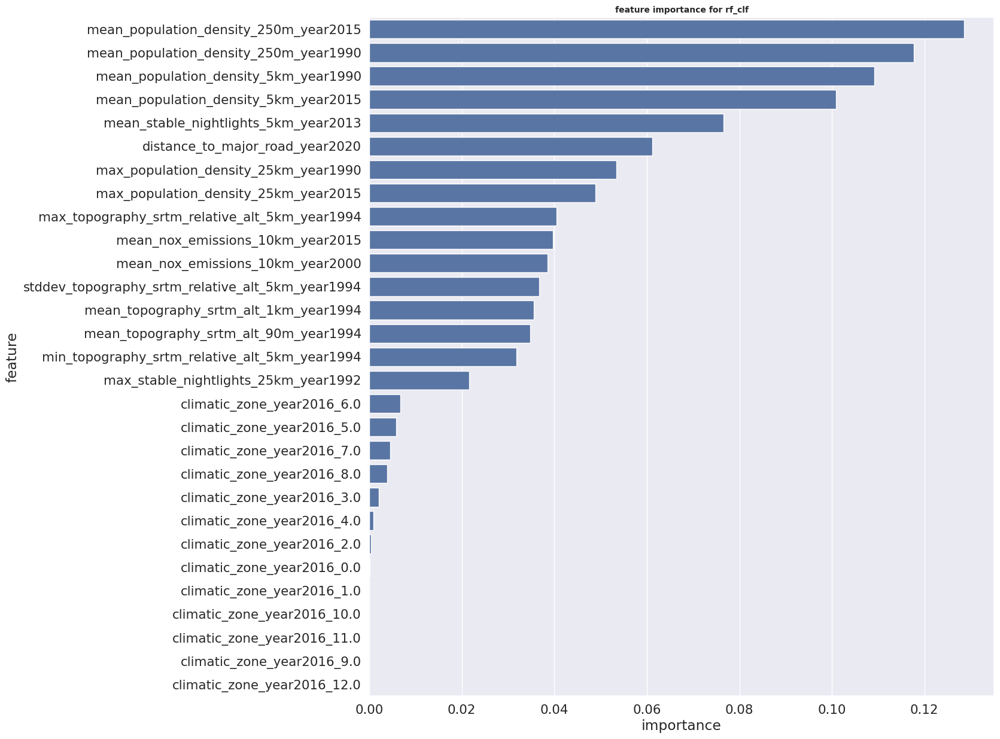

In [93]:
importance = rf_clf.feature_importances_
feature_rank = pd.DataFrame({'feature': list(X_train_0.columns), 'importance': importance})
feature_rank = feature_rank.sort_values('importance', ascending=False)
features = feature_rank['feature'].to_list()
important_features = features[:]
plt.figure(figsize=(12, 14))
sns.barplot(y='feature', x='importance', data=feature_rank)
plt.title(f"feature importance for rf_clf", size=10)
plt.show()

In [54]:
df_test_misclass = df_test_result[~(df_test_result['type_of_area']==df_test_result['type_of_area_pred_rf'])]

In [47]:
#df_test_misclass[(df_test_misclass['type_of_area']=='urban')&(df_test_misclass['type_of_area_pred_rf']=='rural')]

In [56]:
#df_test_misclass[(df_test_misclass['type_of_area']=='urban')&(df_test_misclass['type_of_area_pred_rf']=='suburban')]

In [57]:
#df_test_misclass[(df_test_misclass['type_of_area']=='suburban')&(df_test_misclass['type_of_area_pred_rf']=='rural')]

In [158]:
labelled_data = data[~(data['type_of_area']=='unknown')]
unlabelled_data = data[(data['type_of_area']=='unknown')]
print('number of data point: ', data.shape)
print("number of known station: ", labelled_data.shape)
print('number of unlabelled station: ', unlabelled_data.shape)
df_train, df_test = train_test_split(labelled_data, test_size=1000, shuffle=False, random_state=42)
print('training shape: ', df_train.shape)
print('test shape: ', df_test.shape)
df_test_idx = list(df_test.index)
df_train_idx = list(df_train.index)
labeled_idx = list(labelled_data.index)
unlabeled_idx = list(unlabelled_data.index)

number of data point:  (22352, 22)
number of known station:  (12455, 22)
number of unlabelled station:  (9897, 22)
training shape:  (11455, 22)
test shape:  (1000, 22)


In [57]:
# we first selecte the most recent infos and analyse the correlation between variable
selected_colunms_1 = ['mean_topography_srtm_alt_90m_year1994', 
                      'max_topography_srtm_relative_alt_5km_year1994', 
                      'stddev_topography_srtm_relative_alt_5km_year1994', 
                      'min_topography_srtm_relative_alt_5km_year1994', 
                      'climatic_zone_year2016', 
                      'distance_to_major_road_year2020', 
                      'mean_stable_nightlights_1km_year2013',
                      'mean_stable_nightlights_5km_year2013', 
                      'mean_population_density_250m_year2015',
                      'mean_population_density_5km_year2015', 
                      'max_population_density_25km_year2015',
                      'mean_nox_emissions_10km_year2015', 
                      'type_of_area']
colunms_1 = [
    'mean_topography_srtm_alt_90m_year1994', 
    'max_topography_srtm_relative_alt_5km_year1994', 
    'min_topography_srtm_relative_alt_5km_year1994', 
    'distance_to_major_road_year2020', 
    'climatic_zone_year2016',
    'mean_stable_nightlights_5km_year2013', 
    'max_stable_nightlights_25km_year1992', 
    'mean_population_density_250m_year2015', 
    'mean_population_density_5km_year2015', 
    'max_population_density_25km_year2015', 
    'mean_nox_emissions_10km_year2015', 
    'type_of_area'
]
dataset_1 = feature_engineering_selection(data, selected_columns=colunms_1, scaling='robust', encode_cat=True)
#plot_correlation(dataset_1[list(dataset_1.columns)[:-1]])
print(len(df_train_idx))
print(len(df_test_idx))
df_train_1 = dataset_1.loc[df_train_idx] #[(dataset_1.index.isin(df_train_idx))]
df_test_1 = dataset_1.loc[df_test_idx] #[(dataset_1.index.isin(df_test_idx))]
print('training shape', df_train_1.shape)
print('test shape: ', df_test_1.shape)
df_unlabeled_1 = dataset_1.loc[unlabeled_idx] #[(dataset_0.index.isin(unlabeled_idx))]
test_data_1 = dataset_1.loc[test_indeces]
#display(df_train_1.head(2))
X_train_1 = df_train_1.drop(columns=['type_of_area'])
Y_train_1 = df_train_1[['type_of_area']]
X_test_1 = df_test_1.drop(columns=['type_of_area'])
Y_test_1 = df_test_1[['type_of_area']]

11455
1000
training shape (11455, 24)
test shape:  (1000, 24)


,,mean_topography_srtm_alt_90m_year1994,max_topography_srtm_relative_alt_5km_year1994,min_topography_srtm_relative_alt_5km_year1994,distance_to_major_road_year2020,mean_stable_nightlights_5km_year2013,max_stable_nightlights_25km_year1992,mean_population_density_250m_year2015,mean_population_density_5km_year2015,max_population_density_25km_year2015,mean_nox_emissions_10km_year2015,...,climatic_zone_year2016_4.0,climatic_zone_year2016_5.0,climatic_zone_year2016_6.0,climatic_zone_year2016_7.0,climatic_zone_year2016_8.0,climatic_zone_year2016_9.0,climatic_zone_year2016_10.0,climatic_zone_year2016_11.0,climatic_zone_year2016_12.0,type_of_area
lat,lon,,,,,,,,,,,,,,,,,,,,,
39.515338,-84.187159,0.453855,-0.155556,-0.632653,-0.318906,-0.433221,0.0,-0.367367,-0.312672,-0.083297,0.356377,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,suburban
42.854800,-2.680700,1.243214,0.408889,0.061224,-0.241582,0.314559,0.0,1.567690,0.806182,0.302764,-0.417194,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,urban


In [58]:
rf_clf = RandomForestClassifier(n_estimators=500, criterion = 'entropy', random_state = 42, class_weight=cl_weights)
cboost_clf = CatBoostClassifier(n_estimators=500, verbose=False)
lgbm_clf =  LGBMClassifier(n_estimators=500 , verbose=0)
#v_clf =  VotingClassifier(estimators=[('rf_clf', rf_clf), ('cboost_clf', cboost_clf), ('lgbm', lbm_clf)])

In [56]:
rf_clf.fit(X_train_1, Y_train_1)
cboost_clf.fit(X_train_1, Y_train_1)
lgbm_clf.fit(X_train_1, Y_train_1)

LGBMClassifier(n_estimators=500, verbose=0)

In [563]:
y_pred_1 = rf_clf.predict(test_data_1.drop(columns=['type_of_area']))
test_data['type_of_area_pred_rf'] = y_pred_1
Acc_0 = accuracy_score(test_data['type_of_are_truth'].values, test_data['type_of_area_pred_rf'].values)
Acc_1 = accuracy_score(test_data['type_of_area_given'].values, test_data['type_of_area_pred_rf'].values)
print("Accuracy w.r.t truth labels : {:.2f}%".format(Acc_0*100))
print("Accuracy w.r.t given labels: {:.2f}%".format(Acc_1*100))

Accuracy w.r.t truth labels : 100.00%
Accuracy w.r.t given labels: 87.88%


In [564]:
y_pred_1_rf = rf_clf.predict(X_test_1)
y_pred_1_cboost = cboost_clf.predict(X_test_1)
y_pred_1_lbm = lgbm_clf.predict(X_test_1)
y_pred_1_voting = voting_clf({'rf_clf': rf_clf, 'cboost': cboost_clf, 'lgbm': lgbm_clf}, X_test_1)

In [565]:
df_test_result = df_test[['area_code', 'type_of_area']]
df_test_result['type_of_area_pred_rf'] = y_pred_1_rf
df_test_result['type_of_area_pred_cboost'] = y_pred_1_cboost.reshape(len(y_pred_1_rf), )
df_test_result['type_of_area_pred_lbm'] = y_pred_1_lbm
df_test_result['type_of_area_pred_voting'] = y_pred_1_voting
df_test_result.head()

,,area_code,type_of_area,type_of_area_pred_rf,type_of_area_pred_cboost,type_of_area_pred_lbm,type_of_area_pred_voting
lat,lon,,,,,,
47.286109,-2.032286,FR23149,suburban,urban,urban,urban,urban
45.757731,4.854217,FR20062,urban,urban,urban,urban,urban
46.775002,23.596678,RO0074A,urban,rural,rural,rural,rural
56.047271,12.691271,SE0053A,urban,urban,urban,urban,urban
48.273290,14.314790,AT4S416,urban,urban,urban,urban,urban


## ====================== Predict unknown stations ===========================

In [48]:
X_unlabelled_0 = df_unlabeled_0.drop(columns=['type_of_area'])
Y_unlabelled_0 = df_train_0[['type_of_area']]
df_unlabeled_idxcode = dataset.loc[unlabeled_idx]

In [49]:
Y_unlabelled_pred_rf = rf_clf.predict(X_unlabelled_0)
Y_unlabelled_pred_cboost = cboost_clf.predict(X_unlabelled_0)
Y_unlabelled_pred_lbm = lgbm_clf.predict(X_unlabelled_0)
Y_unlabelled_pred_voting = voting_clf({'rf_clf': rf_clf, 'cboost': cboost_clf, 'lgbm': lgbm_clf}, X_unlabelled_0)

In [50]:
df_unknow_stations_pred = df_unlabeled_idxcode[['area_code', 'type_of_area']]
df_unknow_stations_pred['type_of_area_pred_rf'] = Y_unlabelled_pred_rf
df_unknow_stations_pred['type_of_area_pred_cboost'] = Y_unlabelled_pred_cboost.reshape(len(Y_unlabelled_pred_voting), )
df_unknow_stations_pred['type_of_area_pred_lbm'] = Y_unlabelled_pred_lbm
df_unknow_stations_pred['type_of_area_pred_voting'] = Y_unlabelled_pred_voting

In [51]:
df_unknow_stations_pred.head()

,,area_code,type_of_area,type_of_area_pred_rf,type_of_area_pred_cboost,type_of_area_pred_lbm,type_of_area_pred_voting
lat,lon,,,,,,
37.972200,-122.518900,openaq_2002,unknown,urban,urban,urban,urban
14.352220,100.565325,openaq_225676,unknown,urban,urban,urban,urban
34.668600,112.443300,3022A,unknown,urban,urban,urban,urban
41.322472,-95.937992,openaq_1075,unknown,urban,suburban,suburban,suburban
45.294130,-73.348570,055301,unknown,rural,rural,suburban,rural


In [52]:
Y_unlabelled_pred_prob_rf=rf_clf.predict_proba(X_unlabelled_0)
Y_unlabelled_pred_prob_cboost=cboost_clf.predict_proba(X_unlabelled_0)
Y_unlabelled_pred_prob_lgbm=lgbm_clf.predict_proba(X_unlabelled_0)
Y_unlabelled_pred_prob_voting = (Y_unlabelled_pred_prob_rf + Y_unlabelled_pred_prob_cboost + Y_unlabelled_pred_prob_lgbm)/3

In [53]:
Y_unlabelled_0_rf = threshold_clf(rf_clf.predict_proba(X_unlabelled_0))
Y_unlabelled_0_cboost = threshold_clf(cboost_clf.predict_proba(X_unlabelled_0))
Y_unlabelled_0_lgbm = threshold_clf(lgbm_clf.predict_proba(X_unlabelled_0))

In [54]:
df_unknow_stations_pred_prob = df_unlabeled_idxcode[['area_code', 'type_of_area']]
df_unknow_stations_pred_prob['type_of_area_pred_rf'] = Y_unlabelled_0_rf
df_unknow_stations_pred_prob['type_of_area_pred_cboost'] = Y_unlabelled_0_cboost.reshape(len(Y_unlabelled_0_cboost), )
df_unknow_stations_pred_prob['type_of_area_pred_lgbm'] = Y_unlabelled_0_lgbm
df_unknow_stations_pred_prob['type_of_area_pred_voting'] = threshold_clf(Y_unlabelled_pred_prob_voting)

In [55]:
df_unknow_stations_pred_prob

,,area_code,type_of_area,type_of_area_pred_rf,type_of_area_pred_cboost,type_of_area_pred_lgbm,type_of_area_pred_voting
lat,lon,,,,,,
37.972200,-122.518900,openaq_2002,unknown,urban,urban,urban,urban
14.352220,100.565325,openaq_225676,unknown,urban,urban,urban,urban
34.668600,112.443300,3022A,unknown,urban,urban,urban,urban
41.322472,-95.937992,openaq_1075,unknown,urban,suburban,suburban,suburban
45.294130,-73.348570,055301,unknown,rural,rural,suburban,rural
...,...,...,...,...,...,...,...
47.349140,11.693101,openaq_2767,unknown,suburban,suburban,suburban,suburban
28.632775,-106.038867,openaq_8095,unknown,urban,urban,urban,urban
41.266400,123.799200,openaq_8931,unknown,urban,urban,urban,urban


In [56]:
df_pred = df_unknow_stations_pred_prob.copy()

In [57]:
df_pred.reset_index(drop=False, inplace=True)

In [58]:
df_pred

,lat,lon,area_code,type_of_area,type_of_area_pred_rf,type_of_area_pred_cboost,type_of_area_pred_lgbm,type_of_area_pred_voting
0,37.972200,-122.518900,openaq_2002,unknown,urban,urban,urban,urban
1,14.352220,100.565325,openaq_225676,unknown,urban,urban,urban,urban
2,34.668600,112.443300,3022A,unknown,urban,urban,urban,urban
3,41.322472,-95.937992,openaq_1075,unknown,urban,suburban,suburban,suburban
4,45.294130,-73.348570,055301,unknown,rural,rural,suburban,rural
...,...,...,...,...,...,...,...,...
9965,47.349140,11.693101,openaq_2767,unknown,suburban,suburban,suburban,suburban
9966,28.632775,-106.038867,openaq_8095,unknown,urban,urban,urban,urban
9967,41.266400,123.799200,openaq_8931,unknown,urban,urban,urban,urban
9968,41.704444,140.505556,jp01334020,unknown,rural,rural,rural,rural


In [59]:
df_pred.to_csv('unknow_station_predict.csv', index=False)

In [ ]:
y_pred_0 = rf_clf.predict(test_data_0.drop(columns=['type_of_area']))
test_data['type_of_area_pred_rf'] = y_pred_0
test_data['type_of_area_pred_thr_voting'] = threshold_clf(y_pred_prob_voting)
Acc_0 = accuracy_score(test_data['type_of_are_truth'].values, test_data['type_of_area_pred_rf'].values)
Acc_1 = accuracy_score(test_data['type_of_area_given'].values, test_data['type_of_area_pred_rf'].values)
Acc_2 = accuracy_score(test_data['type_of_are_truth'].values, test_data['type_of_area_pred_thr_voting'].values)
print("Accuracy w.r.t truth labels : {:.2f}%".format(Acc_0*100))
print("Accuracy w.r.t given labels: {:.2f}%".format(Acc_1*100))
print("Accuracy w.r.t voting labels: {:.2f}%".format(Acc_2*100))

In [566]:
print('Random forest accuracy: ', accuracy_score(df_test_result['type_of_area'].values, df_test_result['type_of_area_pred_rf'].values))
print('catboost accuracy: ', accuracy_score(df_test_result['type_of_area'].values, df_test_result['type_of_area_pred_lbm'].values))
print('lgbm accuracy: ', accuracy_score(df_test_result['type_of_area'].values, df_test_result['type_of_area_pred_cboost'].values))
print('voting accuracy: ', accuracy_score(df_test_result['type_of_area'].values, df_test_result['type_of_area_pred_voting'].values))

Random forest accuracy:  0.356
catboost accuracy:  0.355
lgbm accuracy:  0.352
voting accuracy:  0.355


In [567]:
urban_pred = df_test_result[df_test_result['type_of_area']=='urban']
suburban_pred = df_test_result[df_test_result['type_of_area']=='suburban']
rural_pred = df_test_result[df_test_result['type_of_area']=='rural']
print('accuracy of predicting urban rf: ', accuracy_score(urban_pred['type_of_area'].values, urban_pred['type_of_area_pred_rf'].values))
print('accuracy of predicting rural rf: ', accuracy_score(rural_pred['type_of_area'].values, rural_pred['type_of_area_pred_rf'].values))
print('accuracy of predicting suburan rf: ', accuracy_score(suburban_pred['type_of_area'].values, suburban_pred['type_of_area_pred_rf'].values))
print()
print('accuracy of predicting urban lgbm: ', accuracy_score(urban_pred['type_of_area'].values, urban_pred['type_of_area_pred_lbm'].values))
print('accuracy of predicting rural lgbm: ', accuracy_score(rural_pred['type_of_area'].values, rural_pred['type_of_area_pred_lbm'].values))
print('accuracy of predicting suburan lgbm: ', accuracy_score(suburban_pred['type_of_area'].values, suburban_pred['type_of_area_pred_lbm'].values))
print()
print('accuracy of predicting urban cboost: ', accuracy_score(urban_pred['type_of_area'].values, urban_pred['type_of_area_pred_cboost'].values))
print('accuracy of predicting rural cboost: ', accuracy_score(rural_pred['type_of_area'].values, rural_pred['type_of_area_pred_cboost'].values))
print('accuracy of predicting suburan cboost: ', accuracy_score(suburban_pred['type_of_area'].values, suburban_pred['type_of_area_pred_cboost'].values))
print()
print('accuracy of predicting urban cboost: ', accuracy_score(urban_pred['type_of_area'].values, urban_pred['type_of_area_pred_voting'].values))
print('accuracy of predicting rural cboost: ', accuracy_score(rural_pred['type_of_area'].values, rural_pred['type_of_area_pred_voting'].values))
print('accuracy of predicting suburan voting: ', accuracy_score(suburban_pred['type_of_area'].values, suburban_pred['type_of_area_pred_voting'].values))

accuracy of predicting urban rf:  0.4889867841409692
accuracy of predicting rural rf:  0.2753623188405797
accuracy of predicting suburan rf:  0.21481481481481482

accuracy of predicting urban lgbm:  0.486784140969163
accuracy of predicting rural lgbm:  0.26811594202898553
accuracy of predicting suburan lgbm:  0.2222222222222222

accuracy of predicting urban cboost:  0.473568281938326
accuracy of predicting rural cboost:  0.26811594202898553
accuracy of predicting suburan cboost:  0.23333333333333334

accuracy of predicting urban cboost:  0.4801762114537445
accuracy of predicting rural cboost:  0.2717391304347826
accuracy of predicting suburan voting:  0.22962962962962963


Accuracy: 76.60%


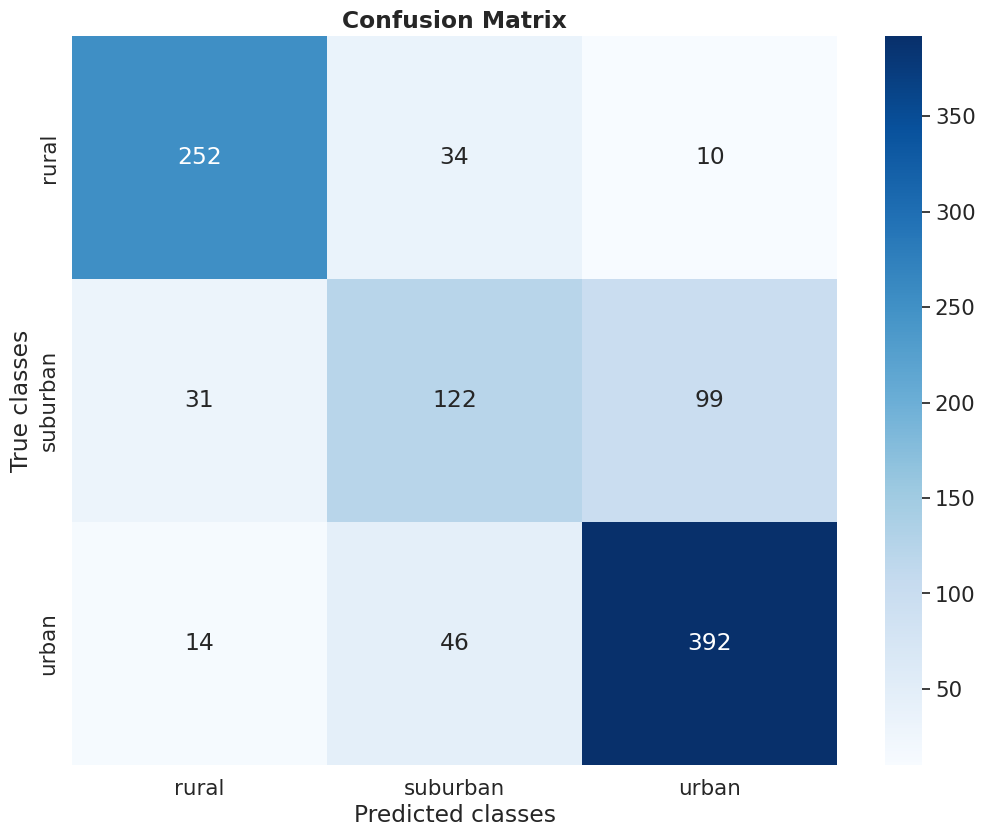

type_of_area
urban       452
rural       296
suburban    252
Name: count, dtype: int64

In [56]:
cf_matrix_roc_auc(
    df_test_result['type_of_area'].values,
    df_test_result['type_of_area_pred_rf'].values,
    fig_name='confusion_matrix_rf')
df_test_result['type_of_area'].value_counts()

Accuracy: 75.90%


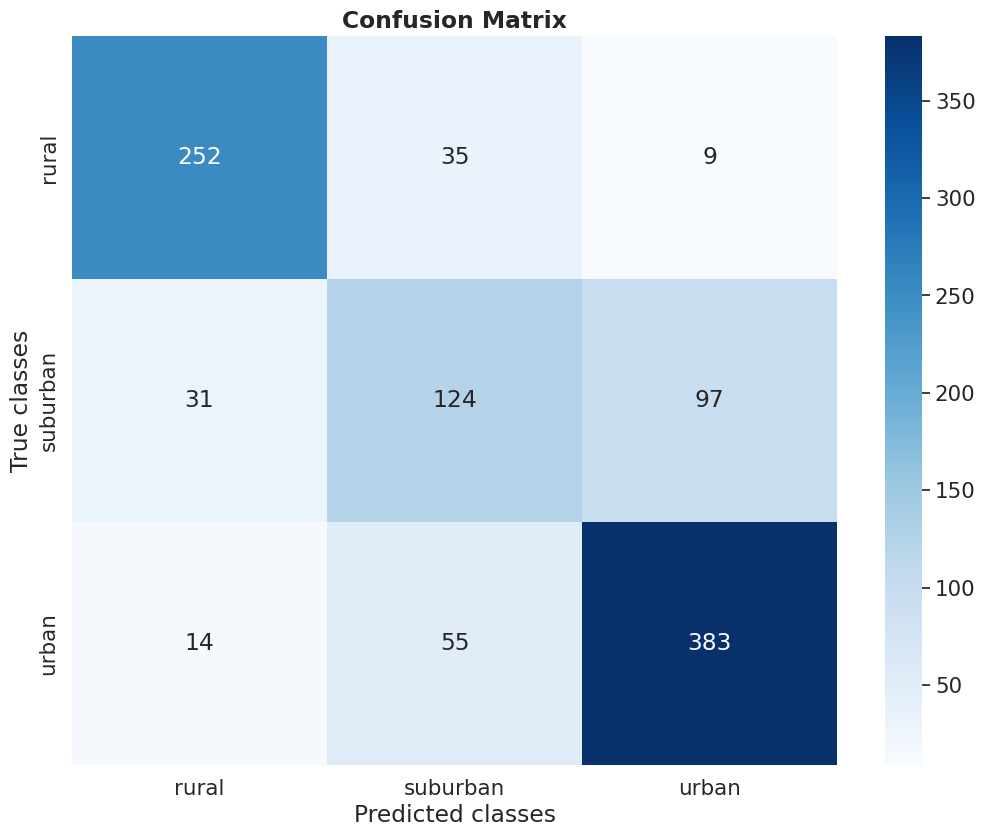

In [57]:
cf_matrix_roc_auc(
    df_test_result['type_of_area'].values,
    df_test_result['type_of_area_pred_voting'].values,
    fig_name='confusion_matrix_voting')

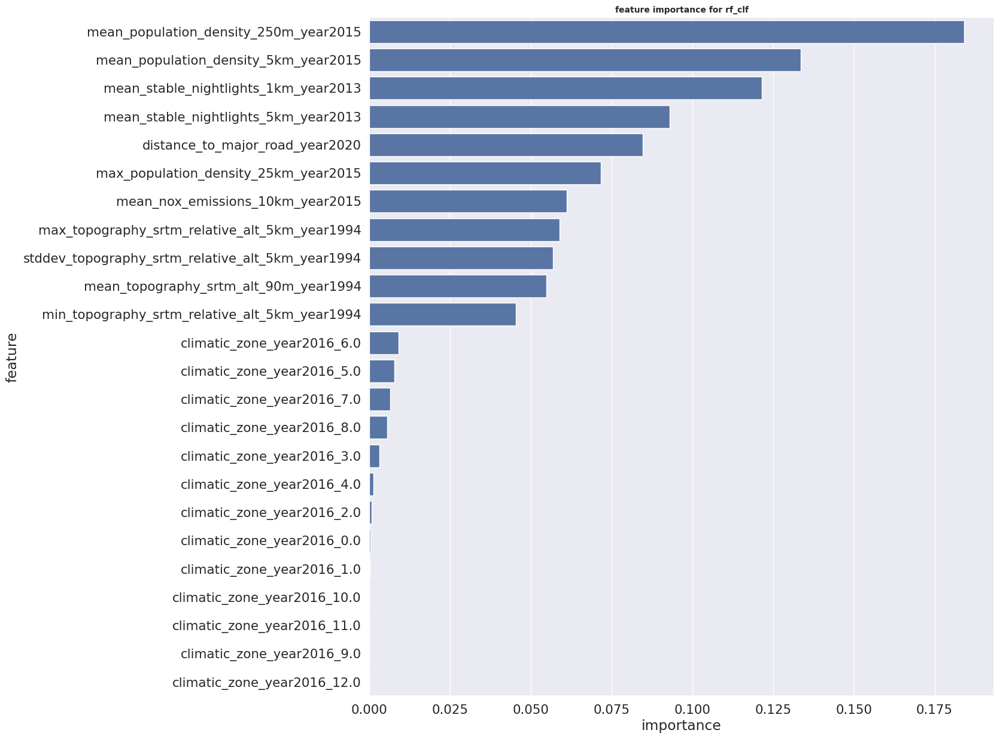

In [74]:
importance = rf_clf.feature_importances_
feature_rank = pd.DataFrame({'feature': list(X_train_1.columns), 'importance': importance})
feature_rank = feature_rank.sort_values('importance', ascending=False)
features = feature_rank['feature'].to_list()
important_features = features[:]
plt.figure(figsize=(12, 14))
sns.barplot(y='feature', x='importance', data=feature_rank)
plt.title(f"feature importance for rf_clf", size=10)
plt.savefig('features_importance.jpg', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
lat_train = list(df_train.index.get_level_values('lat'))
lon_train = list(df_train.index.get_level_values('lon'))

lat_test = list(df_test.index.get_level_values('lat'))
lon_test = list(df_test.index.get_level_values('lon'))
# lat_pred = list(df_unlabeled_1.index.get_level_values('lat'))
# lon_pred = list(df_unlabeled_1.index.get_level_values('lon'))
lat_no2 = list(df_no2.index.get_level_values('lat'))
lon_no2 = list(df_no2.index.get_level_values('lon'))

lat_pm = list(df_pm_test.index.get_level_values('lat'))
lon_pm = list(df_pm_test.index.get_level_values('lon'))

In [ ]:
# Create a figure and axes with Plate Carree projection
plt.figure(figsize=(10, 6))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()
#ax.set_axis_on()
# Add coastlines and borders
ax.coastlines()
ax.add_feature(cartopy.feature.BORDERS)
# Plot earthquake locations with magnitude as size and color
#ax.scatter(lon_no2, lat_no2, s=10, color = 'blue',  alpha=0.7, label='no2')
ax.scatter(lon_pm, lat_pm, s=10, color = 'orange',  alpha=0.7, label='pm2p5')
# ax.scatter(lon_train, lat_train, s=10, color = 'blue',  alpha=0.7, label='train')
# ax.scatter(lon_test, lat_test, s=10, color = 'red', alpha=0.7, label='test')
# ax.scatter(lon_pred, lat_pred, s=10, color = 'orange',  alpha=0.7, label='predict')
# ax.scatter(lon_train, lat_train, s=10, color = 'blue',  alpha=0.7)
# ax.scatter(lon_test, lat_test, s=10, color = 'red', alpha=0.7)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Distribution of train, test, and predict station locations',fontsize=12)
plt.legend(loc='best')
plt.savefig('data_split.jpg', dpi=300, bbox_inches='tight')
plt.show()
# Add color bar legend

### ============================== END ================================

In [659]:
y_unlabeled_pred_rf_1 = rf_clf.predict(df_unlabeled_1.drop(columns=['type_of_area']))
y_unlabeled_pred_lgbm_1 = lgbm_clf.predict(df_unlabeled_1.drop(columns=['type_of_area']))
y_unlabeled_pred_cboost_1 = cboost_clf.predict(df_unlabeled_1.drop(columns=['type_of_area']))

df_unlabeled_pred = df_unlabeled_1[['type_of_area']]
df_unlabeled_pred['type_of_area_pred_rf'] = y_unlabeled_pred_rf_1
df_unlabeled_pred['type_of_area_pred_lgbm'] = y_unlabeled_pred_lgbm_1
df_unlabeled_pred['type_of_area_pred_cboost'] = y_unlabeled_pred_cboost_1.reshape(len(y_unlabeled_pred_rf_1), )

In [660]:
df_unlabeled_pred_correct = df_unlabeled_pred[(df_unlabeled_pred['type_of_area_pred_rf'] == df_unlabeled_pred['type_of_area_pred_lgbm']) & (df_unlabeled_pred['type_of_area_pred_rf']==df_unlabeled_pred['type_of_area_pred_cboost'])]

In [568]:
unlabeled_pred_urban_idx = list(df_unlabeled_pred_correct[df_unlabeled_pred_correct['type_of_area_pred_rf']=='urban'].index)
unlabeled_pred_suburban_idx = list(df_unlabeled_pred_correct[df_unlabeled_pred_correct['type_of_area_pred_rf']=='suburban'].index)
unlabeled_pred_rural_idx = list(df_unlabeled_pred_correct[df_unlabeled_pred_correct['type_of_area_pred_rf']=='rural'].index)

In [57]:
# def augment_data_with_ml_pred(df_unlabeled, global_data, ml_model:dict):
#     rf_clf = ml_model['rf_clf']
#     cboost_clf = ml_model['cboost']
#     lgbm_clf = ml_model['lgbm']
#     y_pred_prob_rf = rf_clf.predict_proba(df_unlabeled.drop(columns=['type_of_area']))
#     y_pred_prob_cboost = cboost_clf.predict_proba(df_unlabeled.drop(columns=['type_of_area']))
#     y_pred_prob_lgbm = lgbm_clf.predict_proba(df_unlabeled.drop(columns=['type_of_area']))
#     y_pred_prob_voting = (y_pred_prob_rf + y_pred_prob_cboost + y_pred_prob_lgbm)/3
    
#     y_pred_rf = threshold_clf(y_pred_prob_rf)
#     y_pred_cboost = threshold_clf(y_pred_prob_cboost)
#     y_pred_lgbm = threshold_clf(y_pred_prob_lgbm)
#     y_pred_voting = threshold_clf(y_pred_prob_voting)
    
#     df_pred = df_unlabeled[['type_of_area']]
#     df_pred['type_of_area_rf'] = y_pred_rf
#     df_pred['type_of_area_lgbm'] = y_pred_lgbm
#     df_pred['type_of_area_cboost'] = y_pred_cboost
#     df_pred['type_of_area_thr_voting'] = y_pred_voting
    
#     condition = (df_pred['type_of_area_rf'] == df_pred['type_of_area_lgbm']) & (df_pred['type_of_area_rf'] == df_pred['type_of_area_cboost']) & (df_pred['type_of_area_rf'] == df_pred['type_of_area_thr_voting'])
#     df_pred = df_pred[condition]
#     df_augment = global_data.copy()
#     pred_urban_idx = list(df_pred[df_pred['type_of_area_rf']=='urban'].index)
#     pred_suburban_idx = list(df_pred[df_pred['type_of_area_rf']=='suburban'].index)
#     pred_rural_idx = list(df_pred[df_pred['type_of_area_rf']=='rural'].index)
    
#     df_augment.loc[pred_urban_idx, 'type_of_area'] = 'urban'
#     df_augment.loc[pred_suburban_idx, 'type_of_area'] = 'suburban'
#     df_augment.loc[pred_rural_idx, 'type_of_area'] = 'rural'
#     return df_augment

In [ ]:
# dataset_1.loc[unlabeled_pred_urban_idx, 'type_of_area'] = 'urban'
# dataset_1.loc[unlabeled_pred_suburban_idx, 'type_of_area'] = 'suburban'
# dataset_1.loc[unlabeled_pred_rural_idx, 'type_of_area'] = 'rural'
# train_idx = df_train_idx + unlabeled_pred_urban_idx + unlabeled_pred_suburban_idx + unlabeled_pred_rural_idx
#dataset_1.loc[urban_to_rural_idx, 'type_of_area'] = 'rural'

In [72]:
#df_unlabeled_pred_correct.head(60)

In [446]:
#df.loc[indices_to_replace, 'A'] = new_values
urban_to_rural_idx = list(rural_pred.index)

In [430]:
#urban_pred[urban_pred['type_of_area']=='rural']

In [432]:
#df_train_1 = dataset_1[(dataset_1.index.isin(df_train_idx))]

In [433]:
#rural_pred_  = dataset[(dataset.index.isin(rural_pred.index))]

In [436]:
#rural_pred_[rural_pred_['type_of_area']=='urban']

In [113]:
df_test_1_suburban = rural_pred[rural_pred['type_of_area']=='suburban']

In [114]:
df_test_1_suburban1 = df_test_1[(df_test_1.index.isin(df_test_1_suburban.index))]

In [115]:
X_test_1_suburban = df_test_1_suburban1.drop(columns=['type_of_area'])

In [120]:
y_pred_1_suburban_rf = rf_clf.predict_proba(df_test_1_suburban1.drop(columns=['type_of_area']))
y_pred_1_suburban_cboost = cboost_clf.predict_proba(df_test_1_suburban1.drop(columns=['type_of_area']))
y_pred_1_suburban_lgbm = lgbm_clf.predict_proba(df_test_1_suburban1.drop(columns=['type_of_area']))

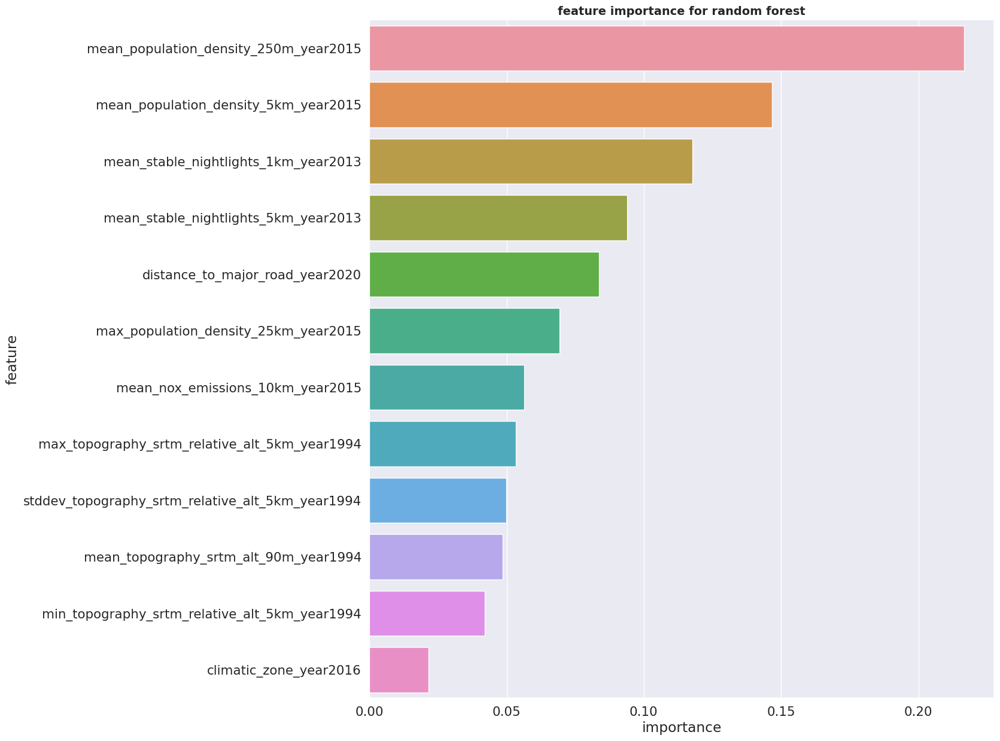

In [62]:
importance = rf_clf.feature_importances_
feature_rank = pd.DataFrame({'feature': list(X_train_1.columns), 'importance': importance})
feature_rank = feature_rank.sort_values('importance', ascending=False)
features = feature_rank['feature'].to_list()
plt.figure(figsize=(12, 14))
sns.barplot(y='feature', x='importance', data=feature_rank)
plt.title("feature importance for random forest", size=14)
plt.savefig('feauture_importance.jpg', dpi=300)
plt.show()

Accuracy: 71.20%


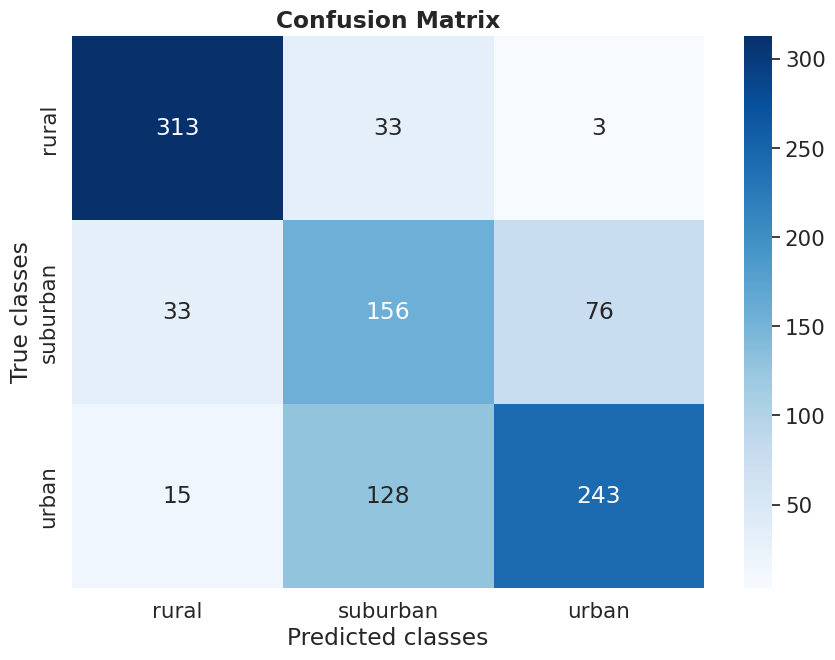

In [124]:
cf_matrix_roc_auc(
    df_test_result['type_of_area'].values,
    df_test_result['type_of_area_pred_rf'].values,
    fig_name='confusion_matrix')

In [ ]:
# we selecte less cooreleted variables and analyse the correlation between variable
selected_colunms_1 = ['altitude', 'mean_population_density_5km_year2015', 'mean_stable_nightlights_5km_year2013', 'distance_to_major_road_year2020',  'max_topography_srtm_relative_alt_5km_year1994',  
                      'min_topography_srtm_relative_alt_5km_year1994', 'mean_nox_emissions_10km_year2015', 'type_of_area']

selected_colunms_2 = ['altitude',  'mean_population_density_5km_year2015', 'mean_stable_nightlights_5km_year2013', 'distance_to_major_road_year2020',  'max_topography_srtm_relative_alt_5km_year1994','type_of_area']

selected_colunms_3 = ['altitude', 'mean_nox_emissions_10km_year2015', 'mean_population_density_5km_year2015', 'mean_stable_nightlights_5km_year2013', 'distance_to_major_road_year2020', 'max_topography_srtm_relative_alt_5km_year1994',
                      'type_of_area']
dataset_0 = feature_engineering_selection(dataset, selected_columns=selected_colunms_0, scaling='minmax')
print(len(df_train_idx))
print(len(df_test_idx))
print(len(unlabeled_idx))
df_train_0 = dataset_0[(dataset_0.index.isin(df_train_idx))]
df_test_0 = dataset_0[(dataset_0.index.isin(df_test_idx))]
print('training shape', df_train_0.shape)
print('test shape: ', df_test_0.shape)
df_unlabeled_0 = dataset_0.loc[unlabeled_idx] #[(dataset_0.index.isin(unlabeled_idx))]
test_data_0 = dataset_0.loc[test_indeces]
display(df_train_0.head(2))
X_train_0 = df_train_0.drop(columns=['type_of_area'])
Y_train_0 = df_train_0[['type_of_area']]
X_test_0 = df_test_0.drop(columns=['type_of_area'])
Y_test_0 = df_test_0[['type_of_area']]

In [ ]:
selected_colunms_global = ['altitude', 'mean_topography_srtm_alt_1km_year1994', 'max_topography_srtm_relative_alt_5km_year1994', 'min_topography_srtm_relative_alt_5km_year1994', 'stddev_topography_srtm_relative_alt_5km_year1994',
                           'climatic_zone_year2016', 'distance_to_major_road_year2020', 'mean_stable_nightlights_1km_year2013', 'mean_stable_nightlights_5km_year2013', 'max_stable_nightlights_25km_year1992',
                           'mean_population_density_250m_year2015', 'mean_population_density_5km_year2015', 'max_population_density_25km_year2015', 'mean_population_density_250m_year1990', 'mean_population_density_5km_year1990',
                           'max_population_density_25km_year1990', 'mean_nox_emissions_10km_year2015', 'mean_nox_emissions_10km_year2000',]
# we selecte less cooreleted variables and analyse the correlation between variable
selected_colunms_1 = ['altitude',  'mean_population_density_5km_year2015', 'mean_stable_nightlights_5km_year2013', 'distance_to_major_road_year2020', 'max_topography_srtm_relative_alt_5km_year1994', 
                      'min_topography_srtm_relative_alt_5km_year1994', 'mean_nox_emissions_10km_year2015']
selected_colunms_2 = ['altitude', 'mean_population_density_5km_year2015', 'mean_stable_nightlights_5km_year2013', 'distance_to_major_road_year2020', 'max_topography_srtm_relative_alt_5km_year1994']
selected_colunms_3 = ['altitude',  'mean_nox_emissions_10km_year2015',  'mean_population_density_5km_year2015', 'mean_stable_nightlights_5km_year2013', 'distance_to_major_road_year2020', 'max_topography_srtm_relative_alt_5km_year1994']

df_train_global, scaler_global = feature_engineering_selection(df_train, selected_columns=selected_colunms_global, scaling='minmax')
display(df_train_global.head(2))
#plot_correlation(df_train_global)

df_train_1, scaler_1 = feature_engineering_selection(df_train, selected_columns=selected_colunms_1, scaling='minmax')
display(df_train_1.head(2))
#plot_correlation(df_train_1)

df_train_2, scaler_2 = feature_engineering_selection(df_train, selected_columns=selected_colunms_2, scaling='minmax')
display(df_train_2.head(2))
#plot_correlation(df_train_2)

df_train_3, scaler_3 = feature_engineering_selection(df_train, selected_columns=selected_colunms_3, scaling='minmax')
display(df_train_3.head(2))
#plot_correlation(df_train_3)

In [28]:
models = {'RandomForest_': RandomForestClassifier(),
         'CatBoost_reg': CatBoostClassifier(verbose=False),
         'Xgboost_reg': XGBClassifier(),
         'LGBM_reg': LGBMClassifier()}

In [56]:
#test_data.loc(test_indeces)

In [ ]:
#df_tsne, labels_tsne, df_pca_tsne, labels_pca_tsne = TSNE_Kmean(df_without_stats__encode_scaled)

Applying PCA...
Original shape: (22383, 55)
Shape after PCA: (22383, 26)


KeyboardInterrupt: 

Original shape: (22383, 55)
Shape after PCA: (22383, 26)
KL divergence before PCA:  0.7851837873458862
KL diversgence after PCA:  0.7359404563903809



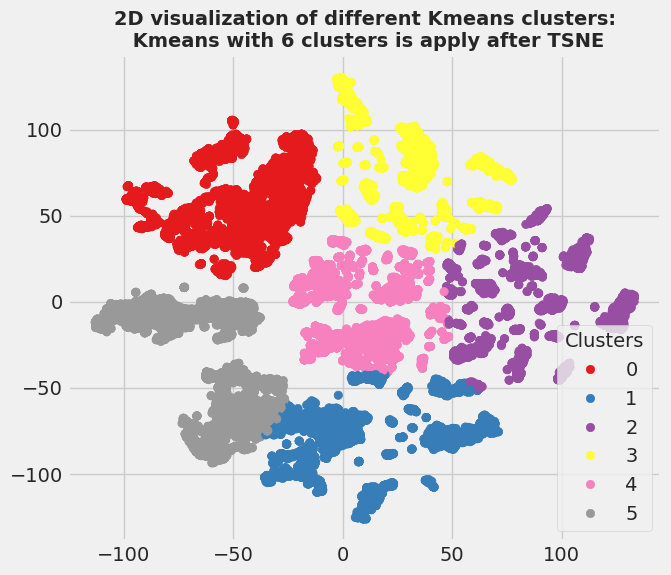

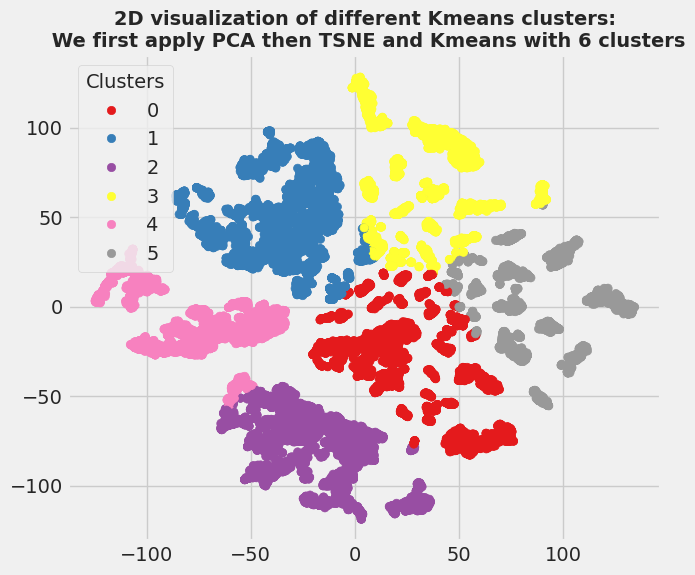

In [25]:
df_tsne_6cls, labels_tsne_6cls, df_pca_tsne_6cls, labels_pca_tsne_6cls = TSNE_Kmean(df_without_stats__encode_scaled, num_clusters=6)

### Testing

## Only use recent information

In [35]:
cols_old = ['max_stable_nightlights_25km_year1992',
            'mean_population_density_250m_year1990', 
            'mean_population_density_5km_year1990',
            'max_population_density_25km_year1990',
            'mean_nox_emissions_10km_year2000']

remove_vars = ['mean_topography_srtm_alt_90m_year1994',
               'max_population_density_25km_year2015',]

cols_recent = ['mean_topography_srtm_alt_90m_year1994',
               'mean_topography_srtm_alt_1km_year1994',
               'max_topography_srtm_relative_alt_5km_year1994',
               'min_topography_srtm_relative_alt_5km_year1994',
               'stddev_topography_srtm_relative_alt_5km_year1994',
               'climatic_zone_year2016',
               'dominant_landcover_year2012',
               'distance_to_major_road_year2020',
               'mean_stable_nightlights_1km_year2013',
               'mean_stable_nightlights_5km_year2013',
               'max_stable_nightlights_25km_year2013',
               'mean_population_density_250m_year2015',
               'mean_population_density_5km_year2015',
               'max_population_density_25km_year2015',
               'mean_nox_emissions_10km_year2015',
               'altitude']

In [36]:
df_without_stats_recent_encode = df_without_stats_encode.drop(columns=cols_old)

In [37]:
### Scale data
cols = df_without_stats_recent_encode.columns
min_max_scaler = MinMaxScaler()
df_without_stats_recent_encode_features = min_max_scaler.fit_transform(df_without_stats_recent_encode)
df_without_stats__recent_encode_scaled = pd.DataFrame(df_without_stats_recent_encode_features, columns=[cols])

In [38]:
def plot_correlation(df):
    corr = df.corr()
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask)] = True
    fig, ax = plt.subplots(figsize=(22,14))
    ax = sns.heatmap(corr, annot=True, fmt=".3f", annot_kws={'size':9}, 
                     mask=mask, center=0, cmap="coolwarm")
    plt.title("Linear correlation heatmap")
    plt.show()

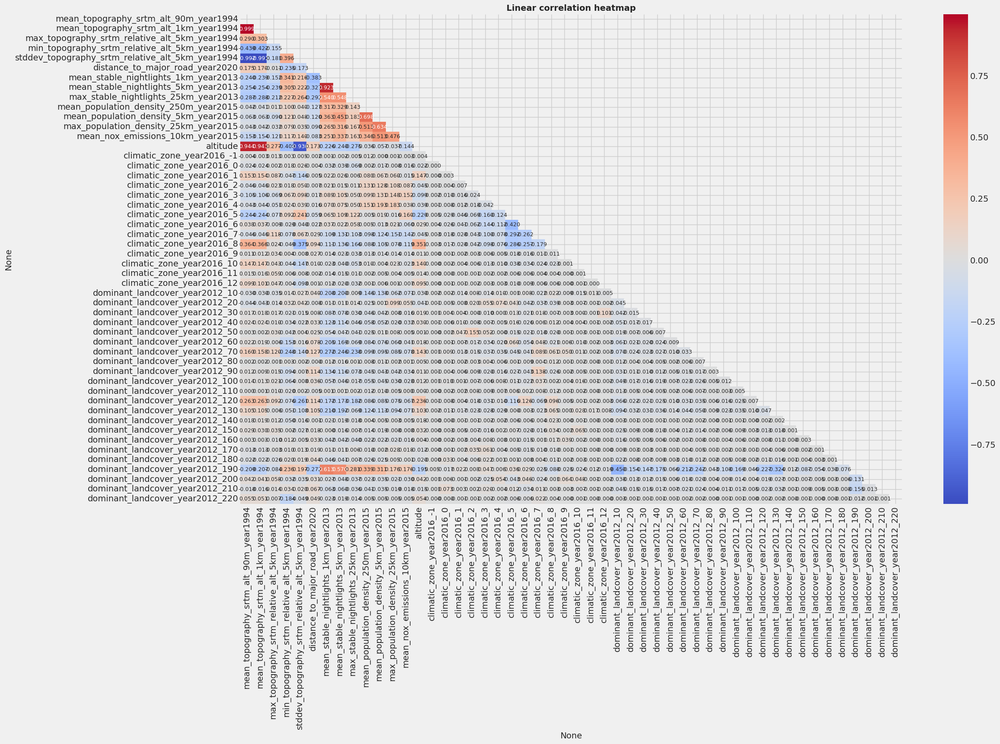

In [39]:
plot_correlation(df_without_stats__recent_encode_scaled)

In [32]:
#TSNE_Kmean(df_without_stats__recent_encode_scaled)

Original shape: (22383, 50)
Shape after PCA: (22383, 25)
KL divergence before PCA:  0.7731289267539978
KL diversgence after PCA:  0.7160643935203552



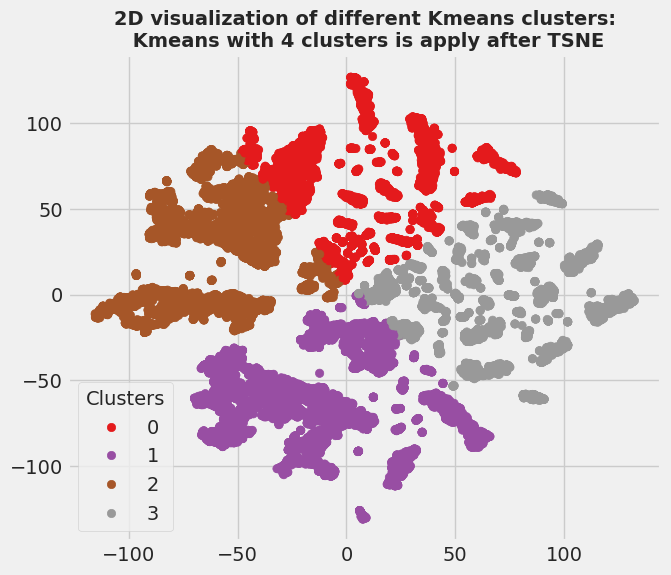

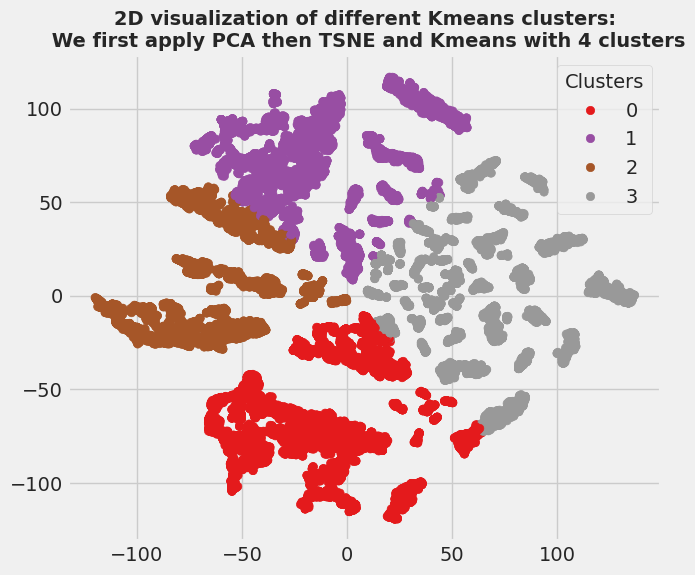

In [40]:
df_tsne_recent, labels_tsne_recent, df_pca_tsne_recent, labels_pca_tsne_recent = TSNE_Kmean(df_without_stats__recent_encode_scaled)

Original shape: (22383, 50)
Shape after PCA: (22383, 25)
KL divergence before PCA:  0.7731289267539978
KL diversgence after PCA:  0.7160643935203552



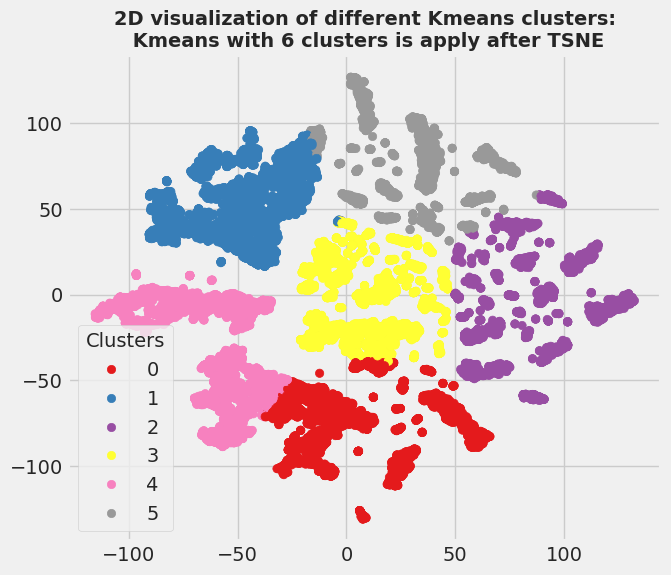

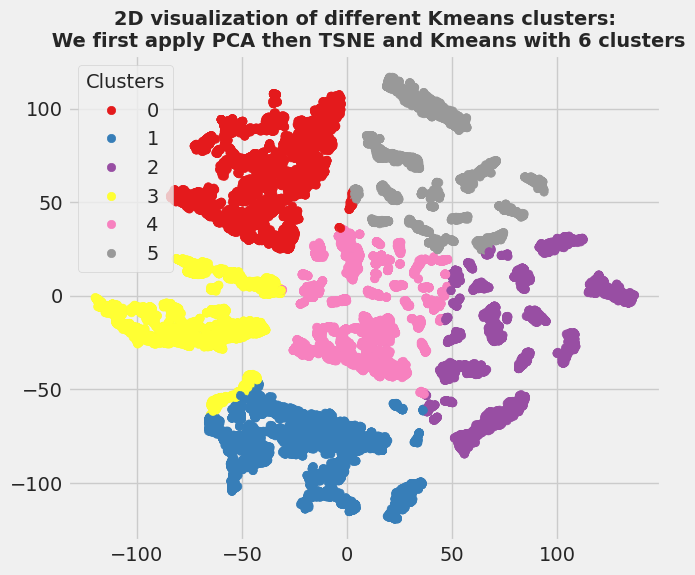

In [41]:
df_tsne_6cls, labels_tsne_6cls, df_pca_tsne_6cls, labels_pca_tsne_recent_6cls = TSNE_Kmean(df_without_stats__recent_encode_scaled, num_clusters=6)

## Use evolution rate

In [42]:
def evolution_rate(df):
    df['mean_nox_emissions_rate_10km_year2000_2015'] = (df['mean_nox_emissions_10km_year2015']-df['mean_nox_emissions_10km_year2000'])/(2015-2000)
    df['mean_population_density_rate_250m_year1990_2015'] = (df['mean_population_density_250m_year2015']-df['mean_population_density_250m_year1990'])/(2015-1990)
    df['mean_population_density_rate_5km_year1990_2015'] = (df['mean_population_density_5km_year2015']-df['mean_population_density_5km_year1990'])/(2015-1990)
    df['max_population_density_rate_25km_year1990_2015'] = (df['max_population_density_25km_year2015']-df['max_population_density_25km_year1990'])/(2015-1990)
    df['max_stable_nightlights_rate_25km_year2013_1992'] = (df['max_stable_nightlights_25km_year2013']-df['max_stable_nightlights_25km_year1992'])/(2013-1992)
    df = df.drop(columns=['mean_nox_emissions_10km_year2015',
                         'mean_nox_emissions_10km_year2000',
                         'mean_population_density_250m_year2015',
                         'mean_population_density_250m_year1990',
                         'mean_population_density_5km_year2015',
                         'mean_population_density_5km_year1990',
                         'max_population_density_25km_year2015',
                         'max_population_density_25km_year1990',
                         'max_stable_nightlights_25km_year2013',
                         'max_stable_nightlights_25km_year1992'])
    return df

In [43]:
df_without_stats_evol_rate_encode = evolution_rate(df_without_stats_encode)

In [44]:
### Scale data
cols = df_without_stats_evol_rate_encode.columns
min_max_scaler = MinMaxScaler()
df_without_stats_evol_rate_encode_features = min_max_scaler.fit_transform(df_without_stats_evol_rate_encode)
df_without_stats_evol_rate_encode_scaled = pd.DataFrame(df_without_stats_evol_rate_encode_features, columns=[cols])

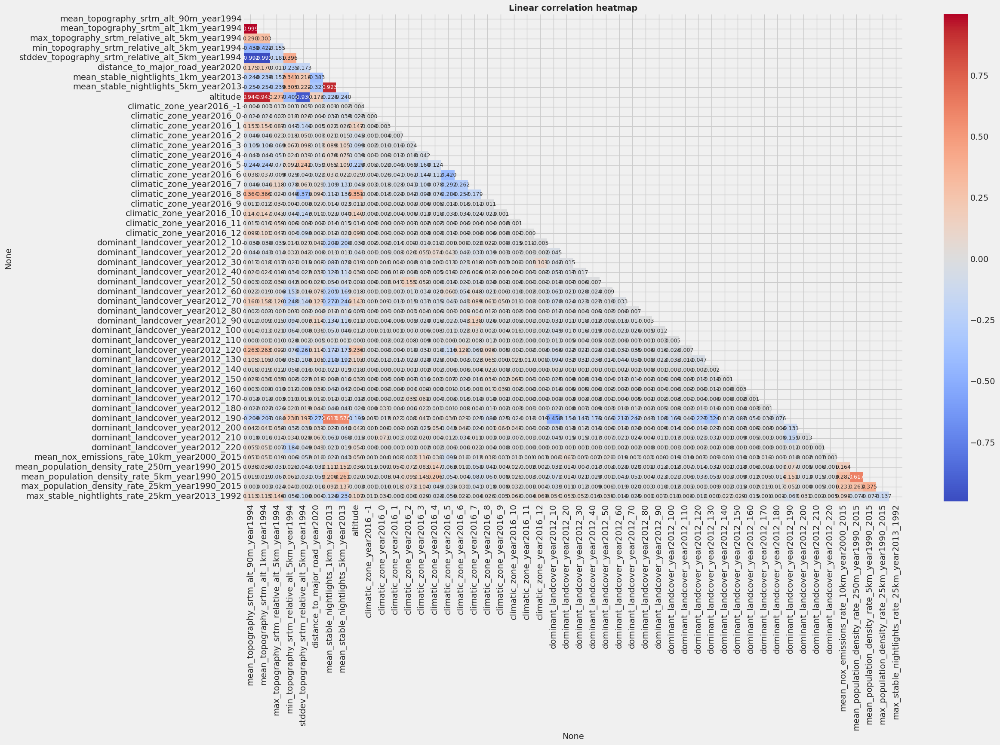

In [45]:
plot_correlation(df_without_stats_evol_rate_encode_scaled)

Original shape: (22383, 50)
Shape after PCA: (22383, 23)
KL divergence before PCA:  0.7695897221565247
KL diversgence after PCA:  0.7012712955474854



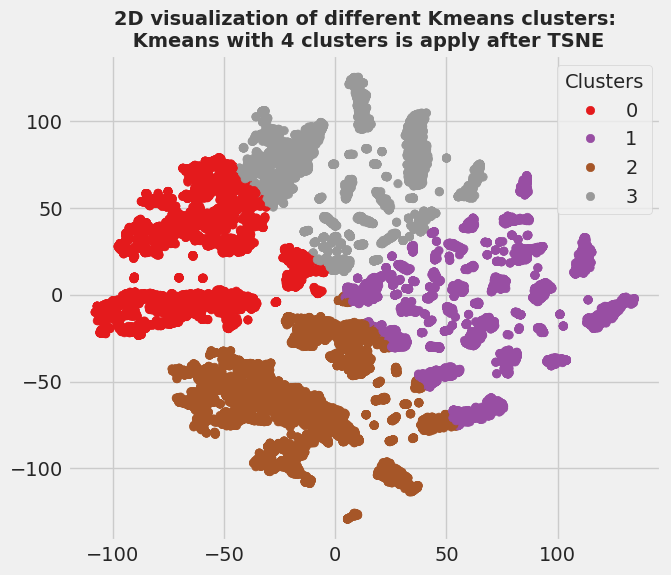

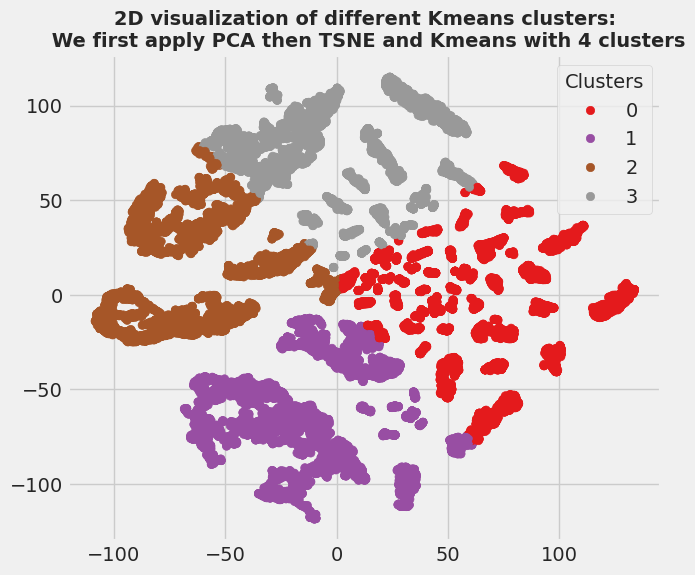

In [50]:
df_tsne_evol_rate, labels_tsne_evol_rate, df_pca_tsne_evol_rate, labels_pca_tsne_evol_rate = TSNE_Kmean(df_without_stats_evol_rate_encode_scaled)

In [32]:
#df_tsne_evol_rate_6cls, labels_tsne_evol_rate_6cls, df_pca_tsne_evol_rate_6cls, labels_pca_tsne_evol_rate_6cls = TSNE_Kmean(df_without_stats_evol_rate_encode_scaled, num_clusters=6)

In [227]:
#pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)

In [11]:
def get_vars_stat_data(Vars, Stats, file_name='stationglobalmeta_extend.csv'):
    """Variable are: pm2p5 and no2
       Statistics are:  p95, p90, p75 and median
    """
    var_stats = []
    all_var_stats = ['pm2p5_p95', 'pm2p5_p90', 'pm2p5_p75', 'pm2p5_median','no2_p95', 'no2_p90', 'no2_p75', 'no2_median']
    df = pd.read_csv(file_name)
    for var, stat in product(Vars, Stats):
        var_stats.append(f"{var}_{stat}")
    drop_var_stats = list(set(all_var_stats) - set(var_stats))
    df.drop(columns=drop_var_stats, axis=1, inplace=True)
    df = df.drop_duplicates()
    return df

def get_data_where_var_stat_notnull(df, Var, Stat):
    var_stat = f'{Var}_{Stat}'
    df_var_stat =  df.dropna(subset=[var_stat])
    df_var_stat = df_var_stat[df_var_stat[var_stat]>=0]
    return df_var_stat

def get_data_where_var_stat_null(df, Var, Stat):
    var_stat = f'{Var}_{Stat}'
    df_var_stat_nan =  df.loc[df[var_stat].isnull()]
    return df_var_stat_nan

#### Read data for given variables and statistics

In [230]:
#get pm2p5 data
df_pm2p5_p95 = get_vars_stat_data(['pm2p5'], ['p95'])
df_pm2p5_p90 = get_vars_stat_data(['pm2p5'], ['p90'])
df_pm2p5_p75 = get_vars_stat_data(['pm2p5'], ['p75'])
df_pm2p5_median = get_vars_stat_data(['pm2p5'], ['median'])
#get no2 data
df_no2_p95 = get_vars_stat_data(['no2'], ['p95'])
df_no2_p90 = get_vars_stat_data(['no2'], ['p90'])
df_no2_p75 = get_vars_stat_data(['no2'], ['p75'])
df_no2_median = get_vars_stat_data(['no2'], ['median'])

In [206]:
datasets = {'df_pm2p5_p95':   {'data': df_pm2p5_p95, 'var_stats':['pm2p5', 'p95']},
            'df_pm2p5_p90':   {'data': df_pm2p5_p90, 'var_stats':['pm2p5', 'p90']},
            'df_pm2p5_p75':   {'data': df_pm2p5_p75, 'var_stats': ['pm2p5', 'p75']},
            'df_pm2p5_median': {'data': df_pm2p5_median, 'var_stats': ['pm2p5','median']},
            'df_no2_p95':      {'data': df_no2_p95,  'var_stats': ['no2', 'p95']},
            'df_no2_p90':      {'data': df_no2_p90,  'var_stats': ['no2', 'p90']},
            'df_no2_p75':      {'data': df_no2_p75, 'var_stats': ['no2', 'p75']},
            'df_no2_median':   {'data': df_no2_median, 'var_stats': ['no2', 'median']}}

#### Data cleaning

In [207]:
columns_to_control_nan = ['mean_topography_srtm_alt_90m_year1994',
                          'mean_topography_srtm_alt_1km_year1994',
                          'max_topography_srtm_relative_alt_5km_year1994',
                          'min_topography_srtm_relative_alt_5km_year1994',
                          'stddev_topography_srtm_relative_alt_5km_year1994',
                          'mean_nox_emissions_10km_year2015',
                          'mean_nox_emissions_10km_year2000']# drop row if all these columns are nan

categorical_variables = ['climatic_zone_year2016',
                         'dominant_landcover_year2012']

numerical_variables = ['altitude',
                       'mean_topography_srtm_alt_90m_year1994',
                       'mean_topography_srtm_alt_1km_year1994',
                       'max_topography_srtm_relative_alt_5km_year1994',
                       'min_topography_srtm_relative_alt_5km_year1994',
                        'stddev_topography_srtm_relative_alt_5km_year1994',
                        'distance_to_major_road_year2020',
                       'max_stable_nightlights_25km_year2013',
                        'max_stable_nightlights_25km_year1992',
                        'mean_stable_nightlights_1km_year2013',
                        'mean_stable_nightlights_5km_year2013',
                        'mean_population_density_250m_year2015',
                        'mean_population_density_5km_year2015',
                        'max_population_density_25km_year2015',
                        'mean_population_density_250m_year1990',
                        'mean_population_density_5km_year1990',
                        'max_population_density_25km_year1990',
                        'mean_nox_emissions_10km_year2015',
                        'mean_nox_emissions_10km_year2000',
                       'pm2p5_p']

In [209]:
def data_cleaning(df, Var, Stat, save_drop_duplicate=True):
    df_duplicate = None
    df_cleaned = get_data_where_var_stat_notnull(df, Var, Stat)
    if 'lat' in list(df_cleaned.columns) and 'lon' in list(df_cleaned.columns):
        df_cleaned.set_index(['lat', 'lon'], inplace=True)
    else:
        df_cleaned.index = range(len(df_cleaned))
    
    if save_drop_duplicate:
        subset_for_drop_duplicate = list(df_cleaned.columns)
        subset_for_drop_duplicate.remove(f'{Var}_{Stat}')

        df_duplicate = df_cleaned[df_cleaned.duplicated(keep=False, subset=subset_for_drop_duplicate)]
        df_cleaned = df_cleaned.sort_values(by=f'{Var}_{Stat}', ascending=False)
        df_cleaned = df_cleaned.drop_duplicates(subset=subset_for_drop_duplicate, keep=False)
        df_cleaned = shuffle(df_cleaned)
        
    df_cleaned[columns_to_control_nan] = df_cleaned[columns_to_control_nan].replace(-9999, np.nan)
    df_cleaned[columns_to_control_nan] = df_cleaned[columns_to_control_nan].replace(-1, np.nan)
    df_cleaned = df_cleaned.dropna(subset=columns_to_control_nan)
    
    df_cleaned['altitude'] = df_cleaned['altitude'].fillna(df_cleaned['mean_topography_srtm_alt_90m_year1994'])
    
    df_cleaned['distance_to_major_road_year2020'].fillna(df_cleaned['distance_to_major_road_year2020'].mean(), inplace=True)
    
    return df_duplicate, df_cleaned

**Apply the first round cleaning step**

In [195]:
# datasets_cleaned1 = datasets
# datasets_duplcate = datasets
# for df_name, data_var_stat in datasets_cleaned1.items():
#     Var = data_var_stat['var_stats'][0]
#     stat = data_var_stat['var_stats'][1]
#     df = data_var_stat['data']
#     df_cleaned, df_duplicate = data_cleaning(df, Var, stat)
#     data_var_stat['data']=df_cleaned
#     datasets_duplcate[df_name]['data'] = df_duplicate

In [188]:
df_pm2p5_p95_duplicate, df_pm2p5_p95_cleaned1 = data_cleaning(df_pm2p5_p95, 'pm2p5', 'p95')
df_pm2p5_p90_duplicate, df_pm2p5_p90_cleaned1 = data_cleaning(df_pm2p5_p90, 'pm2p5', 'p90')
df_pm2p5_p975_duplicate, df_pm2p5_p75_cleaned1 = data_cleaning(df_pm2p5_p75, 'pm2p5', 'p75')
df_pm2p5_median_duplicate, df_pm2p5_median_cleaned1 = data_cleaning(df_pm2p5_median, 'pm2p5', 'median')
df_no2_p95_duplicate, df_no2_p95_cleaned1 = data_cleaning(df_no2_p95, 'no2', 'p95')
df_no2_p90_duplicate, df_no2_p90_cleaned1 = data_cleaning(df_no2_p90, 'no2', 'p90')
df_no2_p975_duplicate, df_no2_p75_cleaned1 = data_cleaning(df_no2_p75, 'no2', 'p75')
df_no2_median_duplicate, df_no2_median_cleaned1 = data_cleaning(df_no2_median, 'no2', 'median')

In [154]:
indeces = [(48.2263608328,16.458345),(46.6255599994641, 14.31806),(51.9142,  4.47992)]
#df1[df1.index.isin(indeces)]

In [155]:
#df_pm2p5_p95_cleaned1.head(8).T

In [156]:
#list(df_pm2p5_p95_cleaned1.columns)

In [159]:
#df_pm2p5_p95_cleaned1[numerical_variables].describe().T

#### Visualization and analysis

In [212]:
def histplot_categorical(df, cat_variables):
    for feature in cat_variables:
        ax, fig = plt.subplots(figsize=(10,5)) 
        ax = sns.countplot(y=feature, data=df, order=df[feature].value_counts(ascending=False).index)
        ax.set_title(feature,size =10)
        plt.show()
    return

In [161]:
#histplot_categorical(df_pm2p5_p95_cleaned1, categorical_variables)

## Feature engineering

In [216]:
def evolution_rate(df):
    df['mean_nox_emissions_rate_10km_year2000_2015'] = (df['mean_nox_emissions_10km_year2015']-df['mean_nox_emissions_10km_year2000'])/(2015-2000)
    df['mean_population_density_rate_250m_year1990_2015'] = (df['mean_population_density_250m_year2015']-df['mean_population_density_250m_year1990'])/(2015-1990)
    df['mean_population_density_rate_5km_year1990_2015'] = (df['mean_population_density_5km_year2015']-df['mean_population_density_5km_year1990'])/(2015-1990)
    df['max_population_density_rate_25km_year1990_2015'] = (df['max_population_density_25km_year2015']-df['max_population_density_25km_year1990'])/(2015-1990)
    df['max_stable_nightlights_rate_25km_year2013_1992'] = (df['max_stable_nightlights_25km_year2013']-df['max_stable_nightlights_25km_year1992'])/(2013-1992)
    df = df.drop(columns=['mean_nox_emissions_10km_year2015',
                         'mean_nox_emissions_10km_year2000',
                         'mean_population_density_250m_year2015',
                         'mean_population_density_250m_year1990',
                         'mean_population_density_5km_year2015',
                         'mean_population_density_5km_year1990',
                         'max_population_density_25km_year2015',
                         'max_population_density_25km_year1990',
                         'max_stable_nightlights_25km_year2013',
                         'max_stable_nightlights_25km_year1992'])
    return df

def drop_old_data(df):
    df = df.drop(columns = cols_old)
    return df

In [217]:
#df_pm2p5_p95_cleaned1['dominant_landcover_year2012'].value_counts()

In [219]:
df_pm2p5_p95_cleaned = groupe_landcover_cat(df_pm2p5_p95_cleaned1)

In [220]:
#df_pm2p5_p95_cleaned['climatic_zone_year2016'].value_counts()

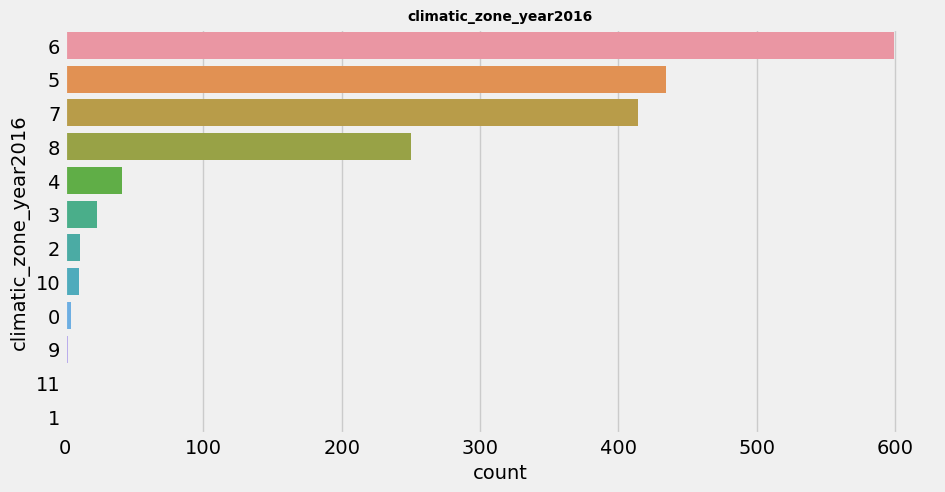

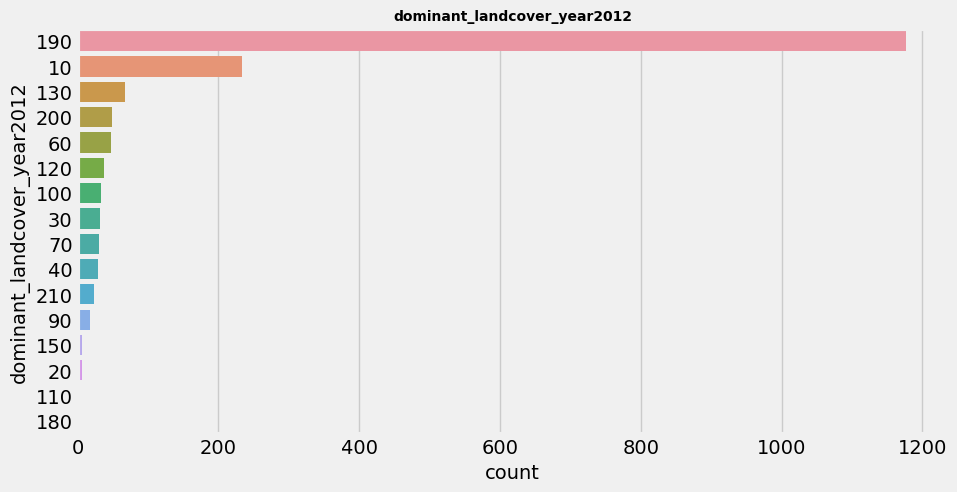

In [221]:
histplot_categorical(groupe_landcover_cat(df_pm2p5_p95_cleaned1), categorical_variables)

In [168]:
# cols_to_drop = ['mean_topography_srtm_alt_90m_year1994',
#                 'mean_nox_emissions_10km_year2000',
#                 'max_stable_nightlights_25km_year1992',
#                 'mean_population_density_250m_year1990',
#                 'mean_population_density_5km_year1990',
#                 'max_population_density_25km_year1990',
#                 'mean_nox_emissions_10km_year2000',
#                 'mean_stable_nightlights_1km_year2013']

In [178]:
datasets = {'df_pm2p5_p95':   {'data': df_pm2p5_p95_cleaned1, 'var_stats':['pm2p5', 'p95']},
            'df_pm2p5_p90':   {'data': df_pm2p5_p90_cleaned1, 'var_stats':['pm2p5', 'p90']},
            'df_pm2p5_p75':   {'data': df_pm2p5_p75_cleaned1, 'var_stats': ['pm2p5', 'p75']},
           'df_pm2p5_median': {'data': df_pm2p5_median_cleaned1, 'var_stats': ['pm2p5','median']},
           'df_no2_p95':      {'data': df_no2_p95_cleaned1,  'var_stats': ['no2', 'p95']},
           'df_no2_p90':      {'data': df_no2_p90_cleaned1,  'var_stats': ['no2', 'p90']},
           'df_no2_p75':      {'data': df_no2_p75_cleaned1, 'var_stats': ['no2', 'p75']},
           'df_no2_median':   {'data': df_no2_median_cleaned1, 'var_stats': ['no2', 'median']}}

In [175]:
datasets_encode = datasets
for df_name, data_var_stat in datasets_encode:
    Var = data_var_stat['var_stats'][0]
    Stat = data_var_stat['var_stats'][1]
    data_var_stat['data'] = encode_categorical_variables(df['data'], Var, Stat)

In [136]:
# df_pm2p5_p95_cleaned = encode_categorical_variables(df_pm2p5_p95_cleaned1, 'pm2p5', 'p95')
# df_pm2p5_p90_cleaned = encode_categorical_variables(df_pm2p5_p90_cleaned1, 'pm2p5', 'p90')
# df_pm2p5_p75_cleaned = encode_categorical_variables(df_pm2p5_p75_cleaned1, 'pm2p5', 'p75')
# df_pm2p5_median_cleaned = encode_categorical_variables(df_pm2p5_median_cleaned1,'pm2p5','median')

# df_no2_p95_cleaned = encode_categorical_variables(df_no2_p95_cleaned1, 'no2', 'p95')
# df_no2_p90_cleaned = encode_categorical_variables(df_no2_p90_cleaned1, 'no2', 'p90')
# df_no2_p75_cleaned = encode_categorical_variables(df_no2_p75_cleaned1, 'no2', 'p75')
# df_no2_median_cleaned = encode_categorical_variables(df_no2_median_cleaned1, 'no2', 'median')

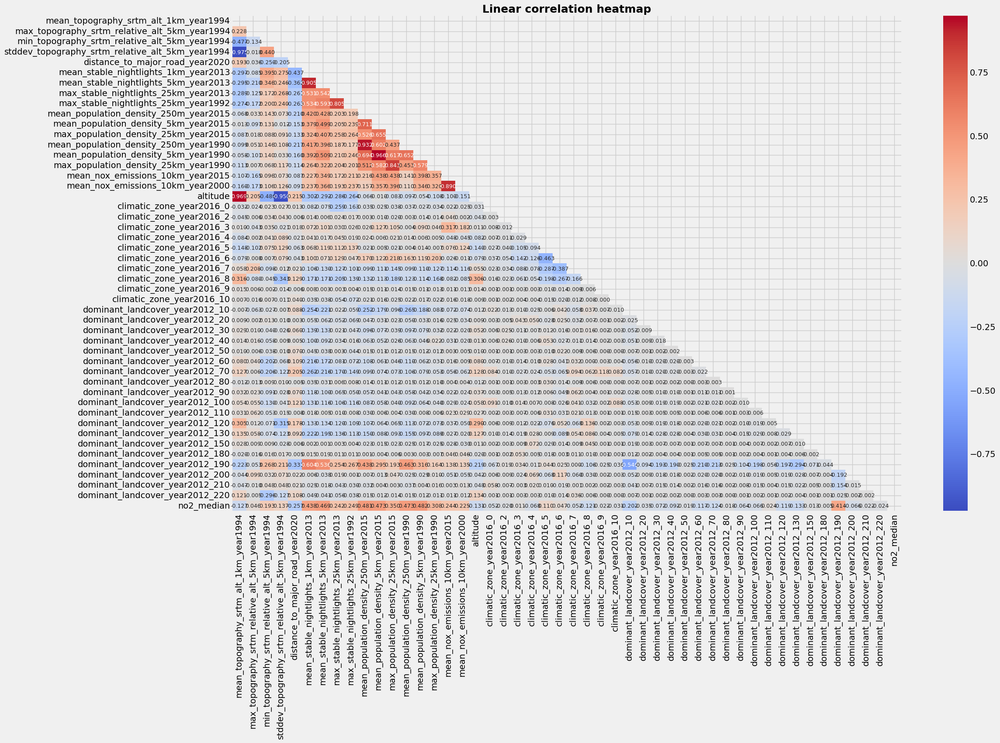

In [28]:
corr = df_no2_median_cleaned.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
fig, ax = plt.subplots(figsize=(22,14))
ax = sns.heatmap(corr, annot=True, fmt=".3f", annot_kws={'size':9}, 
                 mask=mask, center=0, cmap="coolwarm")
plt.title("Linear correlation heatmap")
plt.show()

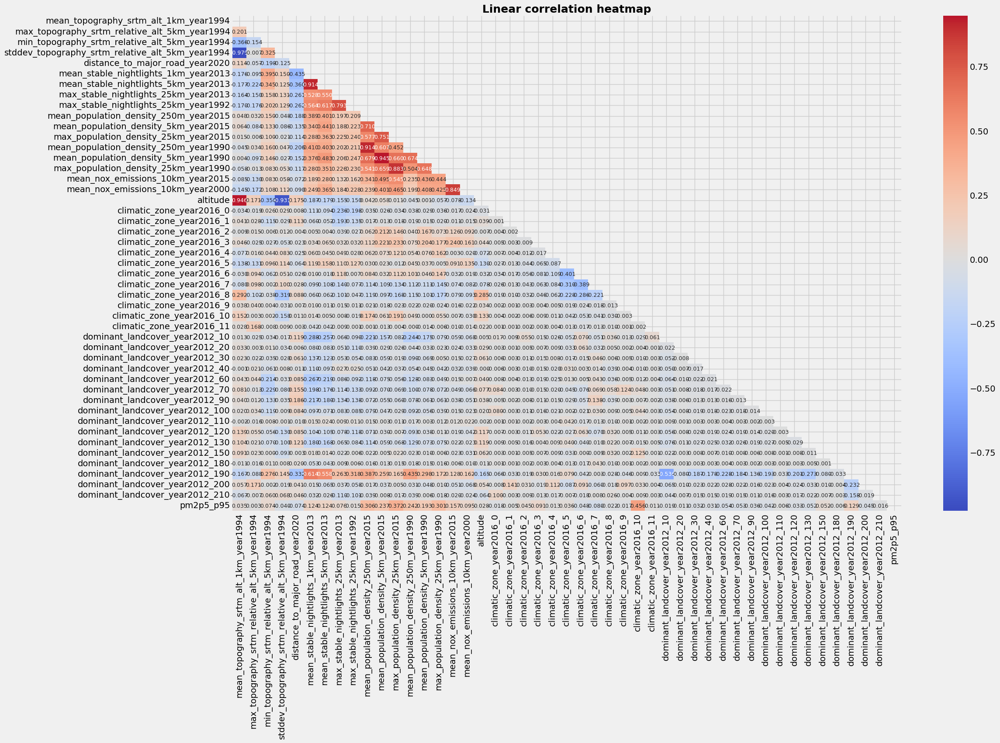

In [29]:
corr = df_pm2p5_p95_cleaned.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
fig, ax = plt.subplots(figsize=(22,14))
ax = sns.heatmap(corr, annot=True, fmt=".3f", annot_kws={'size':9}, 
                 mask=mask, center=0, cmap="coolwarm")
plt.title("Linear correlation heatmap")
plt.show()

In [30]:
def dist_plot(df, var):
    sns.displot(df[var], kde=True, height=4, aspect=2.5)
    plt.title(f'Distribution of {var}', fontsize=10)
    return 

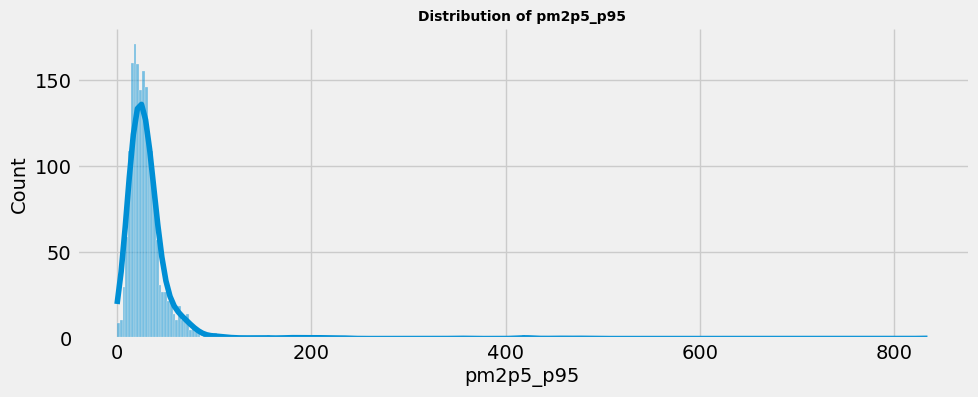

In [31]:
dist_plot(df_pm2p5_p95_cleaned, 'pm2p5_p95')

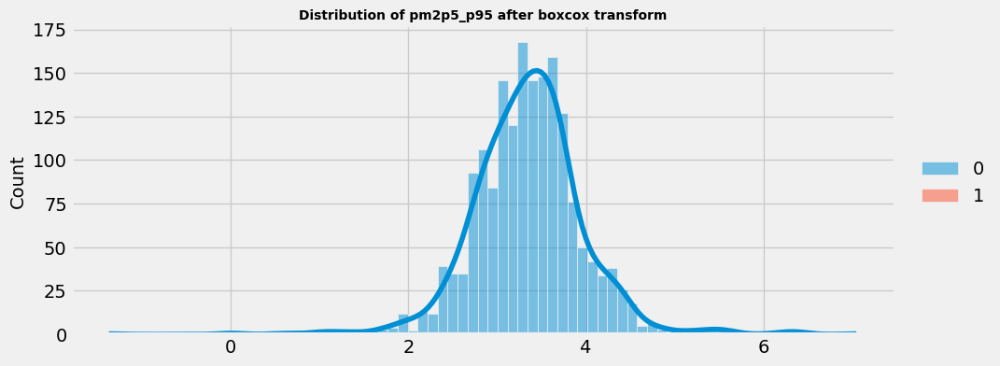

In [32]:
sns.displot(stats.boxcox(df_pm2p5_p95_cleaned['pm2p5_p95']), kde=True, height=4, aspect=2.5)
plt.title('Distribution of pm2p5_p95 after boxcox transform', fontsize=10)
plt.show()

centre the dist of the Box Cox transf

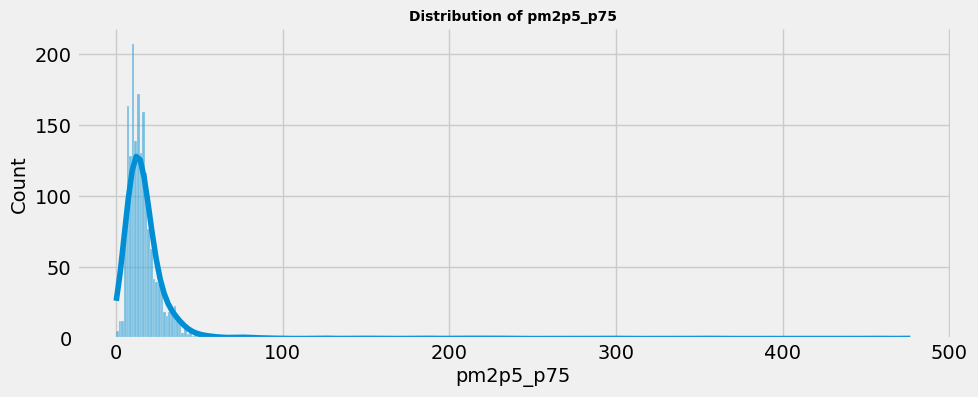

In [234]:
dist_plot(df_pm2p5_p75_cleaned, 'pm2p5_p75')

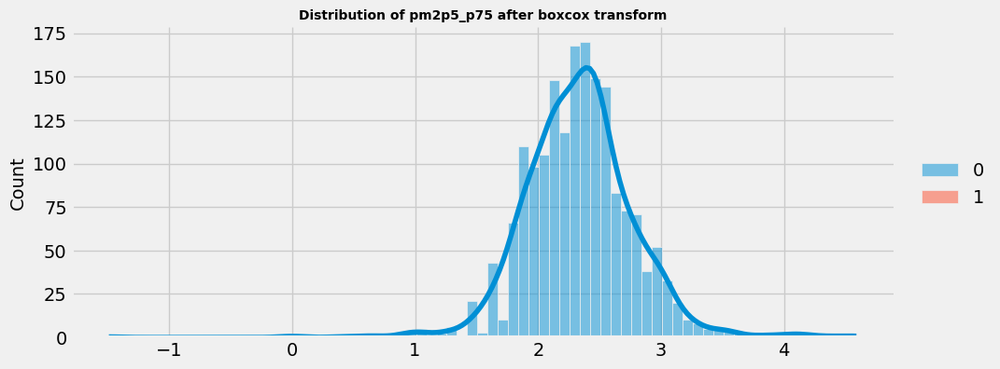

In [235]:
sns.displot(stats.boxcox(df_pm2p5_p75_cleaned['pm2p5_p75']), kde=True, height=4, aspect=2.5)
plt.title('Distribution of pm2p5_p75 after boxcox transform', fontsize=10)
plt.show()

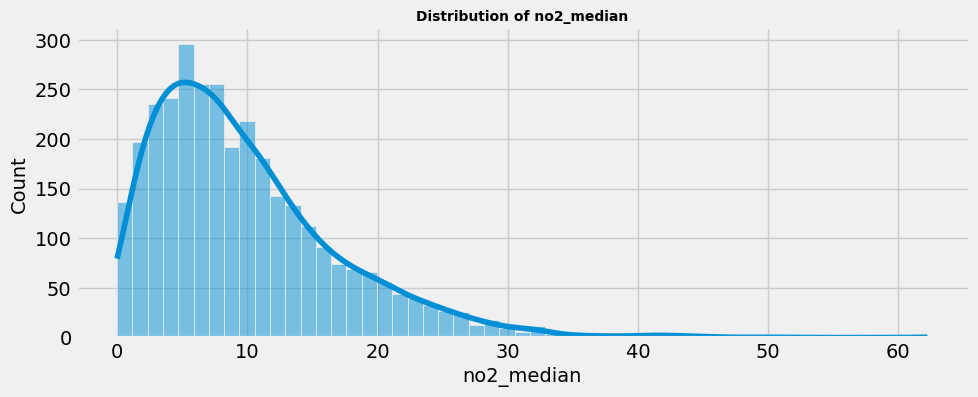

In [236]:
dist_plot(df_no2_median_cleaned,"no2_median")

Apply Box Cox or log transformation

#### Outliers

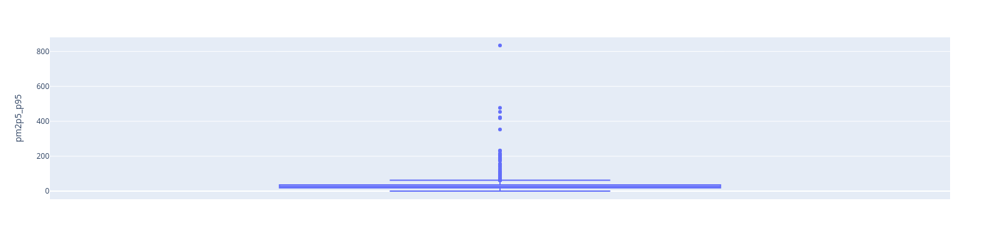

In [237]:
fig = px.box(df_pm2p5_p95_cleaned, y="pm2p5_p95", width=400, height=400)
fig.show()

set all values above 200 to 200

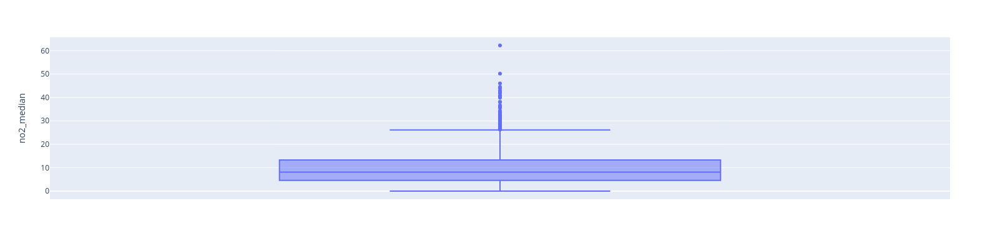

In [238]:
fig = px.box(df_no2_median_cleaned, y="no2_median", width=400, height=400)
fig.show()

In [239]:
#list(df_pm2p5_p95_cleaned.columns)

**Prepare train and test data**

In [223]:
standard_scale = StandardScaler()
robust_scale = RobustScaler()
minmax_scale = MinMaxScaler(feature_range=(0, 1))

In [241]:
def train_test_data(df, Var, Stat):
    X = df.drop(columns=f'{Var}_{Stat}')
    Y = df[f'{Var}_{Stat}']
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.20,random_state=42)
    scaler = standard_scale.fit(X_train)
    X_train = scaler.transform(X_train)
    X_test = scaler.transform(X_test)
    return (X_train, Y_train, X_test, Y_test)

def boxcox_transform(y):
    y_boxcox, lmb_func  = stats.boxcox(y)
    return y_boxcox, lmb_func

def save_model_score(Y_pred, Y_truth):
    model_score = {}
    model_score['R2_score'] = round(r2_score(Y_test,  Y_pred),3)
    model_score['MAE'] = round(mean_absolute_error(Y_test, Y_pred), 3)
    model_score['MSE'] = round((mean_squared_error(Y_test, Y_pred)), 3)
    model_score['Max_AE'] = round(np.max(np.abs(Y_test - Y_pred)), 3)
    return model_score

def feature_importance(model, features_name, plot=True):
    model_name = type(model).__name__
    if model_name == 'LinearRegression':
        importance = model.coef_
    else:
        importance = model.feature_importances_
    feature_rank = pd.DataFrame({'feature': features_name,
                                 'importance': importance})
    feature_rank = feature_rank.sort_values('importance', ascending=False)
    
    features = feature_rank['feature'].to_list()
    important_features = features[:]
    if plot:
        plt.figure(figsize=(12, 14))
        sns.barplot(y='feature', x='importance', data=feature_rank)
        plt.title(f"feature importance for {model_name}", size=10)
        plt.show()
    return important_features

In [242]:
models = {'RandomForest_reg': RandomForestRegressor(),
         'CatBoost_reg': CatBoostRegressor(verbose=False),
         'Xgboost_reg': XGBRegressor(),
         'LGBM_reg': LGBMRegressor()}

In [243]:
def train(models:dict, df, Var, Stat, boxcox_transform=False):
    prediction_score = {}
    model_predict = {}
    boxcox_func = None
    X = df.drop(columns=[f'{Var}_{Stat}'])
    Y = df[f'{Var}_{Stat}']
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.10, random_state=42)
    scaler = standard_scale.fit(X_train)
    X_train = scaler.transform(X_train)
    X_test = scaler.transform(X_test)
    if boxcox_transform:
        Y_train, lmb  = stats.boxcox(Y_train)
        boxcox_func = lmb
    for name, model in models.items():
        model_score = {}
        model.fit(X_train, Y_train)
        Y_pred = inv_boxcox(model.predict(X_test), boxcox_func) if boxcox_transform else model.predict(X_test)
        model_predict[f'{Var}_{Stat}_{name}'] = Y_pred
        model_score['R2_score'] = round(r2_score(Y_test,  Y_pred),4)
        model_score['MAE'] = round(mean_absolute_error(Y_test, Y_pred), 4)
        model_score['MSE'] = round((mean_squared_error(Y_test, Y_pred)), 4)
        model_score['Max_AE'] = round(np.max(np.abs(Y_test-Y_pred)), 4)
        prediction_score[f'{name}'] = model_score
        models[name] = model
        if name == 'Linear_reg':
            importance = model.coef_
        else:
            importance = model.feature_importances_
        feature_rank = pd.DataFrame( {'feature': X.columns,
                                      'importance': importance } )
        feature_rank = feature_rank.sort_values('importance', ascending =False)
        plt.figure(figsize=(12, 14))
        sns.barplot( y = 'feature', x = 'importance', data = feature_rank)
        plt.title(f"feature importance for {name}",size =10 )
        plt.show()
        
    model_predict[f'{Var}_{Stat}_Truth'] = Y_test
    df_model_predictions = pd.DataFrame(model_predict)
    df_model_score = pd.DataFrame(prediction_score)
    return df_model_predictions, df_model_score, scaler, models, lmb

def train_with_important_features(models:dict, df, Var, Stat, boxcox_transform=False,
                                 top_feature=40):
    
    prediction_score = {}
    model_predict = {}
    boxcox_func = None
    for name, model_feature in models.items():
        features = model_feature['features']
        model = model_feature['model']
        X = df.drop(columns=[f'{Var}_{Stat}'])
#     Y = df[f'{Var}_{Stat}']
#     X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.10, random_state=42)
#     scaler = standard_scale.fit(X_train)
#     X_train = scaler.transform(X_train)
#     X_test = scaler.transform(X_test)
    

def predict(models, X_test, Y_test=None):
    pass

In [296]:
df_pm2p5_p95_cleaned = feature_engineering(df_pm2p5_p95_cleaned1, 'pm2p5', 'p95')

In [278]:
#df_pm2p5_p95_cleaned.info()

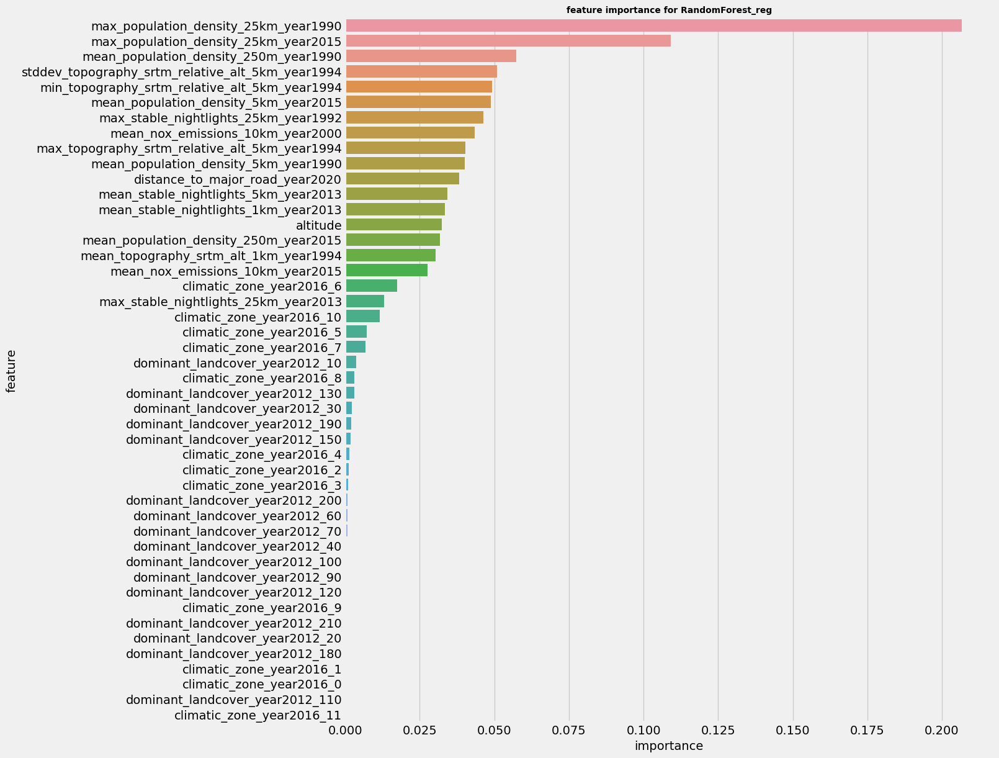

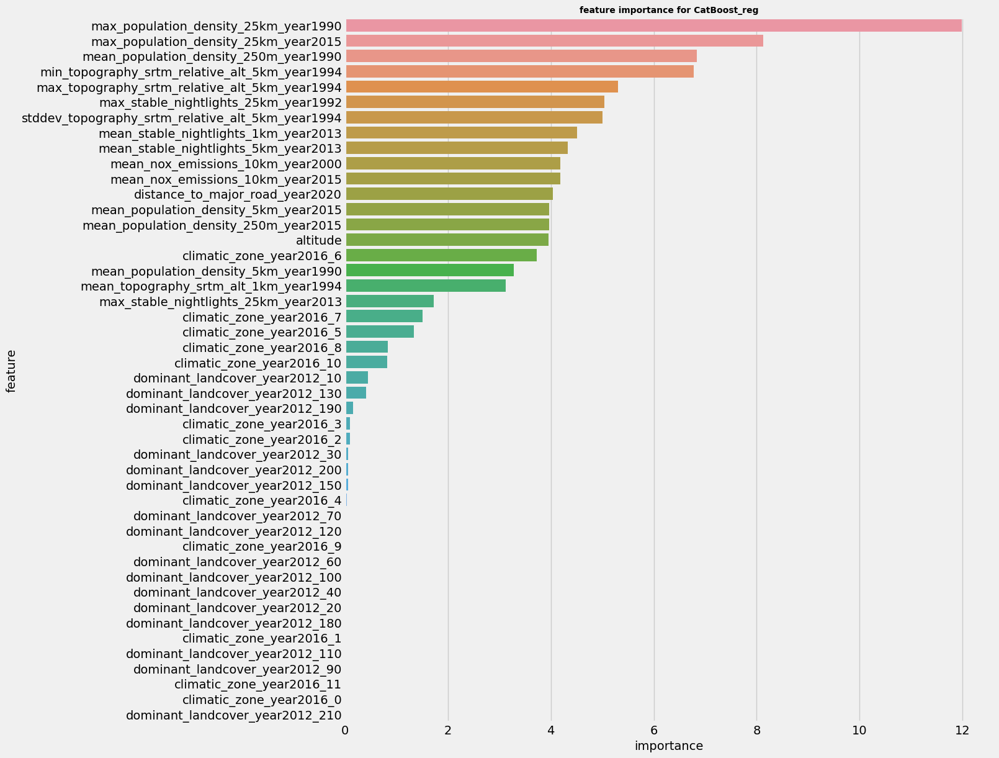

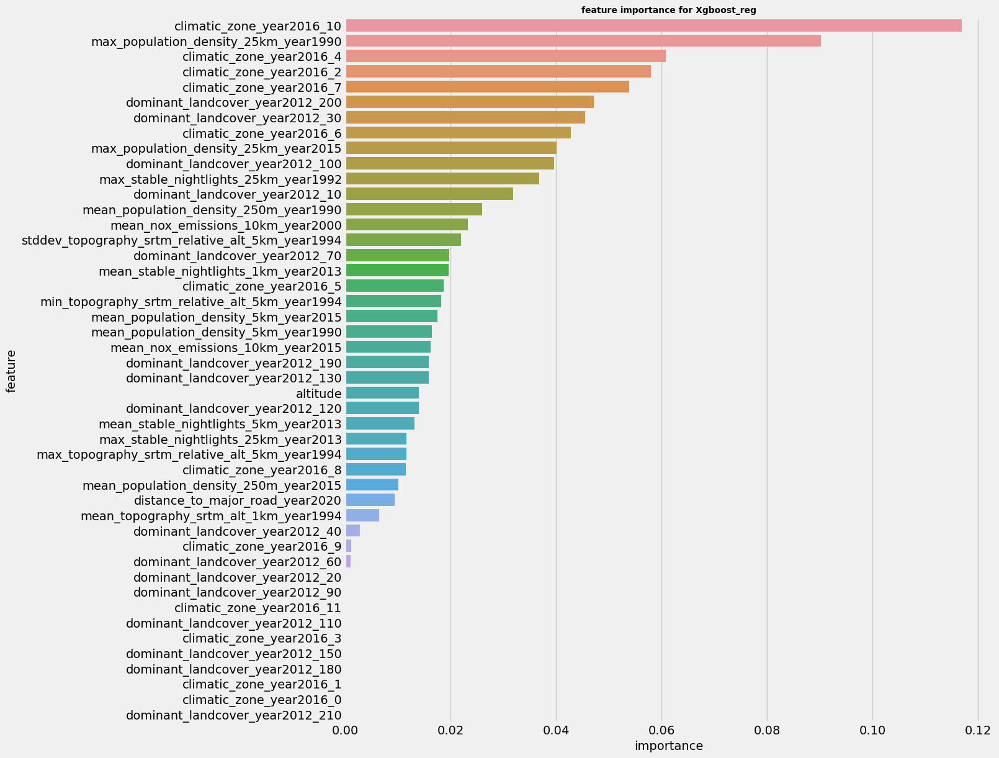

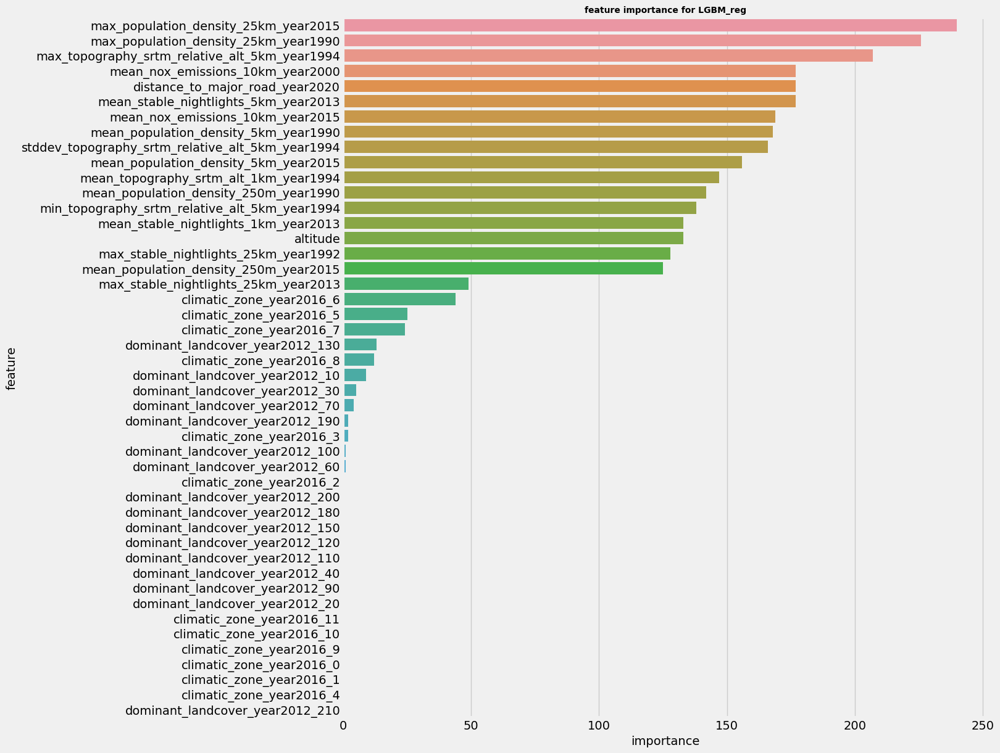

In [281]:
df_model_predictions_pm2p5_p95, df_model_score_pm2p5_p95, scaler_pm2p5_p95, trainned_models_pm2p5_p95, lmb_pm2p5_p95 = train(models, df_pm2p5_p95_cleaned, 'pm2p5', 'p95', boxcox_transform=True)

In [282]:
df_model_score_pm2p5_p95

,RandomForest_reg,CatBoost_reg,Xgboost_reg,LGBM_reg
R2_score,0.4322,0.4104,0.4291,0.2673
MAE,15.8001,14.8713,15.3496,16.1566
MSE,2806.8168,2914.6098,2822.0237,3621.8290
Max_AE,614.1483,628.1940,620.8460,707.0839


In [283]:
df_model_predictions_pm2p5_p95.head(50)

,,pm2p5_p95_RandomForest_reg,pm2p5_p95_CatBoost_reg,pm2p5_p95_Xgboost_reg,pm2p5_p95_LGBM_reg,pm2p5_p95_Truth
lat,lon,,,,,
38.102507,-122.237976,24.177398,22.749294,16.456001,23.096752,28.000000
54.599650,-5.928833,19.975689,20.291112,24.532848,19.788380,26.600000
36.962300,-4.844830,16.437097,18.389201,19.316109,18.398352,19.000000
44.401860,7.814630,36.524957,39.014008,31.646685,29.685250,40.450000
47.766666,16.766666,43.507353,34.706900,44.541992,31.004111,34.920000
48.246900,-121.603100,17.555348,21.016622,20.114054,17.489783,24.895000
48.345404,9.207748,19.487618,20.013725,21.416052,19.228139,20.262681
52.294884,-1.542911,30.132639,26.040863,28.817312,23.602058,29.100000
50.303208,6.001736,21.056662,21.992714,23.229685,24.398379,22.476500


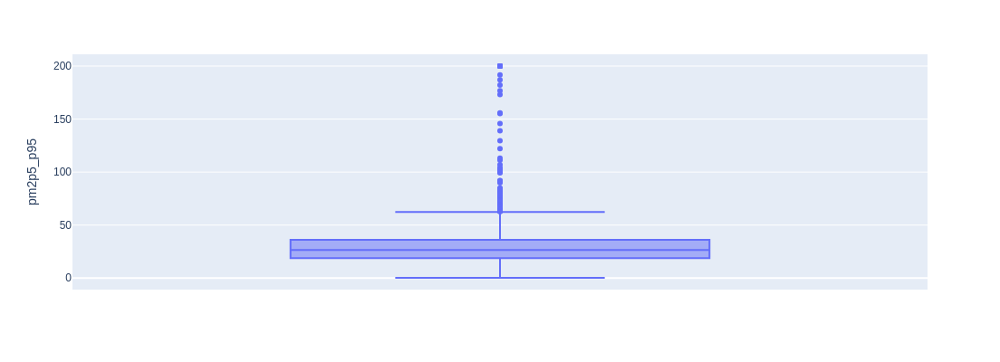

In [284]:
df_pm2p5_p95_cleaned['pm2p5_p95']  = df_pm2p5_p95_cleaned['pm2p5_p95'].where(df_pm2p5_p95_cleaned['pm2p5_p95'] <=200.0, 200.0)
fig = px.box(df_pm2p5_p95_cleaned, y="pm2p5_p95", width=400, height=400)
fig.show()

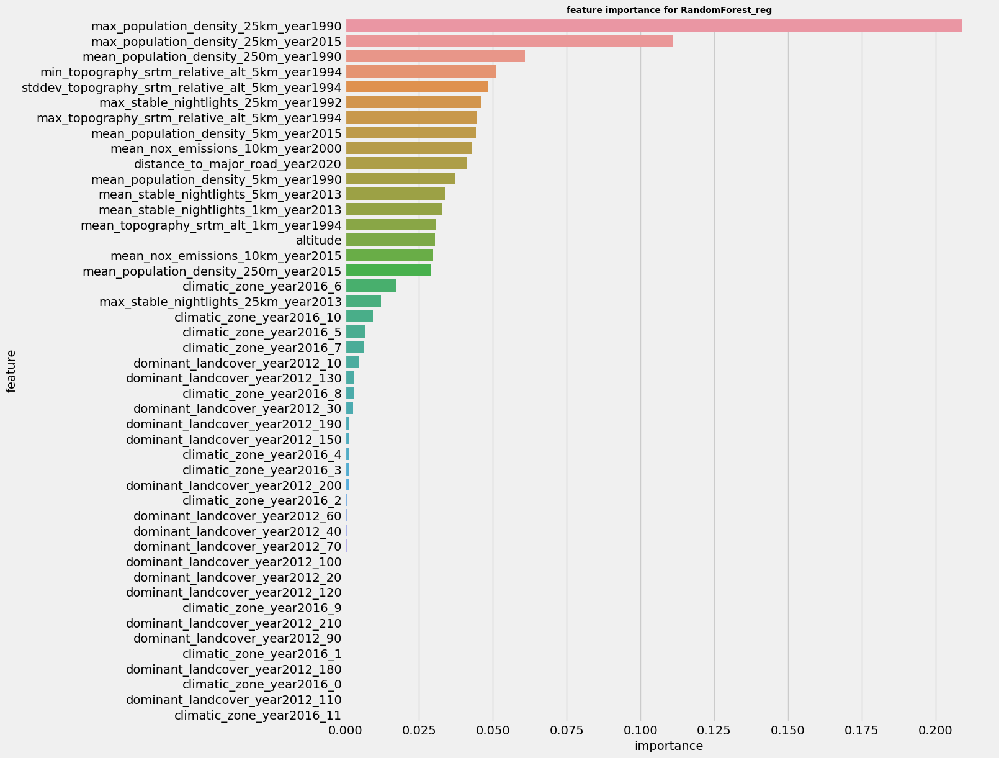

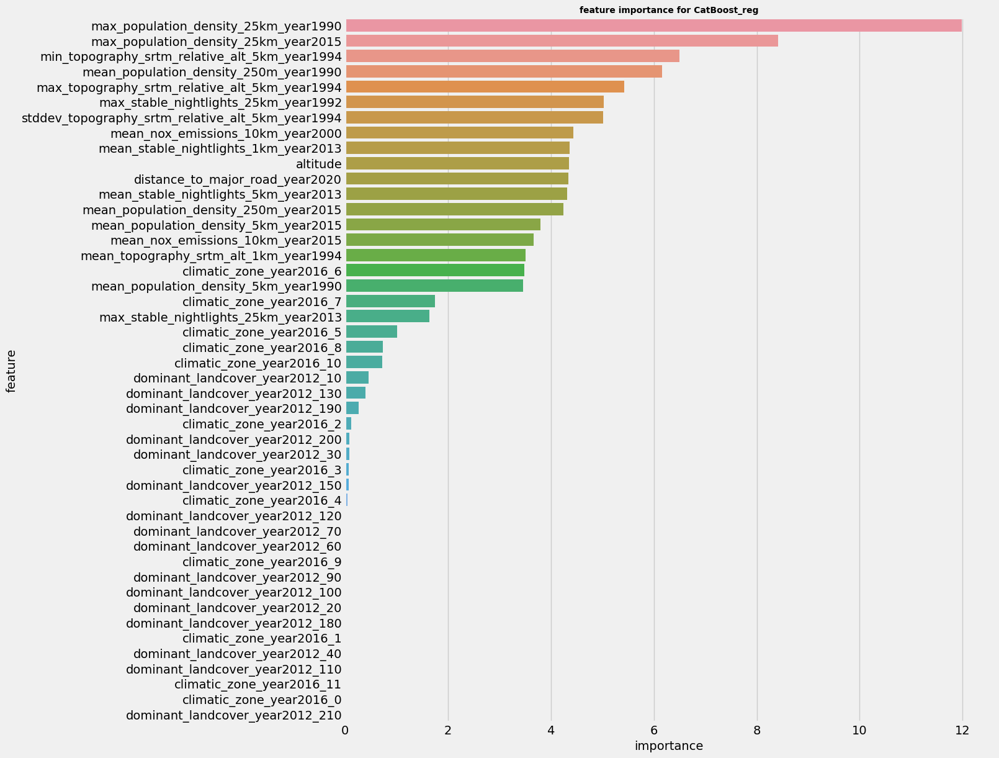

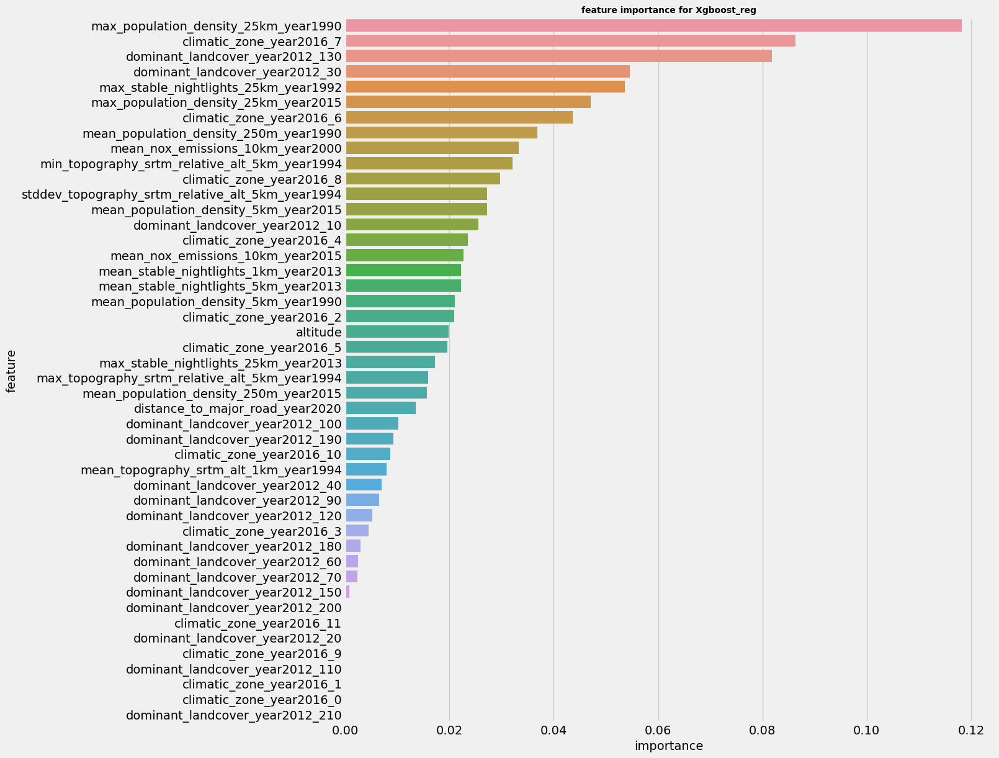

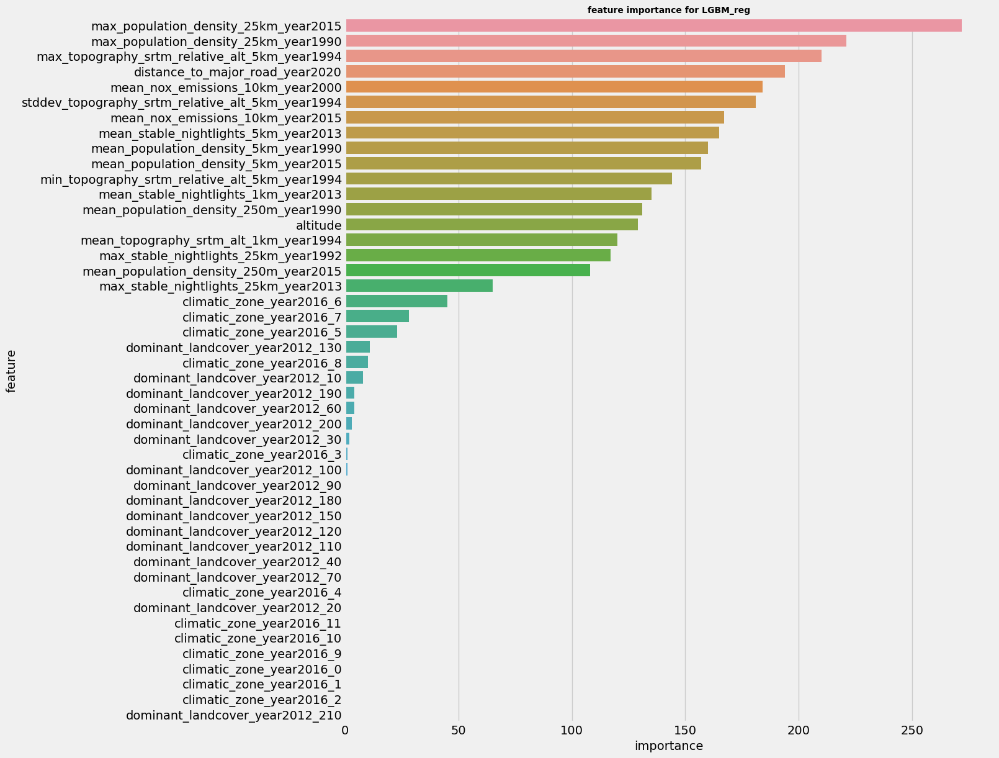

In [285]:
df_model_predictions_pm2p5_p95, df_model_score_pm2p5_p95, scaler_pm2p5_p95, trainned_models_pm2p5_p95, lmb_pm2p5_p95 = train(models, df_pm2p5_p95_cleaned, 'pm2p5', 'p95', boxcox_transform=True)

In [286]:
df_model_score_pm2p5_p95

,RandomForest_reg,CatBoost_reg,Xgboost_reg,LGBM_reg
R2_score,0.4381,0.5207,0.4862,0.4314
MAE,11.5053,10.3172,11.1881,11.3391
MSE,474.5532,404.8568,433.9571,480.2056
Max_AE,160.7611,155.4058,143.6381,156.9492


In [287]:
df_model_predictions_pm2p5_p95.head(50)

,,pm2p5_p95_RandomForest_reg,pm2p5_p95_CatBoost_reg,pm2p5_p95_Xgboost_reg,pm2p5_p95_LGBM_reg,pm2p5_p95_Truth
lat,lon,,,,,
38.102507,-122.237976,24.747655,20.755884,14.678755,20.257307,28.000000
54.599650,-5.928833,19.202474,21.554692,21.987383,20.714589,26.600000
36.962300,-4.844830,15.294651,18.016417,17.312586,20.046316,19.000000
44.401860,7.814630,35.615950,36.909039,32.509712,32.462798,40.450000
47.766666,16.766666,44.072670,36.811246,45.163567,33.397580,34.920000
48.246900,-121.603100,19.170744,20.251788,19.273851,19.695602,24.895000
48.345404,9.207748,18.480657,20.120169,17.896919,18.253253,20.262681
52.294884,-1.542911,27.206067,24.347345,29.049580,28.360890,29.100000
50.303208,6.001736,22.362053,23.899499,23.643650,24.489539,22.476500


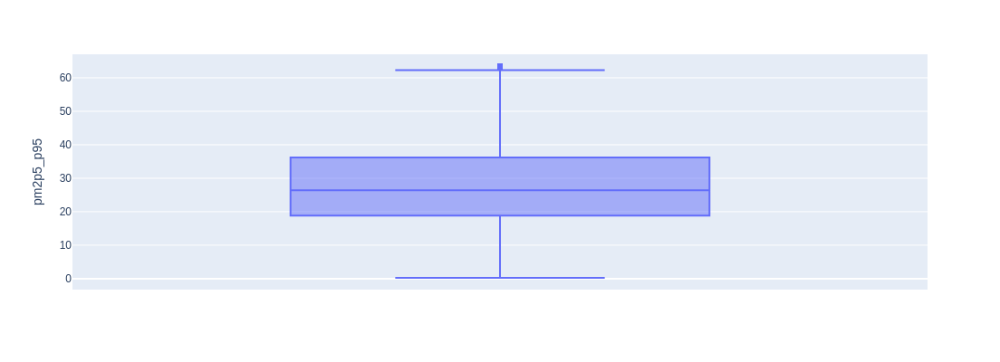

In [288]:
df_pm2p5_p95_cleaned['pm2p5_p95']  = df_pm2p5_p95_cleaned['pm2p5_p95'].where(df_pm2p5_p95_cleaned['pm2p5_p95'] <=63.5, 63.5)
fig = px.box(df_pm2p5_p95_cleaned, y="pm2p5_p95", width=400, height=400)
fig.show()

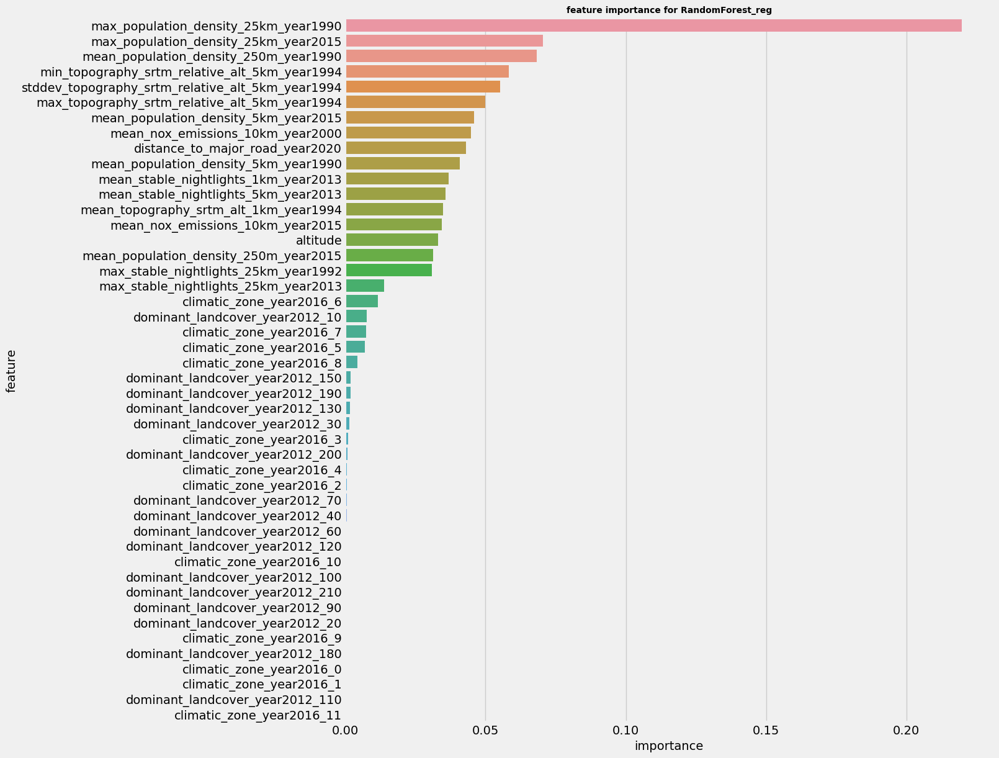

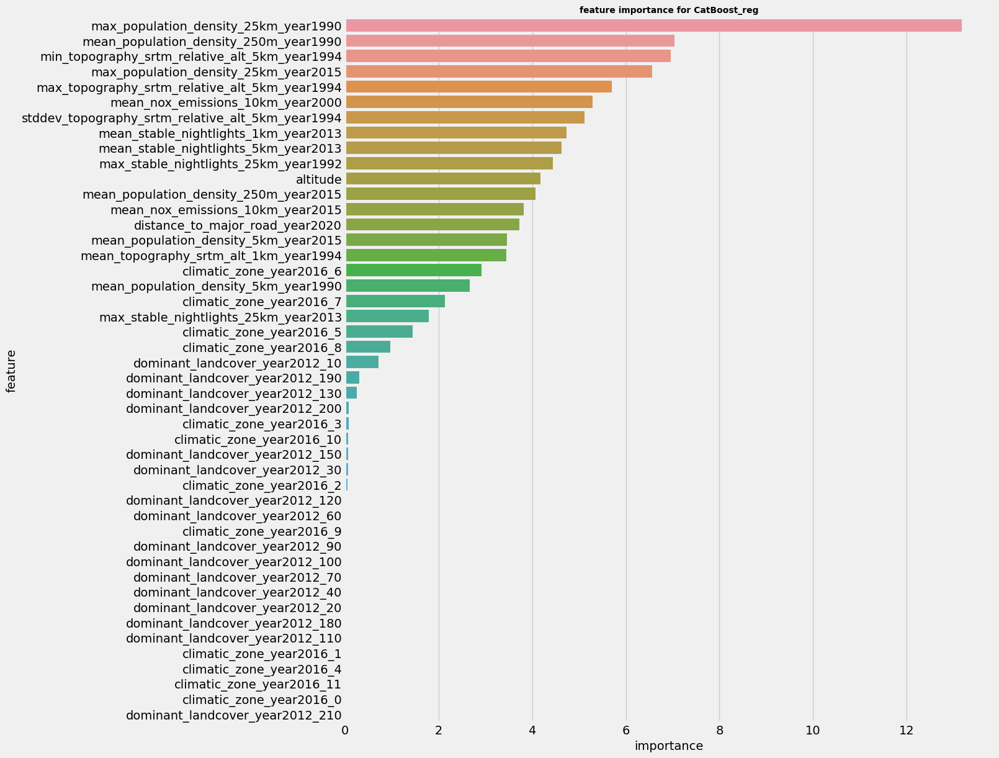

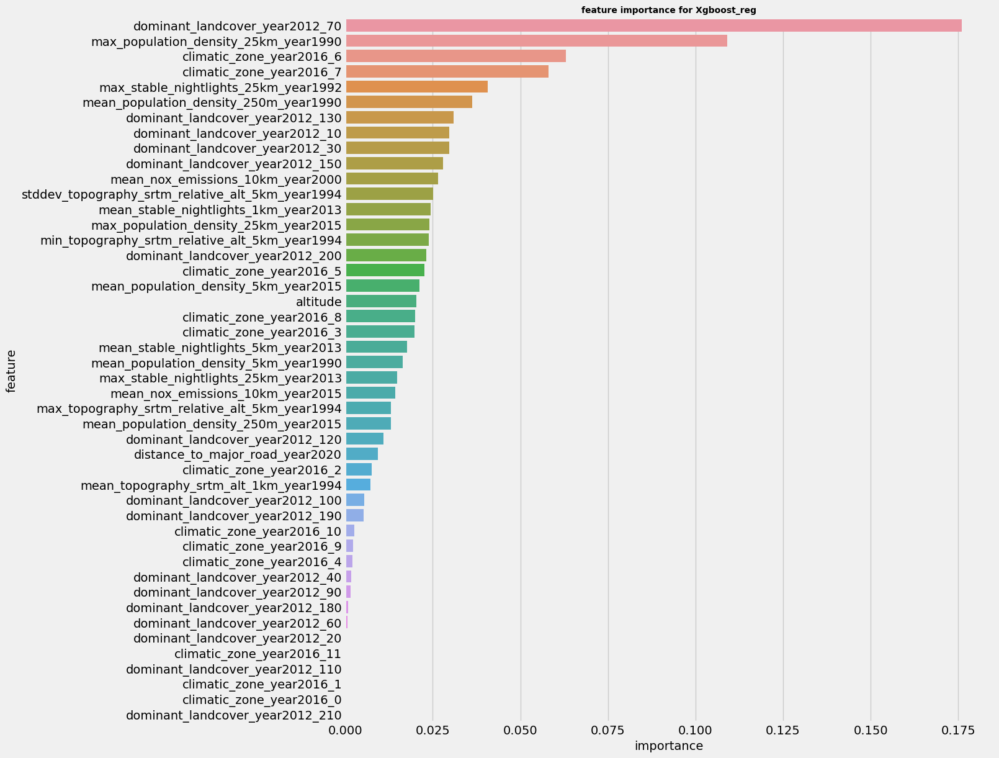

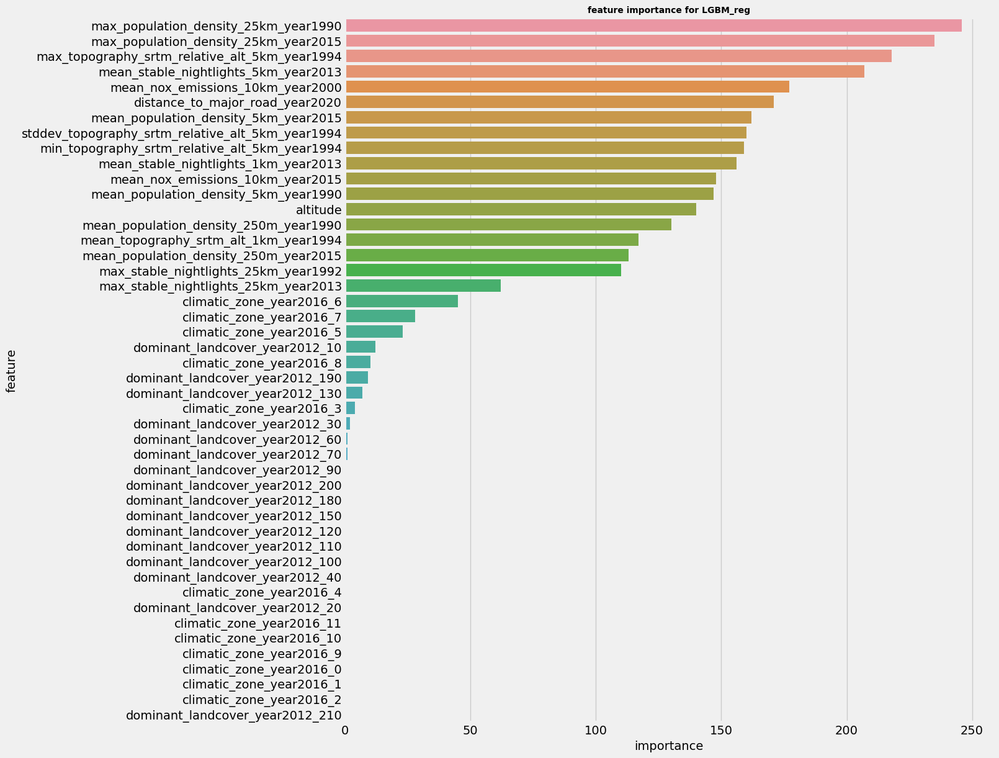

In [289]:
df_model_predictions_pm2p5_p95, df_model_score_pm2p5_p95, scaler_pm2p5_p95, trainned_models_pm2p5_p95, lmb_pm2p5_p95 = train(models, df_pm2p5_p95_cleaned, 'pm2p5', 'p95', boxcox_transform=True)

In [290]:
df_model_score_pm2p5_p95

,RandomForest_reg,CatBoost_reg,Xgboost_reg,LGBM_reg
R2_score,0.3608,0.4675,0.3685,0.3885
MAE,8.4923,7.9158,8.7879,8.3981
MSE,136.2329,113.4915,134.5743,130.3202
Max_AE,36.7344,35.7352,44.6307,34.9102


In [291]:
df_model_predictions_pm2p5_p95.head(50)

,,pm2p5_p95_RandomForest_reg,pm2p5_p95_CatBoost_reg,pm2p5_p95_Xgboost_reg,pm2p5_p95_LGBM_reg,pm2p5_p95_Truth
lat,lon,,,,,
38.102507,-122.237976,22.949539,22.726737,22.056093,22.235137,28.000000
54.599650,-5.928833,18.791441,21.514135,24.407234,22.120894,26.600000
36.962300,-4.844830,18.286711,17.199871,17.727716,19.010193,19.000000
44.401860,7.814630,33.945713,37.065293,29.152569,31.274561,40.450000
47.766666,16.766666,46.065731,38.224214,43.535477,41.001663,34.920000
48.246900,-121.603100,18.484603,21.581573,18.336079,20.163718,24.895000
48.345404,9.207748,19.833203,19.407883,20.080534,20.055545,20.262681
52.294884,-1.542911,31.015634,23.751397,29.496397,29.398936,29.100000
50.303208,6.001736,22.844348,23.095972,26.243839,26.261130,22.476500


In [292]:
func = lambda x: x if x<=200 else 200

5.0

**With important feature**

In [250]:
df_pm2p5_p95_cleaned = feature_engineering(df_pm2p5_p95_cleaned1, 'pm2p5', 'p95')

In [251]:
df_pm2p5_p95_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 1790 entries, (52.40757694, 20.95555556) to (48.2094444439111, 14.4369444444444)
Data columns (total 47 columns):
 #   Column                                            Non-Null Count  Dtype  
---  ------                                            --------------  -----  
 0   mean_topography_srtm_alt_1km_year1994             1790 non-null   float64
 1   max_topography_srtm_relative_alt_5km_year1994     1790 non-null   float64
 2   min_topography_srtm_relative_alt_5km_year1994     1790 non-null   float64
 3   stddev_topography_srtm_relative_alt_5km_year1994  1790 non-null   float64
 4   distance_to_major_road_year2020                   1790 non-null   float64
 5   mean_stable_nightlights_1km_year2013              1790 non-null   float64
 6   mean_stable_nightlights_5km_year2013              1790 non-null   float64
 7   max_stable_nightlights_25km_year2013              1790 non-null   float64
 8   max_stable_nightlights_25km_year1992     

In [252]:
rf_less_important_features = ['mean_population_density_250m_year1990',
                             'mean_population_density_5km_year1990',
                             'max_population_density_25km_year1990',
                            ]

In [253]:
df_pm2p5_p95_cleaned = df_pm2p5_p95_cleaned.drop(columns=rf_less_important_features)

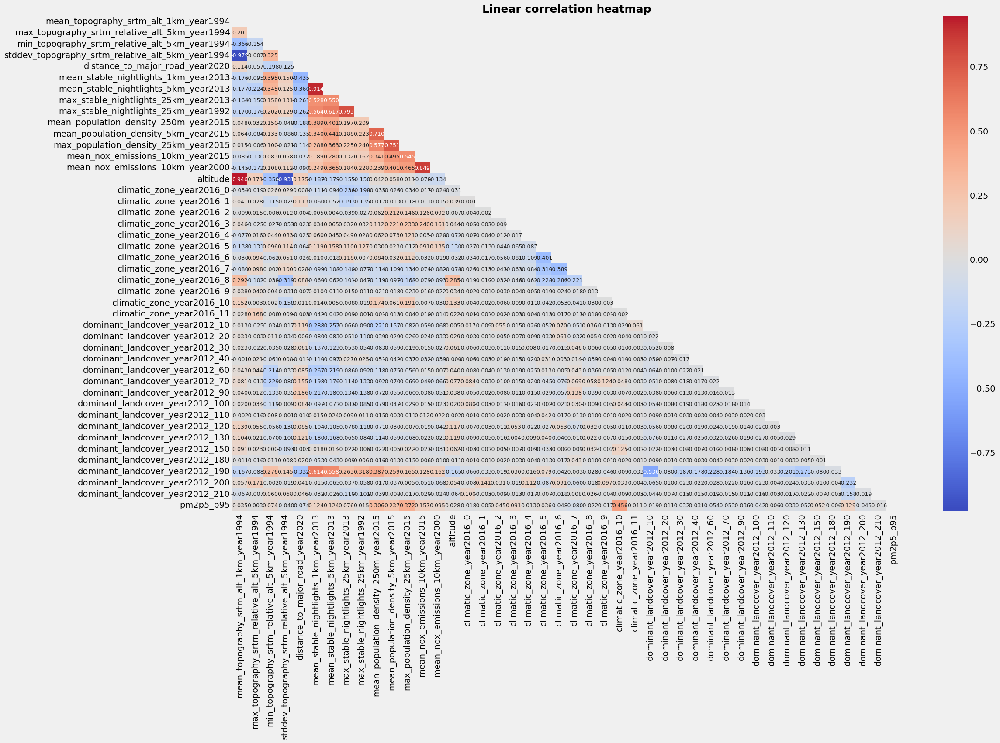

In [254]:
corr = df_pm2p5_p95_cleaned.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
fig, ax = plt.subplots(figsize=(22,14))
ax = sns.heatmap(corr, annot=True, fmt=".3f", annot_kws={'size':9}, 
                 mask=mask, center=0, cmap="coolwarm")
plt.title("Linear correlation heatmap")
plt.show()

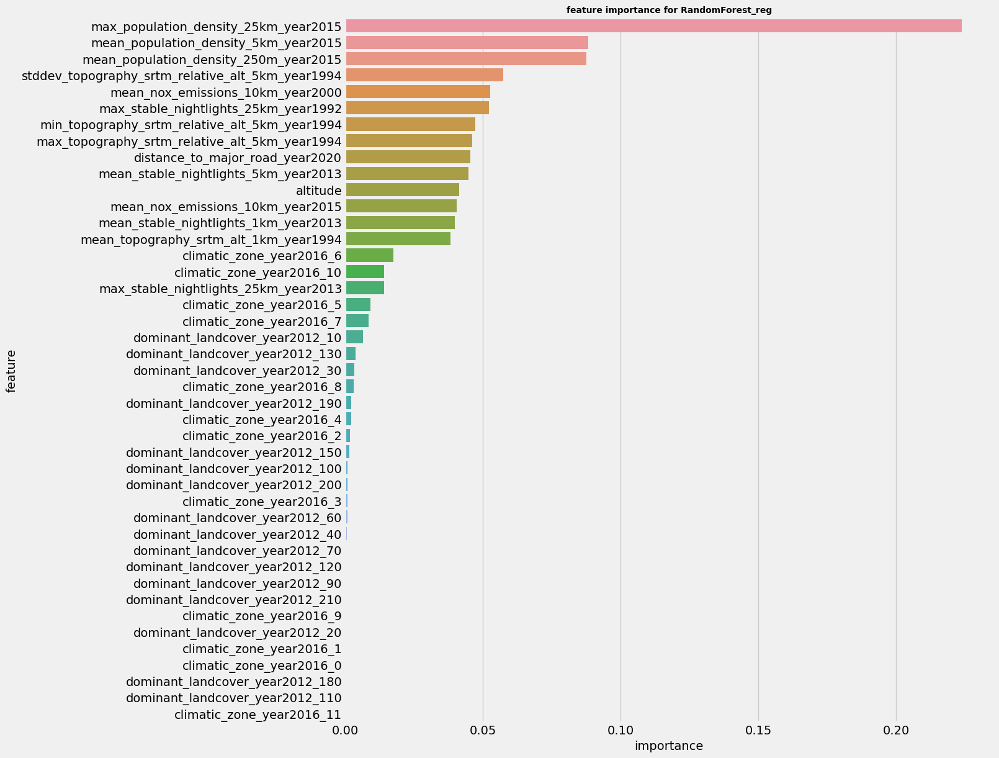

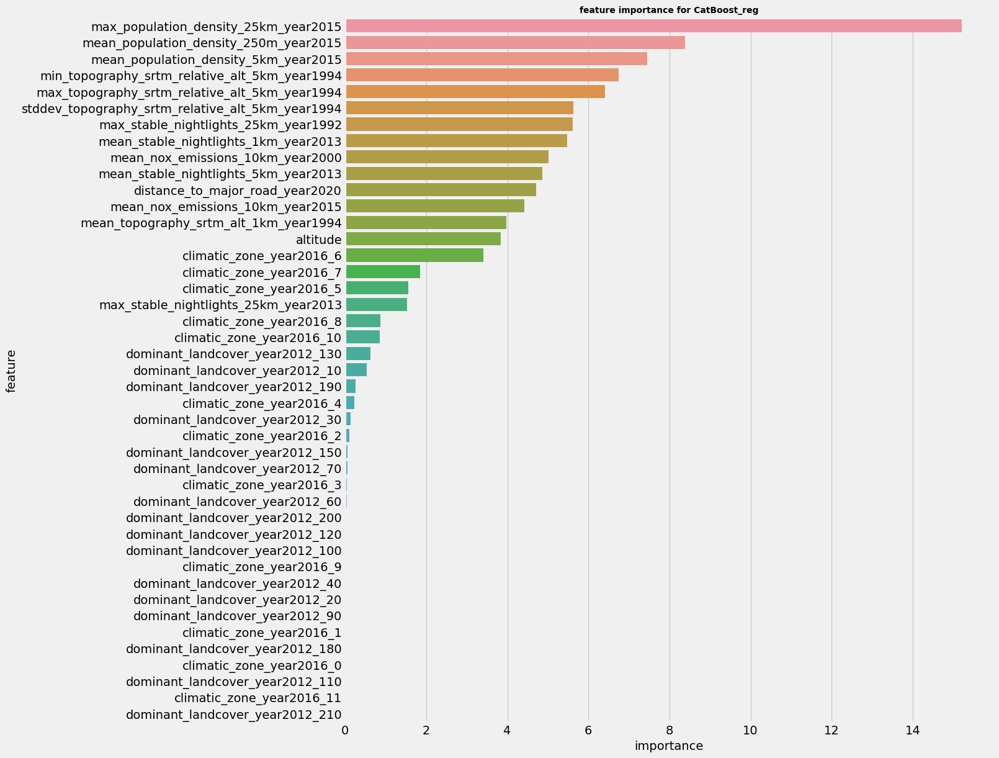

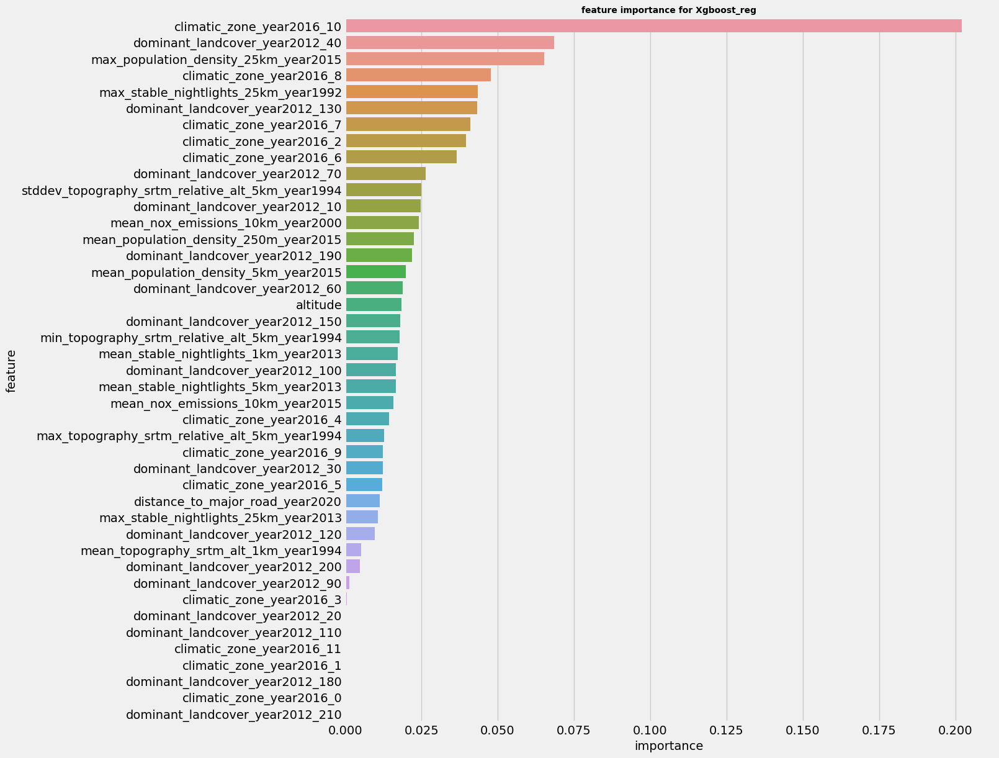

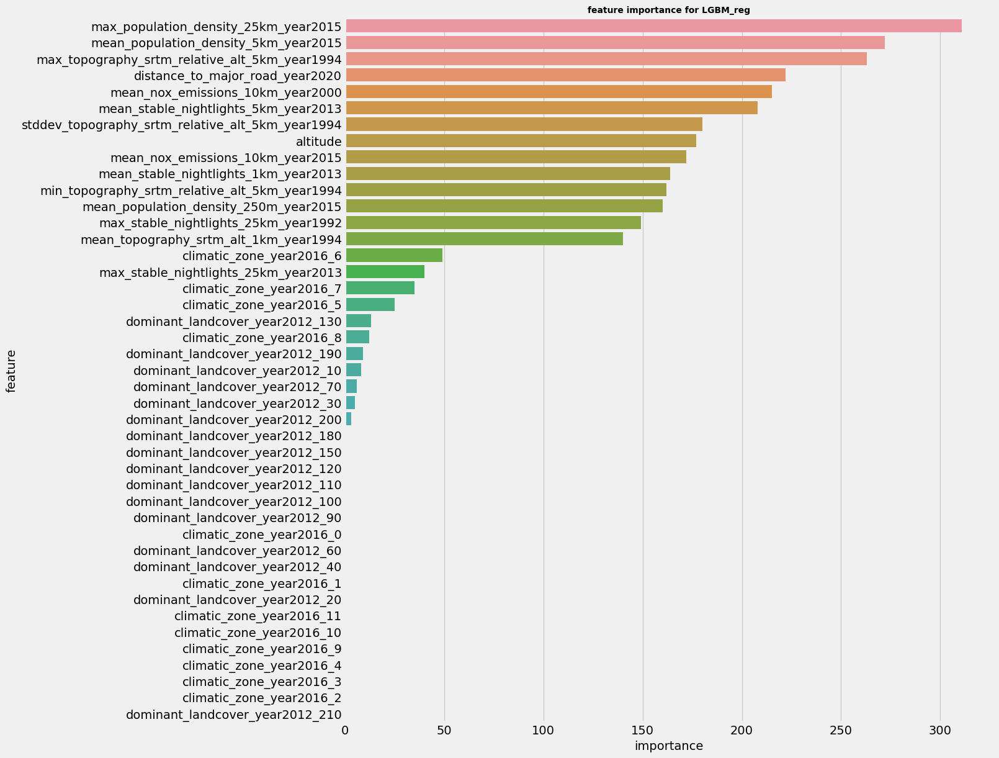

In [255]:
df_model_predictions_pm2p5_p95, df_model_score_pm2p5_p95, scaler_pm2p5_p95, trainned_models_pm2p5_p95, lmb_pm2p5_p95 = train(models, df_pm2p5_p95_cleaned, 'pm2p5', 'p95', boxcox_transform=True)

In [256]:
df_model_score_pm2p5_p95

,RandomForest_reg,CatBoost_reg,Xgboost_reg,LGBM_reg
R2_score,0.4160,0.3961,0.3830,0.2833
MAE,15.7369,15.1884,15.2008,16.1486
MSE,2886.7878,2985.2847,3049.6430,3542.7890
Max_AE,624.6395,642.6439,648.1207,695.2073


In [257]:
df_model_predictions_pm2p5_p95.head(10)

,,pm2p5_p95_RandomForest_reg,pm2p5_p95_CatBoost_reg,pm2p5_p95_Xgboost_reg,pm2p5_p95_LGBM_reg,pm2p5_p95_Truth
lat,lon,,,,,
38.102507,-122.237976,23.989214,21.984019,21.404623,18.310423,28.000000
54.599650,-5.928833,17.327006,20.224293,26.571135,20.757577,26.600000
36.962300,-4.844830,17.741058,17.013616,17.901258,19.198021,19.000000
44.401860,7.814630,33.694837,33.482405,41.603954,28.128469,40.450000
47.766666,16.766666,44.357298,39.128197,37.392288,35.521869,34.920000
48.246900,-121.603100,16.874595,21.009397,16.552311,17.545901,24.895000
48.345404,9.207748,21.823739,19.124359,15.180354,19.052444,20.262681
52.294884,-1.542911,28.126358,22.743879,24.733814,24.315047,29.100000
50.303208,6.001736,24.966675,24.290589,18.587212,24.978274,22.476500


In [83]:
#df_model_predictions_pm2p5_p95.loc[idx]

In [93]:
#df_model_score_pm2p5_p95

,Linear_reg,RandomForest_reg,CatBoost_reg,Xgboost_reg,LGBM_reg
R2_score,0.0713,0.3968,0.3702,0.4634,0.3479
MAE,13.8151,10.9438,11.1336,11.4070,11.5741
MSE,3056.3738,1985.2576,2072.9385,1766.0712,2146.2247
Max_AE,770.2335,625.5623,641.4686,575.3322,644.4172


In [102]:
#df_model_predictions_pm2p5_p95.head(10)

,,pm2p5_p95_Linear_reg,pm2p5_p95_RandomForest_reg,pm2p5_p95_CatBoost_reg,pm2p5_p95_Xgboost_reg,pm2p5_p95_LGBM_reg,pm2p5_p95_Truth
lat,lon,,,,,,
39.278700,-84.366250,20.639768,21.360592,21.334953,31.886658,23.503664,22.300000
39.278333,-9.245556,30.519590,28.124231,28.173075,31.103645,28.340039,18.000000
47.215703,15.628392,25.771458,33.834005,36.624155,32.759144,36.746898,33.789166
44.383250,8.283800,35.474947,38.156505,37.938710,40.676098,36.803335,40.720000
40.909000,-3.467900,23.653073,16.435821,15.011635,17.514095,10.432278,16.000000
47.262619,11.392361,29.412505,30.615469,30.995014,48.750622,32.676769,26.169599
51.230858,5.053303,25.550031,33.470108,33.586173,35.999641,35.588595,27.100000
55.402658,-118.280945,7.957230,9.840194,7.961202,5.713583,12.770350,15.000000
43.401501,-5.802870,31.939450,37.357083,33.256907,33.268925,33.553484,35.000000


**no2_median**

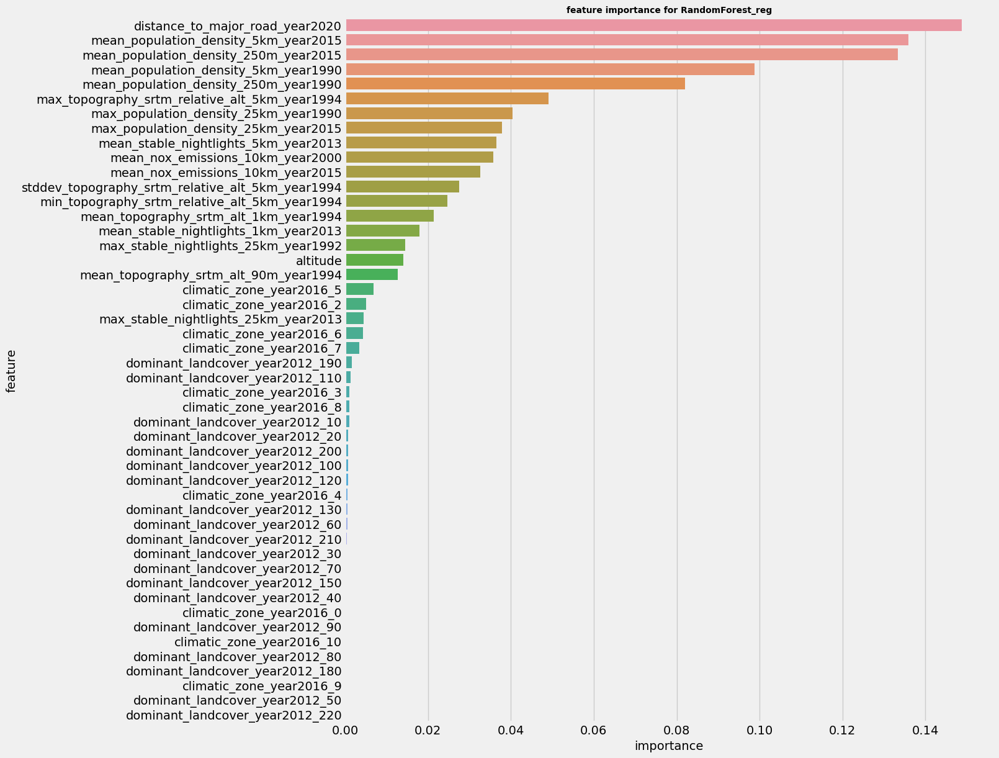

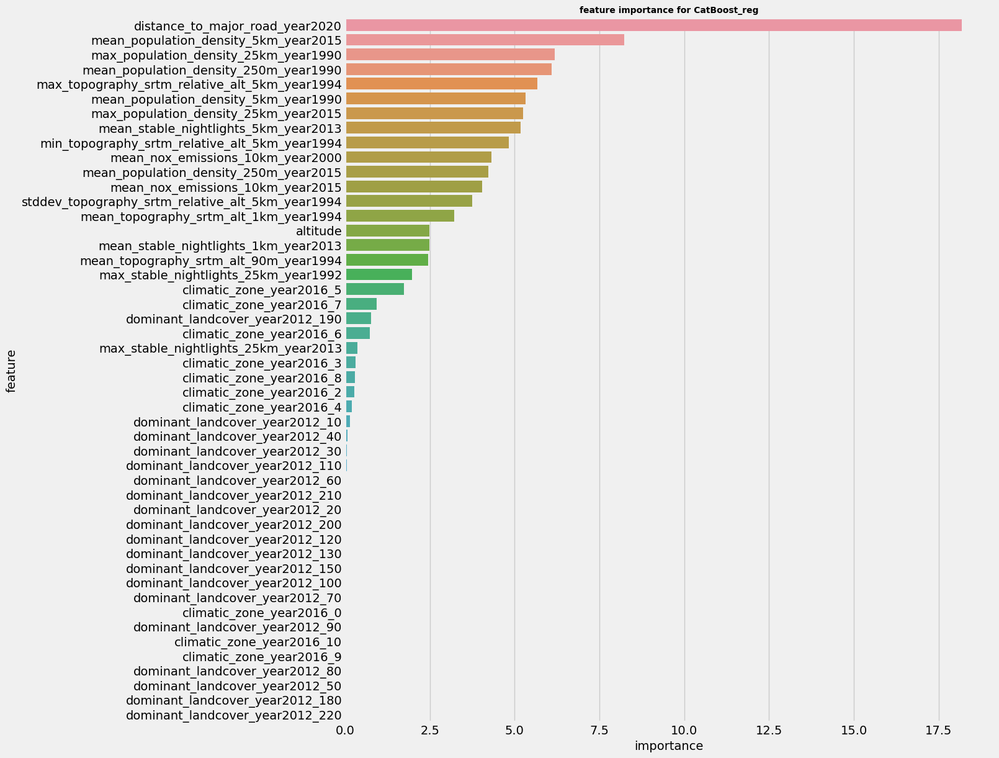

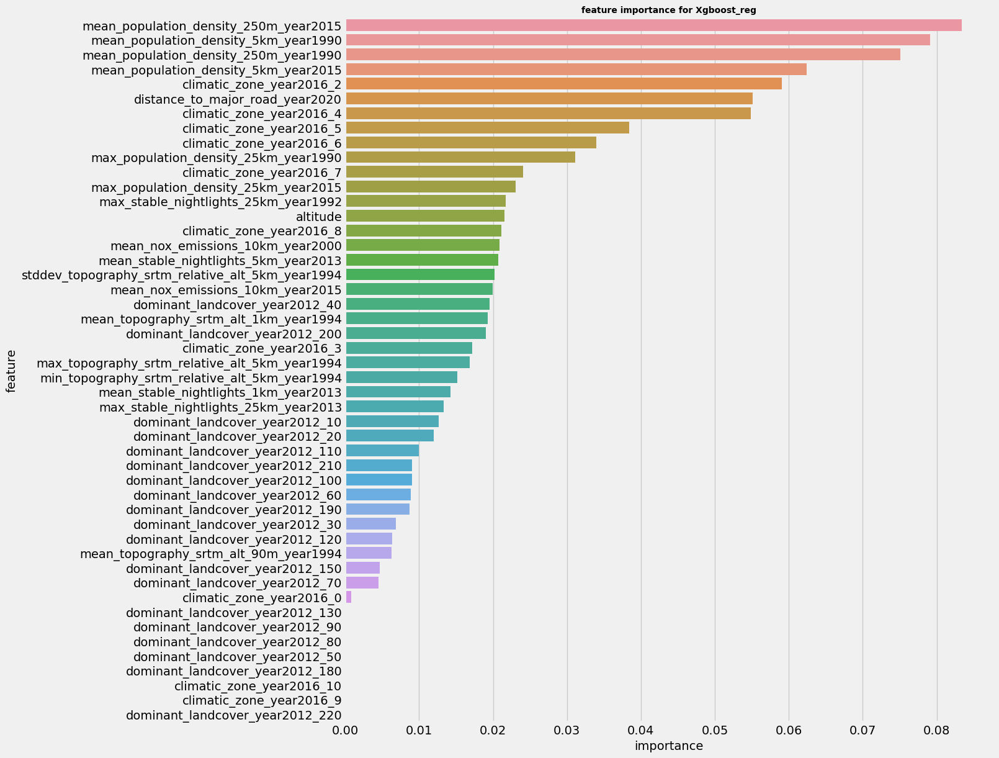

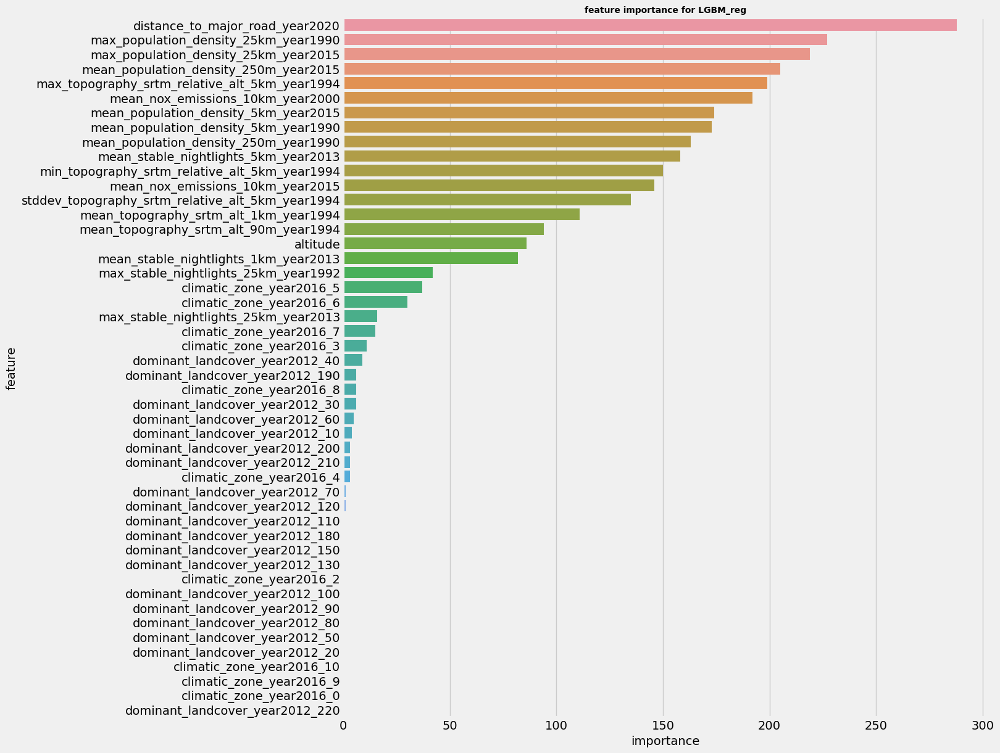

In [126]:
df_model_predictions_no2_median, df_model_score_no2_median, scaler_no2_median, trainned_models_no2_median, lmb_no2_median = train(models, df_no2_median_cleaned, 'no2', 'median', boxcox_transform=False)

In [129]:
df_no2_median_cleaned['no2_median'] = df_no2_median_cleaned['no2_median'] + 1e-8

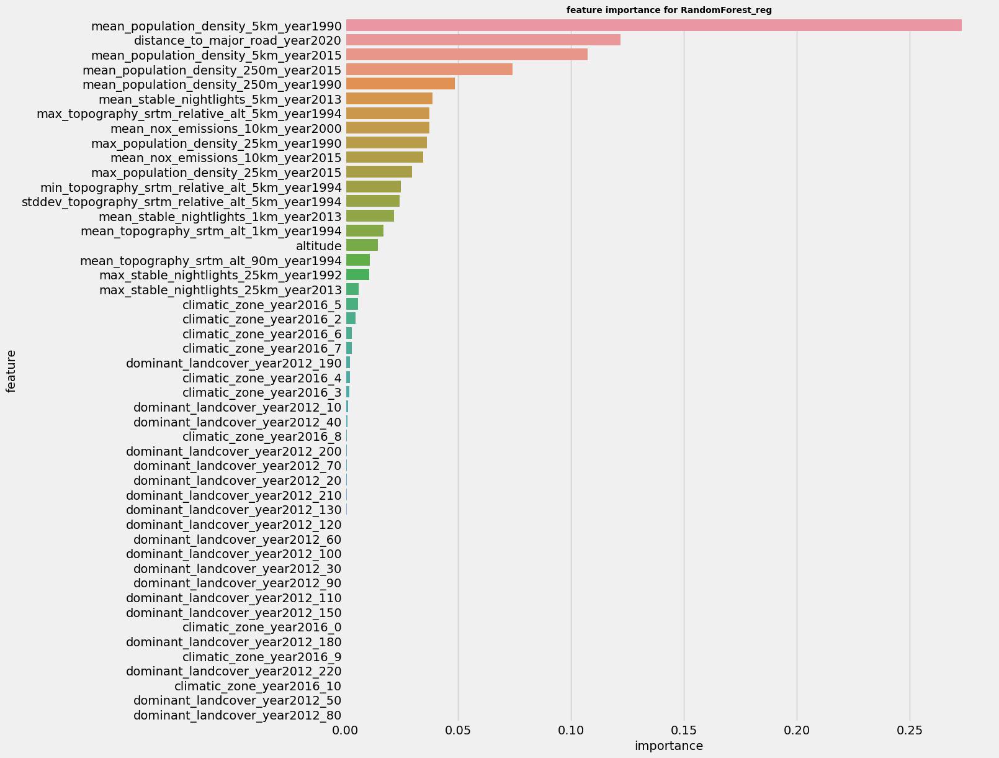

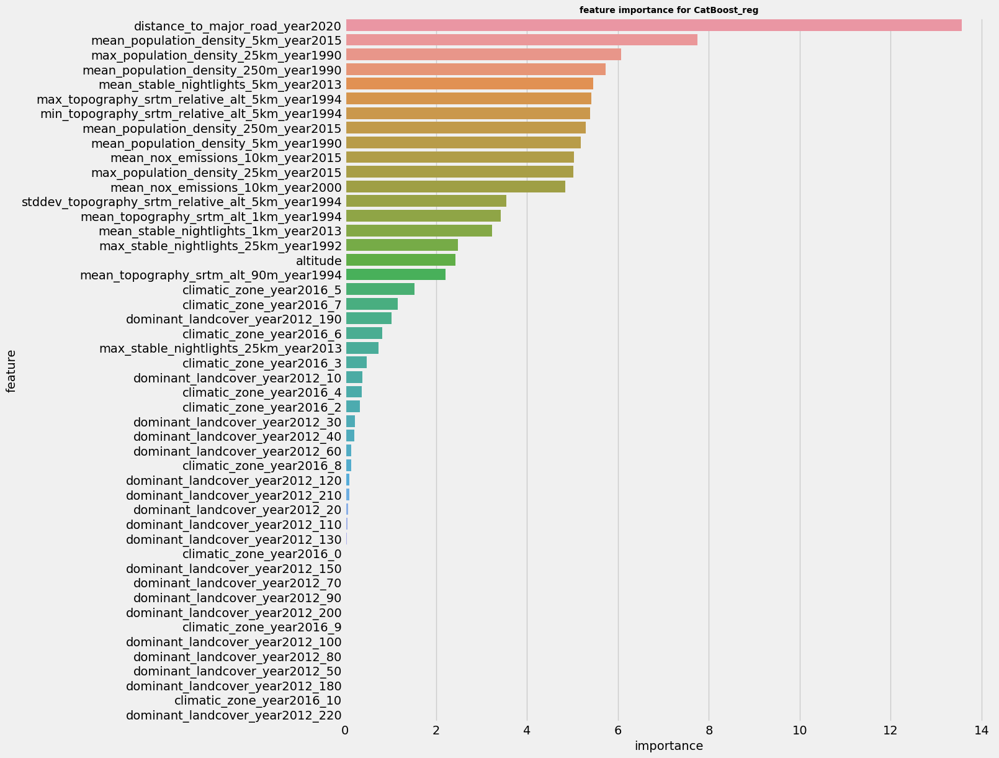

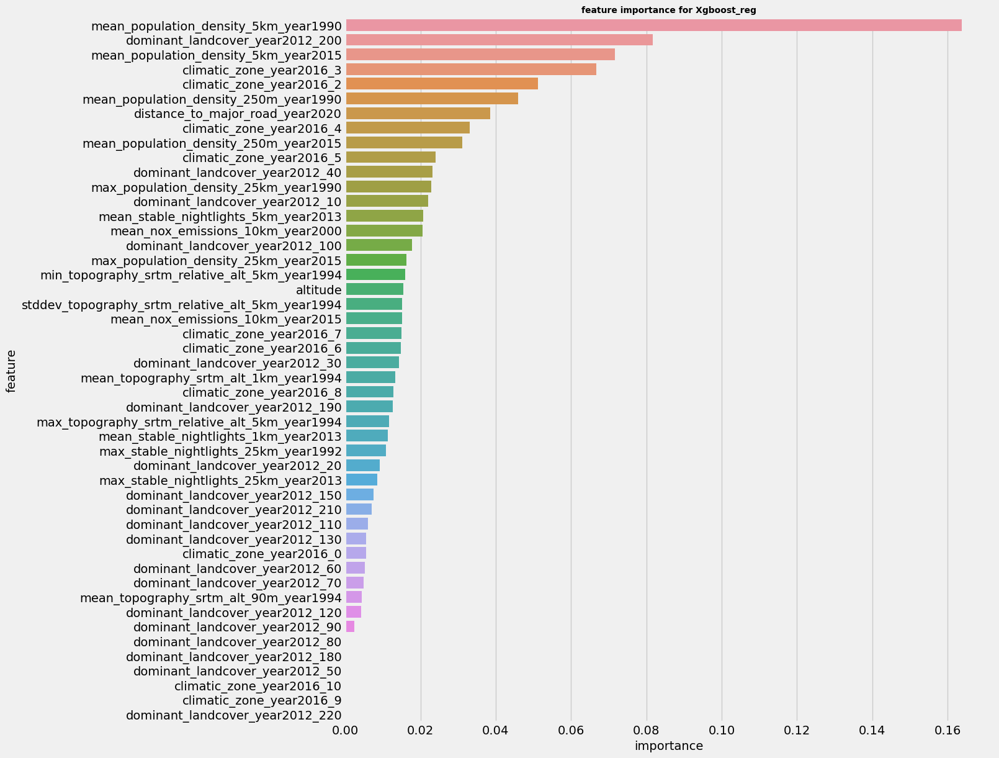

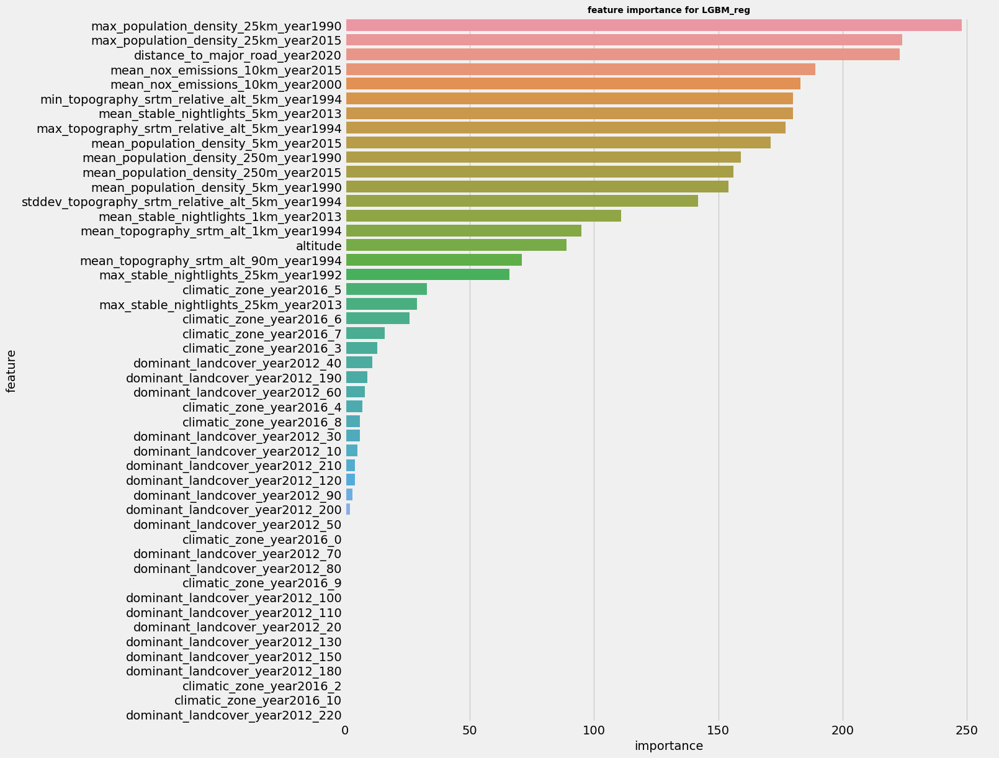

In [130]:
df_model_predictions_no2_median, df_model_score_no2_median, scaler_no2_median, trainned_models_no2_median, lmb_no2_median = train(models, df_no2_median_cleaned, 'no2', 'median', boxcox_transform=True)

In [131]:
df_model_score_no2_median

,Linear_reg,RandomForest_reg,CatBoost_reg,Xgboost_reg,LGBM_reg
R2_score,0.3678,0.4696,0.4969,0.4816,0.5091
MAE,3.9696,3.4518,3.1870,3.3922,3.2011
MSE,31.5849,26.5002,25.1363,25.8969,24.5238
Max_AE,41.7292,42.3383,41.2121,41.6592,42.1492


In [132]:
df_model_predictions_no2_median

,,no2_median_Linear_reg,no2_median_RandomForest_reg,no2_median_CatBoost_reg,no2_median_Xgboost_reg,no2_median_LGBM_reg,no2_median_Truth
lat,lon,,,,,,
49.186265,-123.152422,10.609753,8.105024,6.329575,7.117186,7.371080,13.000000
48.174353,16.361417,13.612985,12.496436,10.010725,8.672287,11.866649,14.194495
39.489630,16.386800,6.290661,8.231922,5.700741,5.828192,3.820305,15.087685
45.040833,8.915000,6.191298,6.909706,7.831793,10.789215,8.285684,11.309560
45.856930,12.925900,5.023841,5.878480,7.407190,6.768485,6.753373,7.564748
...,...,...,...,...,...,...,...
37.688889,-1.701111,7.505853,5.601475,6.953343,5.776801,6.084916,6.798610
48.172795,6.452814,9.694886,10.119378,9.236310,10.735339,8.893166,5.491185
28.456660,-16.271836,9.165123,5.372610,5.930193,4.787047,5.270108,5.752670


In [101]:
#df_no2_median_cleaned = df_no2_median_cleaned.drop(columns=['climatic_zone_year2016', 'dominant_landcover_year2012'])

In [185]:
#df_model_predictions_no2_median, df_model_score_no2_median, scaler = train(models, df_no2_median_cleaned, 'no2', 'median', boxcox_transform=True)

In [184]:
#df_model_score_no2_median

In [183]:
#df_model_predictions_no2_median

In [42]:
df_pm2p5_p95_duplicate[columns_to_control_nan] = df_pm2p5_p95_duplicate[columns_to_control_nan].replace(-9999, np.nan)
df_pm2p5_p95_duplicate[columns_to_control_nan] = df_pm2p5_p95_duplicate[columns_to_control_nan].replace(-1, np.nan)
df_pm2p5_p95_duplicate = df_pm2p5_p95_duplicate.dropna(subset=columns_to_control_nan)
df_pm2p5_p95_duplicate['altitude'] = df_pm2p5_p95_duplicate['altitude'].fillna(df_pm2p5_p95_duplicate['mean_topography_srtm_alt_90m_year1994'])
df_pm2p5_p95_duplicate = df_pm2p5_p95_duplicate.drop(columns='htap_region_tier1_year2010')

In [43]:
df_pm2p5_p95_duplicate

mean_topography_srtm_alt_90m_year1994  \
lat       lon                                                  
50.754704  6.093923                               200.666667   
           6.093923                               200.666667   
51.536911  7.457463                                70.666667   
           7.457463                                70.666667   
51.249211  6.732383                                38.333333   
...                                                      ...   
44.097074 -105.343164                            1353.333333   
48.054315 -122.171529                               7.000000   
          -122.171529                               7.000000   
46.598056 -120.499167                             320.333333   
          -120.499167                             320.333333   

                       mean_topography_srtm_alt_1km_year1994  \
lat       lon                                                  
50.754704  6.093923                               208.568696   
           6.093923                               208.568696   
51.536911  7.457463                                75.298126   
           7.457463                                75.298126   
51.249211  6.732383                                34.198971   
...                                                      ...   
44.097074 -105.343164                            1361.588119   
48.054315 -122.171529                               6.212844   
          -122.171529                               6.212844   
46.598056 -120.499167                             320.798861   
          -120.499167                             320.798861   

                       max_topography_srtm_relative_alt_5km_year1994  \
lat       lon                                                          
50.754704  6.093923                                            171.0   
           6.093923                                            171.0   
51.536911  7.457463                                             73.0   
           7.457463                                             73.0   
51.249211  6.732383                                             16.0   
...                                                              ...   
44.097074 -105.343164                                           99.0   
48.054315 -122.171529                                          154.0   
          -122.171529                                          154.0   
46.598056 -120.499167                                          328.0   
          -120.499167                                          328.0   

                       min_topography_srtm_relative_alt_5km_year1994  \
lat       lon                                                          
50.754704  6.093923                                            -58.0   
           6.093923                                            -58.0   
51.536911  7.457463                                            -15.0   
           7.457463                                            -15.0   
51.249211  6.732383                                            -27.0   
...                                                              ...   
44.097074 -105.343164                                          -17.0   
48.054315 -122.171529                                            0.0   
          -122.171529                                            0.0   
46.598056 -120.499167                                          -29.0   
          -120.499167                                          -29.0   

                       stddev_topography_srtm_relative_alt_5km_year1994  \
lat       lon                                                             
50.754704  6.093923                                         -151.293047   
           6.093923                                         -151.293047   
51.536911  7.457463                                          -56.860402   
           7.457463                                          -56.860402   
51.249211  6.732383              

In [44]:
df_pm2p5_p95_duplicate = second_round_cleaning_data(df_pm2p5_p95_duplicate)
#df_pm2p5_p95_duplicate = df_pm2p5_p95_duplicate.drop(columns=['climatic_zone_year2016', 'dominant_landcover_year2012', 'max_stable_nightlights_25km_year2013'])

In [45]:
#df_pm2p5_p95_duplicate.columns

In [46]:
df_pm2p5_p95_duplicate_ft = feature_engineering(df_pm2p5_p95_duplicate, 'pm2p5', 'p95')

In [47]:
list(df_pm2p5_p95_cleaned1.columns) == list(df_pm2p5_p95_duplicate.columns)

True

In [54]:
model = trainned_models_pm2p5_p95['RandomForest_reg']

In [55]:
X_dup = df_pm2p5_p95_duplicate_ft.drop(columns=['pm2p5_p95'])
cols = list(X_dup.columns)
X_dup = X_dup[cols]
X_test_dup = scaler_pm2p5_p95.transform(X_dup)
Y_test_dup = df_pm2p5_p95_duplicate_ft['pm2p5_p95']
Y_pre_dup = inv_boxcox(model.predict(X_test_dup), lmb_pm2p5_p95)
model_predict_dup = {}
model_predict_dup['pm2p5_p95_pred_dup'] = Y_pre_dup
model_predict_dup['pm2p5_p95_truth_dup'] = Y_test_dup
df_model_predict_dup = pd.DataFrame(model_predict_dup)
df_model_predict_dup.tail(50)

pm2p5_p95_pred_dup  pm2p5_p95_truth_dup
lat       lon                                                 
46.813097  6.944480             17.823674            27.350000
           6.944480             17.823674            27.375000
37.943287  23.647511            60.514840            45.650000
           23.647511            60.514840            26.000000
49.722260  6.305330             15.568365            24.700000
           6.305330             15.568365            31.000000
49.505040  5.976940             56.957537            26.660000
           5.976940             56.957537            33.000000
49.597690  6.137590             17.906067            25.005000
           6.137590             17.906067            20.000000
48.192230  14.519540            34.726443            32.500000
           14.519540            34.726443            25.500000
48.211600  15.632500            28.515116            32.500000
           15.632500            28.515116            31.000000
48.230833  16.636389            10.927245            34.000000
           16.636389            10.927245            27.500000
48.219110  16.349818            36.256084            90.920502
           16.349818            36.256084            33.901689
           16.349818            36.256084            37.699100
47.840114  16.526170            21.352833            34.111000
           16.526170            21.352833            42.132027
           16.526170            21.352833            47.786304
48.084300  16.329000            45.499300            35.000000
           16.329000            45.499300            73.000000
35.038022  33.057789             2.469910            17.910000
           33.057789             2.469910            18.055000
43.382800 -8.409200             18.913147            34.000000
          -8.409200             18.913147            28.267000
40.863690  14.254510            32.629150            37.610000
           14.254510            32.629150           104.200000
37.950741 -121.268523           17.128288            35.000000
          -121.268523           17.128288            31.000000
39.485987 -87.401312             7.838354            23.100000
          -87.401312             7.838354            22.490000
46.842181 -114.021499            7.493307            27.870000
          -114.021499            7.493307            19.260000
40.304694 -79.505667             6.124033            21.100000
          -79.505667             6.124033            25.100000
40.736389 -111.872222           25.320576            30.000000
          -111.872222           25.320576            23.000000
39.741661 -94.858576             7.918109            22.000000
          -94.858576             7.918109            21.000000
19.509778 -155.913417            2.026462            23.000000
          -155.913417            2.026462            19.000000
44.097074 -105.343164            3.818477            13.000000
          -105.343164            3.818477             2.700000
48.054315 -122.171529            8.920544            24.800000
          -122.171529            8.920544            24.400000
46.598056 -120.499167           12.161853            24.565000
          -120.499167           12.161853            33.000000

In [84]:
df_model_score

,Linear_reg,RandomForest_reg,CatBoost_reg,Xgboost_reg,LGBM_reg
R2_score,0.1408,0.2699,0.2172,-0.0330,0.3287
MAE,13.5250,10.4309,11.0184,12.0529,11.0027
RMSE,32.7803,30.2165,31.2890,35.9429,28.9748


In [360]:
df_pm2p5_p95_duplicate_ft

mean_topography_srtm_alt_1km_year1994  \
lat       lon                                                  
50.754704  6.093923                               208.568696   
           6.093923                               208.568696   
51.536911  7.457463                                75.298126   
           7.457463                                75.298126   
51.249211  6.732383                                34.198971   
...                                                      ...   
44.097074 -105.343164                            1361.588119   
48.054315 -122.171529                               6.212844   
          -122.171529                               6.212844   
46.598056 -120.499167                             320.798861   
          -120.499167                             320.798861   

                       max_topography_srtm_relative_alt_5km_year1994  \
lat       lon                                                          
50.754704  6.093923                                            171.0   
           6.093923                                            171.0   
51.536911  7.457463                                             73.0   
           7.457463                                             73.0   
51.249211  6.732383                                             16.0   
...                                                              ...   
44.097074 -105.343164                                           99.0   
48.054315 -122.171529                                          154.0   
          -122.171529                                          154.0   
46.598056 -120.499167                                          328.0   
          -120.499167                                          328.0   

                       min_topography_srtm_relative_alt_5km_year1994  \
lat       lon                                                          
50.754704  6.093923                                            -58.0   
           6.093923                                            -58.0   
51.536911  7.457463                                            -15.0   
           7.457463                                            -15.0   
51.249211  6.732383                                            -27.0   
...                                                              ...   
44.097074 -105.343164                                          -17.0   
48.054315 -122.171529                                            0.0   
          -122.171529                                            0.0   
46.598056 -120.499167                                          -29.0   
          -120.499167                                          -29.0   

                       climatic_zone_year2016  dominant_landcover_year2012  \
lat       lon                                                                
50.754704  6.093923                         7                          190   
           6.093923                         7                          190   
51.536911  7.457463                         5                          190   
           7.457463                         5                          190   
51.249211  6.732383                         5                           70   
...                                       ...                          ...   
44.097074 -105.343164                       8                          130   
48.054315 -122.171529                       5                          190   
          -122.171529                       5                          190   
46.598056 -120.499167                       6                          190   
          -120.499167                       6                          190   

                       dominant_ecoregion_year2017  \
lat       lon                                        
50.754704  6.093923                            686   
           6.093923                            686   
51.536911  7.457463                            664   
           7.457463            

In [ ]:
df_pm2p5_median = pd.read_csv("pm2p5/median.csv", comment="#")
df_pm2p5_p75 = pd.read_csv("pm2p5/p75.csv", comment="#")
df_pm2p5_p90 = pd.read_csv("pm2p5/p90.csv", comment="#")
df_pm2p5_p95 = pd.read_csv("pm2p5/p95.csv", comment="#")
df_no2_median = pd.read_csv("no2/median.csv", comment="#")
df_no2_p75 = pd.read_csv("no2/p75.csv", comment="#")
df_no2_p90 = pd.read_csv("no2/p90.csv", comment="#")
df_no2_p95 = pd.read_csv("no2/p95.csv", comment="#")

In [ ]:
df_bureau['DAYS_CREDIT_ONGOING'] = df_bureau['DAYS_CREDIT_ONGOING'].apply(lambda x : x if x > 0 else 0)
df_bureau['AMT_CREDIT_SUM'] = df_bureau['AMT_CREDIT_SUM'].astype (float)
imputer = SimpleImputer(strategy='median')
X_train.iloc[:,:] = imputer.fit_transform(X_train)

model = LogisticRegression()
model.fit(X_train, y_train)
importances = pd.DataFrame(data={
    'Attribute': X_train.columns,
    'Importance': model.coef_[0]
})
importances = importances.sort_values(by='Importance', ascending=False)


# les coefficients :
plt.bar(x=importances['Attribute'], height=importances['Importance'], color='#087E8B')
plt.title('Feature importances obtained from coefficients', size=14)
plt.xticks(rotation='vertical')
plt.show()


# l'importance:
feature_rank = pd.DataFrame( { 'feature': X_train_ref.columns,'importance': radm_clf.feature_importances_ } )
## Sorting the features based on their importances with mosti important feature at top.
feature_rank = feature_rank.sort_values('importance', ascending =False)
plt.figure(figsize=(8, 32))
sns.barplot( y = 'feature', x = 'importance', data = feature_rank )

# pour select les top 80
features = feature_rank['feature'].to_list()
features = features[:81]
#
# features
X_train_RFC = X_train[features]
X_test_RFC = X_test[features]

importance = xgb_model.get_booster().get_score(importance_type='weight')

# Triez les importances des features par ordre décroissant
importance = sorted(importance.items(), key=lambda x: x[1], reverse=True)
# Affichez les importances des features
for feature, score in importance:
    print(feature, score)
    

y_pred = lgbm_model.predict(X_test)
plt.rcParams["figure.figsize"] = (12, 20)
lightgbm.plot_importance(lgbm_model, max_num_features =60, height=.9)

# l'importance:
feature_rank = pd.DataFrame( {'feature': X_train_ref.columns,'importance': lgbm_model.feature_importances_ } )
## Sorting the features based on their importances with mosti important feature at top.
feature_rank = feature_rank.sort_values('importance', ascending =False)


# pour select les top 60
feature_lgbm = feature_rank['feature'].to_list()
feature_lgbm = feature_lgbm[:60]


In [ ]:
mycolumns = df_app.select_dtypes(exclude=['int64','float64'])
#
print("avant : ", df_app.shape)
df_app_infos = pd.get_dummies(df_app, drop_first=True)
print("     ")
print("après : ", df_app_infos.shape)
df_app_infos.head(2)

In [ ]:
ax, fig = plt.subplots(figsize=(8,4)) 
ax = sns.countplot(y='TARGET', data=application_train)
ax.set_title("Distribution des 'TARGET' ",fontsize = 16)

for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width()/len(application_train.TARGET))
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y), fontsize=20, fontweight='bold')
        
plt.show()

In [ ]:
plt.figure(figsize=(10, 4))
sns.histplot((application_train['AGE']), bins = 25).set_title('L\'âge des clients', size= 16)
plt.show()

In [ ]:
def plot_stat(data, feature, title) : 
    
    ax, fig = plt.subplots(figsize=(10,2)) 
    ax = sns.countplot(y=feature, data=data, order=data[feature].value_counts(ascending=False).index)
    ax.set_title(title,size =18)
    # 2 paramètres des plot:
    ax.set_ylabel('Types', fontsize=12, color='black')
    ax.set_xlabel('Count', fontsize=12, color='black')

    for p in ax.patches:
                percentage = '{:.1f}%'.format(100 * p.get_width()/len(data[feature]))
                x = p.get_x() + p.get_width()
                y = p.get_y() + p.get_height()/2
                ax.annotate(percentage, (x, y), fontsize=20, fontweight='bold')
    plt.show()

In [ ]:
def plot2_stat(data, feature, title) : 
    
    ax, fig = plt.subplots(figsize=(10,6)) 
    ax = sns.countplot(y=feature, data=data, order=data[feature].value_counts(ascending=False).index)
    ax.set_title(title,size =18)
    # 2 paramètres des plot:
    ax.set_ylabel('Types', fontsize=12, color='black')
    ax.set_xlabel('Count', fontsize=12, color='black')

    for p in ax.patches:
                percentage = '{:.1f}%'.format(100 * p.get_width()/len(data[feature]))
                x = p.get_x() + p.get_width()
                y = p.get_y() + p.get_height()/2
                ax.annotate(percentage, (x, y), fontsize=20, fontweight='bold')
    plt.show()

In [ ]:
feature_rank = pd.DataFrame( { 'feature': X.columns,'importance': radm_clf.feature_importances_ } )
## Sorting the features based on their importances with mosti important feature at top.
feature_rank = feature_rank.sort_values('importance', ascending =False)
plt.figure(figsize=(8, 14))
sns.barplot( y = 'feature', x = 'importance', data = feature_rank )

In [ ]:
#Plot distribution of one feature
def plot_distribution(feature, title):
    plt.figure(figsize=(14,6))

    t0 = application_train.loc[application_train['TARGET'] == 0]
    t1 = application_train.loc[application_train['TARGET'] == 1]

    
    sns.kdeplot(t0[feature].dropna(), color='blue', label="TARGET = 0")
    sns.kdeplot(t1[feature].dropna(), color='red', label="TARGET = 1")
    plt.title(title)
    plt.ylabel('')
    plt.legend()
    plt.show()

In [ ]:
# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns


In [ ]:
# les coefficients :
plt.bar(x=importances['Attribute'], height=importances['Importance'], color='#087E8B')
plt.title('Feature importances obtained from coefficients', size=14)
plt.xticks(rotation='vertical')
plt.show()

In [ ]:
# l'importance:
feature_rank = pd.DataFrame( { 'feature': X_train_ref.columns,'importance': radm_clf.feature_importances_ } )
## Sorting the features based on their importances with mosti important feature at top.
feature_rank = feature_rank.sort_values('importance', ascending =False)
plt.figure(figsize=(8, 32))
sns.barplot( y = 'feature', x = 'importance', data = feature_rank )

In [ ]:
import lightgbm
from lightgbm import LGBMClassifier
#
#JSON
import re
X_train_ref = X_train_ref.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
#
# Traitement: 
lgbm_model = LGBMClassifier()
lgbm_model.fit(X_train_ref, y_train_ref)
#
y_pred = lgbm_model.predict(X_test)
plt.rcParams["figure.figsize"] = (12, 20)
lightgbm.plot_importance(lgbm_model, max_num_features =60, height=.9)

In [ ]:
# def train(models:dict, X_train, Y_train, X_test, Y_test, Var, Stat,
#           boxcox_func=None, top_features=40):
#     trained_models = {}
#     models_score = {}
#     models_predict = {}
#     X = df_pm2p5_p95_cleaned.drop(columns='pm2p5_p95')
#     feature_names = X.columns
#     for name, model in models.items():
#         model.fit(X_train, Y_train)
#         Y_pred = model.predict(X_test)
#         if boxcox_func is not None:
#             Y_pred = inv_boxcox(model.predict(X_test), boxcox_func)   
#         models_predict[f'{Var}_{Stat}_{name}'] = Y_pred
#         model_score = save_model_score(Y_pred, Y_test.values)
#         models_score[f'{name}'] = model_score
#         importance = feature_importance(model, feature_names)
#         trained_models[name] = {'model': model, 'important_features': importance}
    
#     models_predict[f'{Var}_{Stat}_Truth'] = Y_test
#     df_model_predictions = pd.DataFrame(models_predict)
#     df_model_score = pd.DataFrame(models_score)
    
#     return df_model_predictions, df_model_score, trained_models

# X_train, Y_train, X_test, Y_test = train_test_data(df_pm2p5_p95_cleaned,'pm2p5','p95')
# Y_train_boxcox, lmb_func = boxcox_transform(Y_train)

# df_model_predictions, df_model_score, trained_models = train(models, X_train, Y_train_boxcox, X_test, Y_test, 'pm2p5','p95',
#           boxcox_func=lmb_func, top_features=40) 

In [898]:
from sklearn.ensemble import VotingClassifier, RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier

# Generating sample data with adjusted parameters
X, y = make_classification(n_samples=1000, n_features=20, n_classes=3,
                           n_clusters_per_class=1, n_informative=2,
                           random_state=42)

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creating base classifiers
tree_clf = DecisionTreeClassifier(random_state=42)
svm_clf = SVC(probability=True, random_state=42)
log_reg_clf = LogisticRegression(random_state=42)
rf_clf = RandomForestClassifier(random_state=42)
catboost_clf = CatBoostClassifier(random_state=42, verbose=False)
lgbm_clf = LGBMClassifier(random_state=42)
gboost = GradientBoostingClassifier()

# Creating the voting classifier
voting_clf = VotingClassifier(
    estimators=[('gboost', gboost), ('rf', rf_clf),  ('lgbm', lgbm_clf)],
    voting='hard'  # Change to 'soft' for soft voting
)

# Training the voting classifier
voting_clf.fit(X_train, y_train)

# Making predictions
y_pred = voting_clf.predict(X_test)

# Evaluating the performance
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5100
[LightGBM] [Info] Number of data points in the train set: 800, number of used features: 20
[LightGBM] [Info] Start training from score -1.093625
[LightGBM] [Info] Start training from score -1.082493
[LightGBM] [Info] Start training from score -1.120091
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

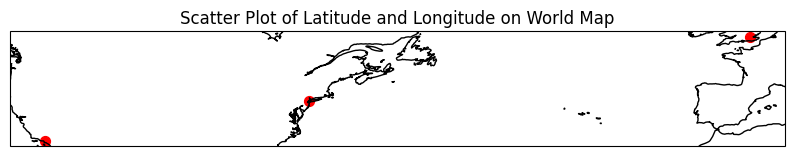

In [17]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Sample latitude and longitude data
lats = [40.7128, 34.0522, 51.5074]  # latitudes
lons = [-74.0060, -118.2437, -0.1278]  # longitudes
sizes = 50  # marker sizes

# Create a new figure
plt.figure(figsize=(10, 9))

# Create a Cartopy map with the PlateCarree projection (latitude and longitude)
ax = plt.axes(projection=ccrs.PlateCarree())

# Add coastlines
ax.coastlines()

# Plot scatter points
sc = ax.scatter(lons, lats, s=sizes, color='red', transform=ccrs.PlateCarree())

# Add title
plt.title('Scatter Plot of Latitude and Longitude on World Map')

# Show plot
plt.show()
